In [2]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import glob
from os import path
import xarray as xr
from matplotlib.colors import Normalize, LinearSegmentedColormap
import matplotlib.colors as colors
import scipy.stats as stats
from netCDF4 import Dataset
from scipy.stats import pearsonr
import wrf
import sys
from datetime import date

from mmctools.plotting import TaylorDiagram
from mmctools.helper_functions import theta_to_T, lowess_mean, calc_uv, calc_wind, w_s, T_d
from mmctools.wrf.utils import Tower, tsout_seriesReader, write_tslist_file
import matplotlib.gridspec as gridspec
from string import ascii_lowercase
import matplotlib.patches as patches
import skimage.morphology
import matplotlib.colors
sys.path.append('/Users/hawbecke/Code/Python/')
#sys.path.append('/glade/u/home/hawbecke/Code/Python/')
from pydicts.baybreezedict import DetectBayBreeze, spatial_breeze_check, find_onshore_minmax
from pydicts.obsdict import get_FINO_obs
from scipy import misc
from scipy.ndimage import gaussian_filter
from copy import deepcopy
import matplotlib.dates as mpdates
from matplotlib import transforms


# Data directories and case initialization:

In [4]:
#wrf_dir    = '/glade/scratch/hawbecke/WRF/ATEC/Chesapeake/20190716to20190801/'
wrf_dir  = '/Users/hawbecke/Research/Chesapeake/Data/WRF/20190716to20190801/'
save_dir = '/Users/hawbecke/Research/Chesapeake/Papers/NumericalDetection/img/'

restarts   = ['CBB_2019071518', 'CBB_2019071718', 'CBB_2019071918', 'CBB_2019072118', 
              'CBB_2019072318', 'CBB_2019072518', 'CBB_2019072718', 'CBB_2019072918']

wrf_start  = ['2019-07-15 18:00:00','2019-07-17 18:00:00','2019-07-19 18:00:00','2019-07-21 18:00:00',
              '2019-07-23 18:00:00','2019-07-25 18:00:00','2019-07-27 18:00:00','2019-07-29 18:00:00',]

from publications.Chesapeake.CBB_case_dict import case_dict
cases = list(case_dict.keys())

#cases = ['GFSR_YSU_CHRN_GFS_NOSK_3DOM','ERAI_YSU_CHRN_OST_NOSK_4DOM','ERA5_YSU_CHRN_ER5_NOSK_3DOM']

ncases   = len(cases)
case_dom = [3]*ncases


# Get WRF data to test:

In [5]:
day_of_interest = '2019-07-16 20:00:00'
case_of_interest = 'ERAI_YSU_CHRN_OST_NOSK_4DOM'

wrfout_files = sorted(glob.glob('{}{}/{}/wrfout_d0{}*'.format(wrf_dir,case_of_interest,restarts[0],case_dom[0])))

for wrfout_file in wrfout_files:
    if day_of_interest.replace(' ','_') in wrfout_file:
        file_of_interest = wrfout_file

wrfout = xr.open_dataset(file_of_interest)
wrfout = np.squeeze(wrfout)
wrfinput = xr.open_dataset('{}{}/{}/wrfinput_d0{}'.format(wrf_dir,cases[0],restarts[0],case_dom[0]))

land_mask  = np.squeeze(wrfinput.LANDMASK)
hgt        = np.squeeze(wrfinput.HGT)
water_mask = land_mask.copy().where(land_mask==0.0) + 1.0
lat  = wrfout.XLAT
lon  = wrfout.XLONG

nx = len(wrfout.west_east)
ny = len(wrfout.south_north)
dx = wrfout.DX/1000.0
dy = wrfout.DY/1000.0
x = np.arange(0,nx)*dx
y = np.arange(0,nx)*dy
xy,yx = np.meshgrid(x,y)

t2   = wrfout.T2.where(land_mask == 1.0)
u10  = wrfout.U10.where(land_mask == 1.0)
v10  = wrfout.V10.where(land_mask == 1.0)
sfcP = wrfout.PSFC.where(land_mask == 1.0)
temp = np.squeeze(wrfout.T)
z_f = (np.squeeze(wrfout.PH) + np.squeeze(wrfout.PHB))/9.8 - np.squeeze(wrfout.HGT)
zs_f = 0.5*(z_f[1:,:,:]+z_f[:-1,:,:])

vel10,dir10 = calc_wind(wrfout,u='U10',v='V10')
vel10 = vel10.where(land_mask == 1.0)
dir10 = dir10.where(land_mask == 1.0)

top_ind = 18
bot_ind = 0

u = wrfout.U[top_ind,:,:].data
v = wrfout.V[top_ind,:,:].data

u = 0.5*(u[:,1:] + u[:,:-1])
v = 0.5*(v[1:,:] + v[:-1,:])
wdir1km = 180. + np.degrees(np.arctan2(u, v))

# Get obs for comparison:

In [6]:
obs_dir = '/Users/hawbecke/Research/Chesapeake/Data/Obs/'
awos_ds = xr.open_dataset('{}AWOS/AWOS_2019to2020.nc'.format(obs_dir))
asos_ds = xr.open_dataset('{}ASOS/ASOS_2019to2020.nc'.format(obs_dir))

# Add APG data into AWOS
apg_ds  = xr.open_dataset('{}APG/APG_data_2019.nc'.format(obs_dir))
apg_stn_list = list(apg_ds.station.data)
for ss,apg_stn in enumerate(apg_stn_list):
    if apg_stn == 'PAA':
        apg_stn_list[ss] = 'APG'
apg_ds = apg_ds.assign_coords({'station': apg_stn_list})
non_apg_list = apg_stn_list.copy()
non_apg_list.remove('APG')
apg_ds = apg_ds.drop_sel(station=non_apg_list)
apg_ds = apg_ds.drop(['rh','gust','radt','rain','alt'])

temp = awos_ds.sel(station='APG').combine_first(apg_ds)
temp = temp.squeeze()
temp = temp.expand_dims('station')

lat_da = xr.DataArray([float(apg_ds.lat)], dims=('station'))
lon_da = xr.DataArray([float(apg_ds.lon)], dims=('station'))

temp = temp.assign_coords({'lat':lat_da})
temp = temp.assign_coords({'lon':lon_da})

awos_ds = awos_ds.drop_sel(station=['APG'])

awos_ds = xr.merge([awos_ds,temp])

near_shore_stations = ['APG', 'BWI', 'MTN', 'NAK', 'NHK', 'NUI']
inland_station      = ['IAD']

# Functions used:

In [7]:
def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap

def cmap_map(function, cmap):
    """ Applies function (which should operate on vectors of shape 3: [r, g, b]), on colormap cmap.
    This routine will break any discontinuous points in a colormap.
    """
    cdict = cmap._segmentdata
    step_dict = {}
    # Firt get the list of points where the segments start or end
    for key in ('red', 'green', 'blue'):
        step_dict[key] = list(map(lambda x: x[0], cdict[key]))
    step_list = sum(step_dict.values(), [])
    step_list = np.array(list(set(step_list)))
    # Then compute the LUT, and apply the function to the LUT
    reduced_cmap = lambda step : np.array(cmap(step)[0:3])
    old_LUT = np.array(list(map(reduced_cmap, step_list)))
    new_LUT = np.array(list(map(function, old_LUT)))
    # Now try to make a minimal segment definition of the new LUT
    cdict = {}
    for i, key in enumerate(['red','green','blue']):
        this_cdict = {}
        for j, step in enumerate(step_list):
            if step in step_dict[key]:
                this_cdict[step] = new_LUT[j, i]
            elif new_LUT[j,i] != old_LUT[j, i]:
                this_cdict[step] = new_LUT[j, i]
        colorvector = list(map(lambda x: x + (x[1], ), this_cdict.items()))
        colorvector.sort()
        cdict[key] = colorvector

    return colors.LinearSegmentedColormap('colormap',cdict,1024)

new_cmap = truncate_colormap(plt.cm.terrain, 0.3, 0.8)
new_cmap.set_bad(color='darkblue')

light_cmap = cmap_map(lambda x: x/4 + 0.75, new_cmap)
light_cmap.set_bad(color='lightsteelblue')
light_cmap.set_bad(color='aliceblue')

def find_max_in_row(x):
    expected_x = x[0] + 1
    count = 1
    max_count = 1
    for i in x[1:]:
        if i == expected_x:
            count += 1
            expected_x += 1
            if count > max_count: max_count = count
        else:
            if count > max_count: max_count = count
            count = 1
            expected_x = i + 1
    return(max_count)

def validate_bay_breeze(bb_day_dict,
                        use_neighbors=False,
                        check_rain_clouds=True,
                        detect_option=1,
                        verbose=False):
    
    neighbor_threshold = 1.0 # Neighbors don't need to average 2... set to something lower
    bb_day        = bb_day_dict['bb_day']
    neighbor_day  = bb_day_dict['neighbor_day']
    cloud_day     = bb_day_dict['cloud_day']
    rain_day      = bb_day_dict['rain_day']
    
    cloud_tot = cloud_day.sum().data
    rain_tot  = rain_day.sum().data
    #if stn == 'MTN' and dd == 1: wefwef


    # Check rain or clouds here:
    if check_rain_clouds:
        # Subtract from bb_day if cloud_day == 1.0
        bb_no_clouds = bb_day * ((cloud_day - 1.0)*-1)
        bb_eq_2 = np.where(bb_no_clouds.data==2.0)[0]
    else:
        bb_eq_2 = np.where(bb_day.data==2.0)[0]


    if len(bb_eq_2) >= 1:
        max_count = find_max_in_row(bb_eq_2)
    else:
        max_count = 0
        
    bb_detected = max_count >= 2
    
    if verbose: print(bb_detected)
        

    if use_neighbors:
        
        good_neighbors = np.where(neighbor_day.data>=neighbor_threshold)[0]    
        if len(good_neighbors) >= 2:
            max_neighbor_count = find_max_in_row(good_neighbors)
        else:
            max_neighbor_count = 0
        if verbose: print('good neighbors: ', max_neighbor_count)
        if detect_option == 1:
            bb_detected = (max_count >= 2) and (max_neighbor_count >= 2)
        elif detect_option == 2:
            bb_detected = (max_count >= 2) and ((max_neighbor_count >= 2) or (neighbor_day.mean() > 0.75))
        elif detect_option == 3:
            if verbose: print(bb_day.mean(),neighbor_day.mean())
            bb_detected = ((max_count >= 2) and (max_neighbor_count >= 2)) or \
                          ((len(np.where(bb_day.data>=1.0)[0])/len(bb_day) >= 0.5) and \
                           (len(np.where(neighbor_day.data>=0.5)[0])/len(neighbor_day) >= 0.5))
        if verbose: print(bb_detected)

            
    if check_rain_clouds:
        # Check for rain today:
        is_rainy = (rain_tot > 1.0)
        if verbose: print('is rainy: ',is_rainy)
        bb_detected = bb_detected and (not is_rainy)
        if verbose: print(bb_detected)

            
            
    return(bb_detected)

                    


def rainbow_text(x,y,ls,lc,align='horizontal',fig=None,ax=None,**kw):
    """
    Take a list of strings ``ls`` and colors ``lc`` and place them next to each
    other, with text ls[i] being shown in color lc[i].

    This example shows how to do both vertical and horizontal text, and will
    pass all keyword arguments to plt.text, so you can set the font size,
    family, etc.
    """
    t = plt.gca().transData
    if fig is None:
        fig = plt.gcf()

    #plt.show()

    if align == 'horizontal':
        for s,c in zip(ls,lc):
            if ax is None:
                text = plt.text(x,y,s+" ",color=c, transform=t, **kw)
            else:
                text = ax.text(x,y,s+" ",color=c, transform=t, **kw)
            text.draw(fig.canvas.get_renderer())
            ex = text.get_window_extent()
            t = transforms.offset_copy(text._transform, x=ex.width, units='dots')

    if align == 'vertical':
        for s,c in zip(ls,lc):
            text = plt.text(x,y,s+" ",color=c, transform=t,
                    rotation=90,va='bottom',ha='center',**kw)
            text.draw(fig.canvas.get_renderer())
            ex = text.get_window_extent()
            t = transforms.offset_copy(text._transform, y=ex.height, units='dots')



def convert_breeze_dict_to_xr(breeze_dict):
    for kk,key in enumerate(breeze_dict.keys()):
        if key == 'breeze':
            var = breeze_dict['good_wdir'].copy()
            var.data = breeze_dict[key]
        else:
            var = breeze_dict[key]
            var.name = key
        if kk == 0:
            ds = xr.Dataset({key: var})
        else:
            ds = xr.merge([ds,var])
            
    ds = ds.expand_dims('datetime')
    dtime = ds.XTIME.expand_dims('datetime')
    ds = ds.drop('XTIME')
    ds['datetime'] = dtime
    return(ds)

In [40]:
def compute_skill_metrics(cf_dict,rmv_close=False):
    for case in cf_dict:
        for mm,meth in enumerate(cf_dict[case]):
            TP = cf_dict[case][meth]['TP']
            TN = cf_dict[case][meth]['TN']
            FP = cf_dict[case][meth]['FP']
            if rmv_close: 
                TP += cf_dict[case][meth]['close']
                FP -= cf_dict[case][meth]['close']
            FN = cf_dict[case][meth]['FN']
            recall    = TP/(TP+FN)
            try:
                precision = TP/(TP+FP)
            except:
                precision = 0.0
            if precision+recall > 0.0:
                F1 = 2.0*((precision*recall)/(precision+recall))
            else:
                F1 = 0.0
            try:
                FAR = FP/(FP+TP)
            except:
                FAR = 0.0
            CSI = TP/(TP+FN+FP)
            acc = (TP+TN)/(TP+TN+FP+FN)
            mcc = ((TP*TN) - (FP*FN))/(np.sqrt((TP+FP)*(TP+FN)*(TN+FP)*(TN+FN)))
            inform = recall + (TN/(TN+FP)) - 1
            mk  = precision + (TN/(TN+FN)) - 1 
            pct_of_events = (TP+FN)/(TN+FP)

            cf_dict[case][meth]['recall']    = recall    # 0 to 1 (good)
            cf_dict[case][meth]['precision'] = precision # 0 to 1 (good)
            cf_dict[case][meth]['F1']        = F1        # 0 to 1 (good)
            cf_dict[case][meth]['FAR']       = FAR       # 0 (good) to 1
            cf_dict[case][meth]['CSI']       = CSI       # 0 to 1 (good)
            cf_dict[case][meth]['Accuracy']  = acc       # 0 to 1 (good)
            cf_dict[case][meth]['MCC']       = mcc
            cf_dict[case][meth]['IF']        = inform    # varies between -1 and 1
            cf_dict[case][meth]['MK']        = mk        # varies between -1 and 1
            cf_dict[case][meth]['pct']       = pct_of_events

            print(case,meth,cf_dict[case][meth]['pct'])
    return(cf_dict)


# Calculate onshore min and max:

## Figure 1:

/Users/hawbecke/Code/Python/pydicts/baybreezedict.py:1010: RuntimeWarning: invalid value encountered in true_divide
  window_filter = window_dist / window_dist
/Users/hawbecke/Code/Python/pydicts/baybreezedict.py:1016: RuntimeWarning: divide by zero encountered in true_divide
  (xy[:window_len+1,:window_len+1] - xy[window_center,window_center])))/(np.pi) - 90.0)
/Users/hawbecke/Code/Python/pydicts/baybreezedict.py:1016: RuntimeWarning: invalid value encountered in true_divide
  (xy[:window_len+1,:window_len+1] - xy[window_center,window_center])))/(np.pi) - 90.0)
/Users/hawbecke/Code/Python/pydicts/baybreezedict.py:1021: RuntimeWarning: divide by zero encountered in true_divide
  (xy[:window_len+1,:window_len+1] - xy[window_center,window_center])))/(np.pi)
/Users/hawbecke/Code/Python/pydicts/baybreezedict.py:1021: RuntimeWarning: invalid value encountered in true_divide
  (xy[:window_len+1,:window_len+1] - xy[window_center,window_center])))/(np.pi)
/Users/hawbecke/Code/Python/pydicts/ba

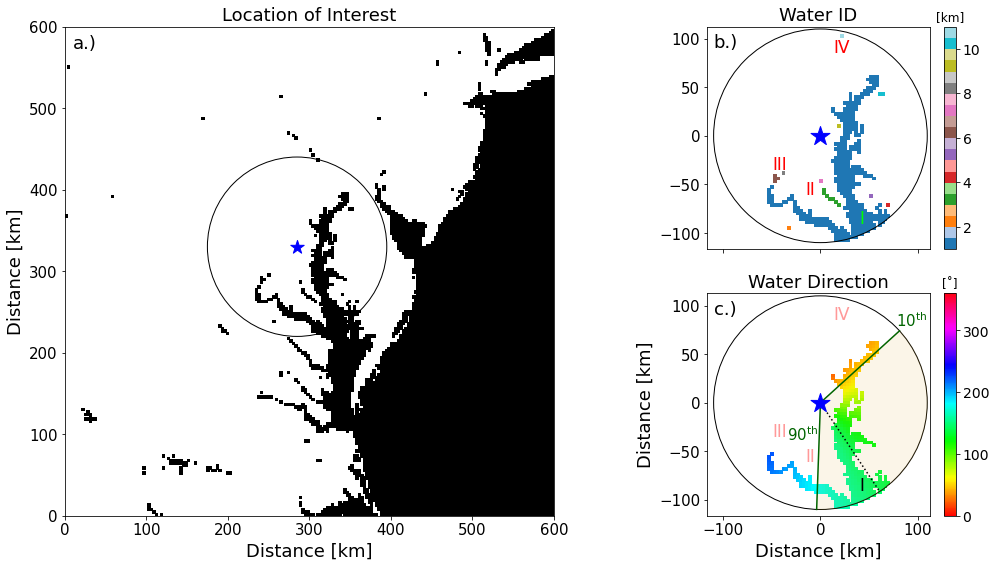

In [8]:
test = True
i_s,j_s = 95,110
i_e,j_e = i_s+1,j_s+1
fig = find_onshore_minmax( land_mask,
                         max_water_dist = 110.0,
                         low_pct_0 = 90.0,
                         upr_pct_0 = 10.0,
                         max_deg_range = 225.0,
                         test_mode = test,
                         min_water_size=20, 
                         i_s=i_s,i_e=i_e,j_s=j_s,j_e=j_e) 
fig.savefig('{}DefiningOnshore.pdf'.format(save_dir), bbox_inches = 'tight',pad_inches = 0.1)

In [9]:
onshore_min_max_path = '{}onshore_min_max.nc'.format(wrf_dir)
if path.exists(onshore_min_max_path):
    print('loading in onshore min/max dataset!')
    onshore_min_max_ds = xr.open_dataset(onshore_min_max_path)
    onshore_min = onshore_min_max_ds.onshore_min
    onshore_max = onshore_min_max_ds.onshore_max
else:

    test = False
    i_s,j_s = 105,110
    i_e,j_e = i_s+10,j_s+1
    if not test:
        onshore_min_max_ds = find_onshore_minmax(land_mask,
                                                 max_water_dist = 110.0,
                                                 low_pct_0 = 90.0,
                                                 upr_pct_0 = 10.0,
                                                 max_deg_range = 350.0,
                                                 test_mode = test,
                                                 min_water_size=20, 
                                                 i_s=i_s,i_e=i_e,j_s=j_s,j_e=j_e)

        onshore_min = onshore_min_max_ds.onshore_min
        onshore_max = onshore_min_max_ds.onshore_max
    else:
        _ = find_onshore_minmax( land_mask,
                                 max_water_dist = 110.0,
                                 low_pct_0 = 90.0,
                                 upr_pct_0 = 10.0,
                                 max_deg_range = 225.0,
                                 test_mode = test,
                                 min_water_size=20, 
                                 i_s=i_s,i_e=i_e,j_s=j_s,j_e=j_e)        
    onshore_min_max_ds.to_netcdf(onshore_min_max_path)

loading in onshore min/max dataset!


# Check onshore min/max with what was determined in previous study:

## Figure 2:

/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:8: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:18: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:32: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is depre

Station: APG
	Onshore min - Old: 50.000	New: 104.086
	Onshore max - Old: 200.000	New: 200.313
Station: BWI
	Onshore min - Old: 60.000	New: 62.050
	Onshore max - Old: 160.000	New: 162.680
Station: MTN
	Onshore min - Old: 70.000	New: 80.538
	Onshore max - Old: 190.000	New: 182.490
Station: NAK
	Onshore min - Old: 20.000	New: 29.745
	Onshore max - Old: 190.000	New: 194.036
104,85
Station: NHK
	Onshore min - Old: 0.000	New: -0.000
	Onshore max - Old: 170.000	New: 194.800
Station: NUI
	Onshore min - Old: 0.000	New: 1.700
	Onshore max - Old: 150.000	New: 215.916


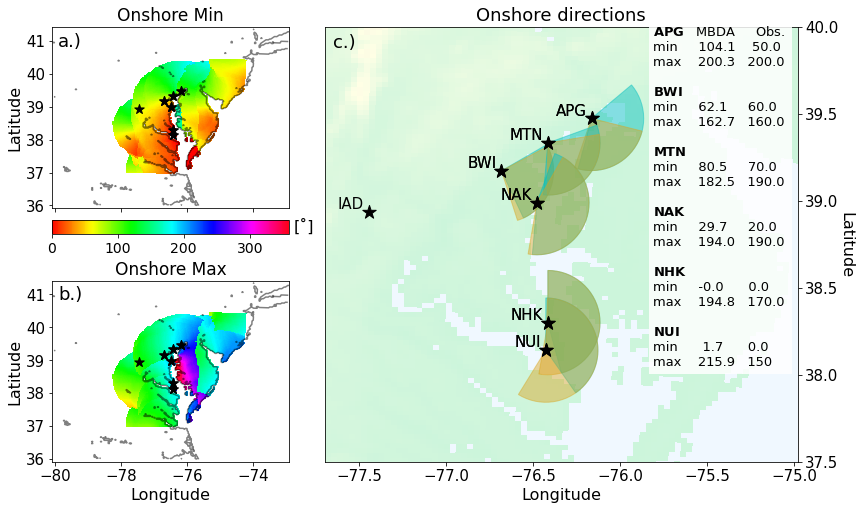

In [10]:
fig = plt.figure(figsize=(14,8))
fig.subplots_adjust(wspace=0.0,hspace=0.4)

dist_plt = plt.subplot2grid((2,3),(0,0),aspect='equal')
onshore_min_plt = onshore_min.copy()
onshore_min_plt[np.where(onshore_min<=0.0)] += 360
dist_pcol = dist_plt.pcolormesh(lon,lat,onshore_min,norm=Normalize(0,360),
                                cmap=plt.cm.hsv,rasterized=True)
dist_plt.contour(lon,lat,land_mask,levels=[0.5],colors='k',alpha=0.5)
dist_plt.set_title('Onshore Min',size=17)
dist_plt.set_aspect('equal')
dist_plt.tick_params(labelsize=15,labelbottom=False)
dist_plt.text(-79.9,41.25,'a.)',size=18,ha='left',va='top')
dist_plt.set_ylabel('Latitude',size=16)

deg_plt = plt.subplot2grid((2,3),(1,0),aspect='equal',sharex=dist_plt)
deg_plt.pcolormesh(lon,lat,onshore_max,norm=Normalize(0,360),
                   cmap=plt.cm.hsv,rasterized=True)
deg_plt.contour(lon,lat,land_mask,levels=[0.5],colors='k',alpha=0.5)
deg_plt.set_title('Onshore Max',size=17)
deg_plt.set_aspect('equal')
deg_plt.tick_params(labelsize=15)
deg_plt.text(-79.9,41.25,'b.)',size=18,ha='left',va='top')
deg_plt.set_ylabel('Latitude',size=16)
deg_plt.set_xlabel('Longitude',size=16)

hgt_plt = plt.subplot2grid((2,3),(0,1),aspect='equal',colspan=2,rowspan=2)
hgt = hgt.where(land_mask == 1.0)
#hgt[np.where(land_mask==0.0)] = -100
hgt_plt.pcolormesh(lon,lat,hgt,
                   cmap=light_cmap,
                   norm=Normalize(0,1200),rasterized=True)
#plt.colorbar()
hgt_plt.tick_params(labelsize=15,labelright=True,right=True,labelleft=False,left=False)
hgt_plt.set_title('Onshore directions',size=18)
hgt_plt.set_xlim(-77.70,-74.98)
hgt_plt.set_ylim(37.5,40.0)
hgt_plt.text(-77.65,39.96,'c.)',size=18,ha='left',va='top')
hgt_plt.set_ylabel('Latitude',size=16,rotation=-90,labelpad=15.0)
hgt_plt.yaxis.set_label_position("right")
hgt_plt.set_xlabel('Longitude',size=16)
new_and_old = {}

cell_text = []
rows = []


# Plot inland station:
stn_ds = awos_ds.sel(station=inland_station[0])
stn_lat = stn_ds.lat.data
stn_lon = stn_ds.lon.data
dist_from_stn = ((lon-stn_lon)**2 + (lat-stn_lat)**2)**0.5
stn_j,stn_i = np.where(dist_from_stn == np.nanmin(dist_from_stn))
stn_j = int(stn_j)
stn_i = int(stn_i)
cell_text.append(['{0:4.1f}'.format(onshore_min.data[stn_j,stn_i]),'{0:4.1f}'.format(stn_ds.onshore_min.data)])
rows.append('{} min.'.format(inland_station[0]))
cell_text.append(['{0:4.1f}'.format(onshore_max.data[stn_j,stn_i]),'{0:4.1f}'.format(stn_ds.onshore_max.data)])
rows.append('{} max.'.format(inland_station[0]))
x, y = stn_lon,stn_lat

dist_plt.scatter(x,y,c='k',zorder=10,marker='*',s=100)
deg_plt.scatter(x,y,c='k',zorder=10,marker='*',s=100)
hgt_plt.scatter(x,y,c='k',zorder=10,marker='*',s=200)
hgt_plt.text(x-0.03,y,inland_station[0],size=15,ha='right',va='bottom')
for ss,stn in enumerate(near_shore_stations):
    #if stn == 'APG':
    #    stn_ds = apg_ds.sel(station=stn)
    if stn in awos_ds.station:
        stn_ds = awos_ds.sel(station=stn)
    elif stn in asos_ds.station:
        stn_ds = asos_ds.sel(station=stn)
    stn_lat = stn_ds.lat.data
    stn_lon = stn_ds.lon.data
    dist_from_stn = ((lon-stn_lon)**2 + (lat-stn_lat)**2)**0.5
    stn_j,stn_i = np.where(dist_from_stn == np.nanmin(dist_from_stn))
    stn_j = int(stn_j)
    stn_i = int(stn_i)
    if stn == 'NHK': print('{},{}'.format(stn_i,stn_j))
    new_and_old[stn] = {'min': {'new': onshore_min.data[stn_j,stn_i], 'old':float(stn_ds.onshore_min.data)},
                        'max': {'new': onshore_max.data[stn_j,stn_i], 'old':float(stn_ds.onshore_max.data)}}
    
    print('Station: {}'.format(stn))
    print('\tOnshore min - Old: {0:4.3f}\tNew: {1:4.3f}'.format(stn_ds.onshore_min.data,onshore_min.data[stn_j,stn_i]))
    print('\tOnshore max - Old: {0:4.3f}\tNew: {1:4.3f}'.format(stn_ds.onshore_max.data,onshore_max.data[stn_j,stn_i]))
    cell_text.append(['{0:4.1f}'.format(onshore_min.data[stn_j,stn_i]),'{0:4.1f}'.format(stn_ds.onshore_min.data)])
    rows.append('{} min.'.format(stn))
    cell_text.append(['{0:4.1f}'.format(onshore_max.data[stn_j,stn_i]),'{0:4.1f}'.format(stn_ds.onshore_max.data)])
    rows.append('{} max.'.format(stn))
    x, y = stn_lon,stn_lat
    for rad in ['old','new']:
        if rad == 'old':
            pts  = np.arange(stn_ds.onshore_min.data,stn_ds.onshore_max.data,5.0)
            fill_c = 'c'
        else:
            pts  = np.arange(onshore_min[stn_j,stn_i],onshore_max[stn_j,stn_i],5.0)
            fill_c = 'goldenrod'
            
        npts = pts.size
        fill_x = [x]
        fill_y = [y]
        for dd,wdir in enumerate(pts):
            d = 270.0 - wdir    # Convert met degrees to polar
            plt_dist = -0.3 # Met degrees are FROM dir... need negative distance!
            fill_x.append(x+plt_dist*np.cos(np.radians(d)))
            fill_y.append(y+plt_dist*np.sin(np.radians(d)))

        dist_plt.scatter(x,y,c='k',zorder=10,marker='*',s=100)
        deg_plt.scatter(x,y,c='k',zorder=10,marker='*',s=100)
        hgt_plt.scatter(x,y,c='k',zorder=10,marker='*',s=200)
        hgt_plt.fill(fill_x, fill_y,alpha=0.45,lw=None,color=fill_c,zorder=2)
        hgt_plt.text(x-0.03,y,stn,size=15,ha='right',va='bottom')

'''
columns = ['new','old']
the_table = plt.table(cellText=cell_text,
                      colWidths=[0.15,0.15],
                      rowLabels=rows,
                      #rowColours=colors,
                      colLabels=columns,
                      loc='center',zorder=100)
the_table.set_fontsize(15)
'''
txt_f = ''
for ss,stn in enumerate(new_and_old):
    if ss == 0:
        txt_1 = r'$\bf{'+stn+'}$' + '  {0:^7}  {1:^6}\n'.format('MBDA','Obs.')
    else:
        txt_1 = r'$\bf{'+stn+'}$\n'
    txt_2 = '{0:<5}  {1:^7} {2:>6}\n'.format('min',
                                             '{0:4.1f}'.format(new_and_old[stn]['min']['new']),
                                             '{0:4.1f}'.format(new_and_old[stn]['min']['old']))
    txt_3 = '{0:<5} {1:^7} {2:>6}\n\n'.format('max',
                                              '{0:4.1f}'.format(new_and_old[stn]['max']['new']),
                                              '{0:4.1f}'.format(new_and_old[stn]['max']['old']))
    txt_f += (txt_1+txt_2+txt_3)
    
txt_f = txt_f[:-4]
plt.text(-75.81,38.05,txt_f,size=13,
         bbox=dict(facecolor='w', edgecolor='none', pad=5.0,alpha=0.85))

#cax = fig.add_axes([0.40,0.125,0.02,0.755])
cax = fig.add_axes([0.136,0.52,0.236,0.025])
cbar = plt.colorbar(dist_pcol,cax=cax,orientation='horizontal')
cax.tick_params(labelsize=14)
cax.set_title('[˚]',x=1.06,y=-0.25,size=16)
plt.savefig('{}OnshoreCompare.pdf'.format(save_dir), bbox_inches = 'tight',pad_inches = 0.1)
plt.show()

### What is the onshore min/max at Edgewood?

In [11]:
latoi,lonoi = 39.41,-76.297
dist_from_stn = ((lon-lonoi)**2 + (lat-latoi)**2)**0.5
stn_j,stn_i = np.where(dist_from_stn == np.nanmin(dist_from_stn))
stn_j = int(stn_j)
stn_i = int(stn_i)
print('{0:3.1f}--{1:3.1f}'.format(onshore_min.data[stn_j,stn_i],onshore_max.data[stn_j,stn_i]))

92.4--193.2


### Make Colormaps:

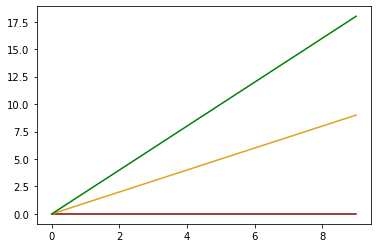

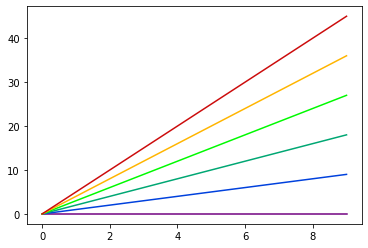

In [12]:
breeze_cmap = plt.cm.RdYlGn(np.linspace(0.1,0.9,3))
breeze_cmap = ['darkred','goldenrod','green']
for ll,lvl in enumerate(np.arange(0,3)):
    plt.plot(np.arange(0,10),np.arange(0,10)*ll,c=breeze_cmap[ll])
plt.show()
stn_colors = plt.cm.nipy_spectral(np.linspace(0.05,0.95,len(near_shore_stations)))
for ss,stn in enumerate(near_shore_stations):    
    plt.plot(np.arange(0,10),np.arange(0,10)*ss,c=stn_colors[ss])
plt.show()

## Define station dictionary:

In [13]:
stn_dict = {}
for ss,stn in enumerate(near_shore_stations):
    stn_dict[stn] = {}
    #if stn == 'APG':
    #    stn_ds = apg_ds.sel(station=stn)
    if stn in awos_ds.station:
        stn_ds = awos_ds.sel(station=stn)
    elif stn in asos_ds.station:
        stn_ds = asos_ds.sel(station=stn)
    stn_lat = stn_ds.lat.data
    stn_lon = stn_ds.lon.data
    dist_from_stn = ((lon-stn_lon)**2 + (lat-stn_lat)**2)**0.5
    stn_j,stn_i = np.where(dist_from_stn == np.nanmin(dist_from_stn))
    stn_j = int(stn_j)
    stn_i = int(stn_i)
    stn_dict[stn]['lat'] = float(stn_ds.lat.data)
    stn_dict[stn]['lon'] = float(stn_ds.lon.data)
    stn_dict[stn]['i'] = stn_i
    stn_dict[stn]['j'] = stn_j

# Load MBDA NetCDF files:

In [14]:
show_plot = True
init_vars = True

check_clouds = True
check_rain = True


breeze_ds_dict = {}
for cc,case in enumerate(cases):
    #breeze_ds_path = '{}{}/spatial_breeze_detection_CLDnRAIN_d0{}.nc'.format(wrf_dir,case,case_dom[cc])
    breeze_ds_path = '{}{}/spatial_breeze_detection_CLDnRAIN_d0{}_abs.nc'.format(wrf_dir,case,case_dom[cc])
    print(breeze_ds_path)
    if path.exists(breeze_ds_path):
        print('Numerical detection dataset already created!')
        breeze_ds_f = xr.open_dataset(breeze_ds_path)
        breeze_ds_dict[case] = breeze_ds_f
    else:
        print('No detection dataset... run NumericalBreezeDetection.py')


        for ww,wrfout_file in enumerate(wrfout_files[1:]):
            wrfout = xr.open_dataset(wrfout_file)
            wrfout = np.squeeze(wrfout)
            out_time = pd.to_datetime(wrfout.XTIME.data)
            if (out_time.hour >=13) & (out_time.hour <=22):
                time_str = date.strftime(pd.to_datetime(wrfout.XTIME.data),'%Y-%m-%d %H:%M')
                print(time_str)

                if init_vars:
                    wrfinput = xr.open_dataset('{}{}/{}/wrfinput_d0{}'.format(wrf_dir,cases[1],restarts[0],case_dom[0]))
                    land_mask  = np.squeeze(wrfinput.LANDMASK)
                    hgt        = np.squeeze(wrfinput.HGT)
                    water_mask = land_mask.copy().where(land_mask==0.0) + 1.0
                    lat  = wrfout.XLAT
                    lon  = wrfout.XLONG
                    z_f = (np.squeeze(wrfout.PH) + np.squeeze(wrfout.PHB))/9.8 - np.squeeze(wrfout.HGT)
                    zs_f = 0.5*(z_f[1:,:,:]+z_f[:-1,:,:])


                    rain = wrfout.RAINC + wrfout.RAINNC + wrfout.RAINSH
                    rain_prev = rain.copy()*0.0
                else:
                    rain = wrfout.RAINC + wrfout.RAINNC + wrfout.RAINSH - rain_prev

                rain_prev += rain            

                breeze_ds = spatial_breeze_check(onshore_min,
                                                 onshore_max,
                                                 wrfout,
                                                 land_mask=land_mask,
                                                 wdir_check='vertical',
                                                 dT_cutoff_pct=50.0,
                                                 check_rain=check_rain,
                                                 rain_da=rain,
                                                 check_clouds=check_clouds,
                                                 cloud_cutoff=0.7
                                                )


                if init_vars:
                    breeze_ds_f = breeze_ds.copy()
                    init_vars = False
                else:
                    breeze_ds_f = breeze_ds.combine_first(breeze_ds_f) 



                if show_plot:
                    u10 = wrfout.U10
                    v10 = wrfout.V10
                    vel10,dir10 = calc_wind(wrfout,u='U10',v='V10')
                    vel10 = vel10.where(land_mask == 1.0)
                    dir10 = dir10.where(land_mask == 1.0)

                    fig = plt.figure(figsize=(16,20))
                    nrow,ncol = 4,4
                    tmp_plt = plt.subplot2grid((nrow,ncol),(0,0),colspan=2,aspect='equal')
                    dT_lvl = np.nanmax(abs(breeze_ds.dT_full.sel(datetime=time_str)))
                    tmp_plt_pc = tmp_plt.pcolormesh(lon,lat,breeze_ds.dT_full.sel(datetime=time_str),
                                                    cmap=plt.cm.RdYlBu,norm=Normalize(-dT_lvl,dT_lvl))
                    tmp_cbar = plt.colorbar(tmp_plt_pc,ax=tmp_plt)
                    tmp_cbar.ax.tick_params(labelsize=13)
                    tmp_plt.contour(lon,lat,land_mask,levels=[0.5],colors='k',alpha=0.5)
                    tmp_plt.contour(lon,lat,breeze_ds.dT.sel(datetime=time_str),levels=[breeze_ds.dT_cutoff],colors='limegreen')
                    tmp_plt.tick_params(labelsize=15,labelbottom=False)
                    tmp_plt.set_title('$\Delta_T$',size=18)


                    vel_plt = plt.subplot2grid((nrow,ncol),(1,0),colspan=2,aspect='equal',sharex=tmp_plt,sharey=tmp_plt)
                    vel_plt_pc = vel_plt.pcolormesh(lon,lat,vel10,cmap=plt.cm.YlOrRd)
                    vel_cbar = plt.colorbar(vel_plt_pc,ax=vel_plt)
                    vel_cbar.ax.tick_params(labelsize=13)
                    vel_plt.contour(lon,lat,land_mask,levels=[0.5],colors='k',alpha=0.5)
                    vel_plt.contour(lon,lat,breeze_ds.dU.sel(datetime=time_str),levels=[0.5],colors='b')
                    vel_plt.tick_params(labelsize=15)
                    vel_plt.set_title('Wind Speed',size=18)

                    ons_plt = plt.subplot2grid((nrow,ncol),(0,2),colspan=2,aspect='equal',sharex=tmp_plt,sharey=tmp_plt)
                    ons_plt_pc = ons_plt.pcolormesh(lon,lat,onshore_min,cmap=plt.cm.viridis,norm=Normalize(0,360))
                    ons_cbar = plt.colorbar(ons_plt_pc,ax=ons_plt)
                    ons_cbar.ax.tick_params(labelsize=13)
                    ons_plt.contour(lon,lat,land_mask,levels=[0.5],colors='k',alpha=0.5)
                    ons_plt.tick_params(labelsize=15,labelbottom=False)
                    ons_plt.set_title('Onshore Min',size=18)

                    dir_plt = plt.subplot2grid((nrow,ncol),(1,2),colspan=2,aspect='equal',sharex=tmp_plt,sharey=tmp_plt)
                    dir_plt_pc = dir_plt.pcolormesh(lon,lat,dir10,cmap=plt.cm.viridis,norm=Normalize(0,360))
                    dir_cbar = plt.colorbar(dir_plt_pc,ax=dir_plt)
                    dir_cbar.ax.tick_params(labelsize=13)
                    dir_plt.contour(lon,lat,land_mask,levels=[0.5],colors='k',alpha=0.5)
                    #dir_plt.contour(lon,lat,onshore_winds,levels=[1.0],colors='r')
                    qint = 7
                    dir_plt.quiver(lon[::qint,::qint],lat[::qint,::qint],u10[::qint,::qint],v10[::qint,::qint])
                    dir_plt.contour(lon,lat,breeze_ds.good_wdir.sel(datetime=time_str),levels=[1.0],colors='r')
                    dir_plt.tick_params(labelsize=15)
                    dir_plt.set_title('Wind Direction',size=18)


                    crt_plt = plt.subplot2grid((nrow,ncol),(2,0),rowspan=2,colspan=4,aspect='equal',sharex=tmp_plt,sharey=tmp_plt)
                    crt_plt_pc = crt_plt.pcolormesh(lon,lat,land_mask,cmap=plt.cm.binary,norm=Normalize(0,5.0))
                    #plt.colorbar(crt_plt_pc,ax=crt_plt)
                    crt_plt.contour(lon,lat,breeze_ds.good_wdir.sel(datetime=time_str),levels=[1.0],colors='r',alpha=0.5)
                    crt_plt.contour(lon,lat,breeze_ds.dT.sel(datetime=time_str),levels=[breeze_ds.dT_cutoff],colors='limegreen',alpha=0.5)
                    crt_plt.contour(lon,lat,breeze_ds.dU.sel(datetime=time_str),levels=[0.5],colors='b',alpha=0.5)
                    crt_plt.plot(0.0,0.0,c='r',label='Wind Direction')
                    crt_plt.plot(0.0,0.0,c='limegreen',label='∆T > 0')
                    crt_plt.plot(0.0,0.0,c='b',label='Wind Ramp')
                    crt_plt.set_xlim(np.nanmin(lon),np.nanmax(lon))
                    crt_plt.set_ylim(np.nanmin(lat),np.nanmax(lat))
                    good_areas = crt_plt.contourf(lon,lat,breeze_ds.breeze.sel(datetime=time_str),levels=[1.9,4.1],colors='k',
                                                  alpha=0.25,hatches=['+++', '/'],label='Test')
                    artists, labels = good_areas.legend_elements()
                    #crt_plt.legend(artists, ['Good Points'], handleheight=2)
                    crt_plt.legend(frameon=False,fontsize=18,loc=4)
                    crt_plt.tick_params(labelsize=15)
                    crt_plt.set_title(time_str,size=18)

                    if check_clouds: crt_plt.contour(lon,lat,breeze_ds.is_cloudy.sel(datetime=time_str),levels=[0.5],colors='m')

                    if check_rain: crt_plt.contour(lon,lat,breeze_ds.is_raining.sel(datetime=time_str),levels=[0.5],colors='c')


                    for ss,stn in enumerate(near_shore_stations):
                        stn_color = int(breeze_ds.breeze.sel(datetime=time_str,
                                                           south_north=stn_dict[stn]['j'],
                                                           west_east=stn_dict[stn]['i']).data)
                        crt_plt.scatter(stn_dict[stn]['lon'],stn_dict[stn]['lat'],
                                    facecolor=breeze_cmap[stn_color],s=100,
                                    edgecolor='k',zorder=4,alpha=0.65)
                        crt_plt.text(stn_dict[stn]['lon']-0.1,stn_dict[stn]['lat'],stn,size=13,ha='right',va='center')


                    plt.show()


        breeze_ds_f['onshore_min'] = onshore_min
        breeze_ds_f['onshore_max'] = onshore_max
        breeze_ds_f['land_mask'] = land_mask

        breeze_ds_f.attrs = {'WRF_DIR':'/'.join(wrfout_files[0].split('/')[:-1]),
                              'domain':wrfout_files[0].split('/')[-1].split('_')[1]}

        #breeze_ds_f.to_netcdf('{}/spatial_breeze_detection_{}.nc'.format(breeze_ds_f.WRF_DIR,breeze_ds_f.domain))

/Users/hawbecke/Research/Chesapeake/Data/WRF/20190716to20190801/GFSR_YSU_CHRN_GFS_NOSK_3DOM/spatial_breeze_detection_CLDnRAIN_d03_abs.nc
Numerical detection dataset already created!
/Users/hawbecke/Research/Chesapeake/Data/WRF/20190716to20190801/GFSR_YSU_CHRN_GFS_SKNT_3DOM/spatial_breeze_detection_CLDnRAIN_d03_abs.nc
Numerical detection dataset already created!
/Users/hawbecke/Research/Chesapeake/Data/WRF/20190716to20190801/GFSR_YSU_CHRN_GHR_NOSK_3DOM/spatial_breeze_detection_CLDnRAIN_d03_abs.nc
Numerical detection dataset already created!
/Users/hawbecke/Research/Chesapeake/Data/WRF/20190716to20190801/GFSR_YSU_CHRN_GHR_SKNT_3DOM/spatial_breeze_detection_CLDnRAIN_d03_abs.nc
Numerical detection dataset already created!
/Users/hawbecke/Research/Chesapeake/Data/WRF/20190716to20190801/GFSR_YSU_CHRN_MOD_NOSK_3DOM/spatial_breeze_detection_CLDnRAIN_d03_abs.nc
Numerical detection dataset already created!
/Users/hawbecke/Research/Chesapeake/Data/WRF/20190716to20190801/GFSR_YSU_CHRN_MOD_SKNT_3DO

# Load example day:

In [15]:
day_of_interest = '2019-07-16 20:00:00'
case_of_interest = 'ERAI_YSU_CHRN_OST_NOSK_4DOM'
wrfout = np.squeeze(xr.open_dataset('{}{}/CBB_2019071518/wrfout_d03_2019-07-16_20:00:00'.format(wrf_dir,case_of_interest)))
breeze_ds = breeze_ds_dict[case_of_interest].sel(datetime=day_of_interest)

z_f = (np.squeeze(wrfout.PH) + np.squeeze(wrfout.PHB))/9.8 - np.squeeze(wrfout.HGT)
zs_f = 0.5*(z_f[1:,:,:]+z_f[:-1,:,:])

rain = wrfout.RAINC + wrfout.RAINNC + wrfout.RAINSH
show_plot = True
init_vars = True

check_clouds = True
check_rain = True
breeze_ds = spatial_breeze_check(onshore_min,
                                 onshore_max,
                                 wrfout,
                                 land_mask=land_mask,
                                 wdir_check='vertical',
                                 dT_cutoff_pct=50.0,
                                 check_rain=check_rain,
                                 rain_da=rain,
                                 check_clouds=check_clouds,
                                 cloud_cutoff=0.7
                                )
breeze_ds = np.squeeze(breeze_ds)

wspd_cmap = truncate_colormap(plt.cm.GnBu_r, 0.0, 1.0)
wspd_cmap.set_bad(color='darkblue')

light_wspd_cmap = cmap_map(lambda x: x/1.4 + 0.3, wspd_cmap)
light_wspd_cmap.set_bad(color='lightsteelblue')
light_wspd_cmap.set_bad(color='aliceblue')

onekm_ind = 18

u10 = wrfout.U10
v10 = wrfout.V10

u1km_s = wrfout.U.sel(bottom_top=18)
v1km_s = wrfout.V.sel(bottom_top=18)
u1km = 0.5*(u1km_s[:,:-1] + u1km_s[:,1:])
v1km = 0.5*(v1km_s[:-1,:] + v1km_s[1:,:])
u1km = u1km.rename({'west_east_stag':'west_east'})
v1km = v1km.rename({'south_north_stag':'south_north'})

vel10 = np.sqrt(u10**2 + v10**2)
vel1km = np.sqrt(u1km**2 + v1km**2)

unt_u10 = u10/vel10
unt_v10 = v10/vel10

unt_u1km = u1km/vel1km
unt_v1km = v1km/vel1km


mean near shore: 6.994079740252346e-05
inland: 0.0017863675020635128
pct near shore: -0.0001846298255259171
inland: 0.00010252535867039114
Whole domain is neutral or convective. Calculating dT_cutoff over whole domain.
cutoff all: 0.0


## Figure 3:

/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:7: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  import sys
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:27: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:56: UserWarning: The following kwargs were not used by contour: 'rasterized'


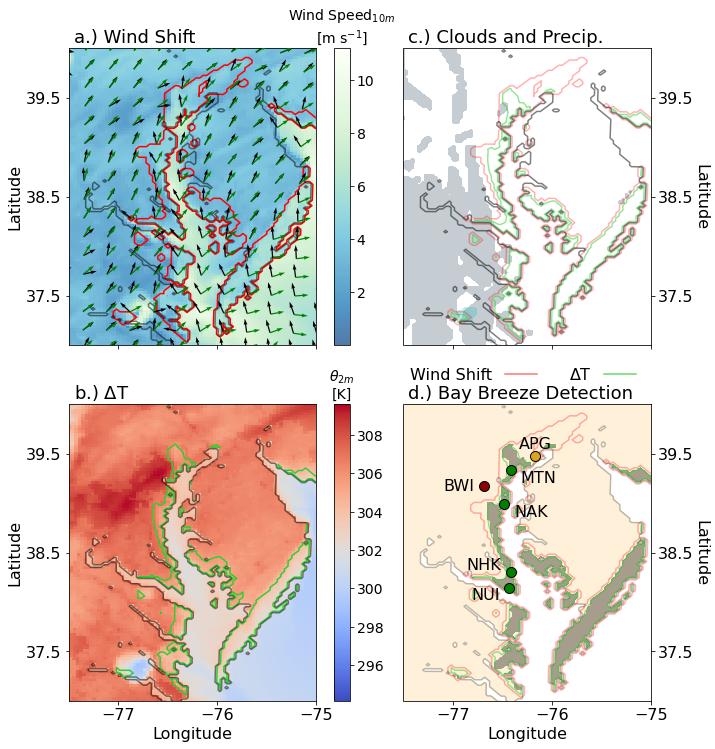

In [16]:
xlim = (-77.5,-75.0)
ylim = (37.0,40.0)
fig = plt.figure(figsize=(11,12))

wplt = plt.subplot2grid((2,2),(0,0),aspect='equal')
wpcol = wplt.pcolormesh(lon,lat,vel10,
                        cmap=light_wspd_cmap,rasterized=True)

qs = 0
qint = 7
qscale = 1.8e1
wplt.quiver(lon[qs::qint,qs::qint],lat[qs::qint,qs::qint],unt_u10[qs::qint,qs::qint],unt_v10[qs::qint,qs::qint],
            scale=qscale,pivot='tail',width=0.005, zorder=100)
wplt.quiver(lon[qs::qint,qs::qint],lat[qs::qint,qs::qint],unt_u1km[qs::qint,qs::qint],unt_v1km[qs::qint,qs::qint],
            scale=qscale,pivot='tail',color='green',width=0.005, zorder=100)
wplt.contour(lon,lat,breeze_ds.good_wdir,levels=[1.0],colors='r')
wplt.contour(lon,lat,land_mask,levels=[0.5],colors='k',alpha=0.5)
wplt.set_yticks(np.arange(37.5,41.0,1.0))
wplt.set_xticks(np.arange(-77.0,-74.0,1.0))
wplt.set_ylim(ylim)
wplt.set_xlim(xlim)
wplt.tick_params(labelsize=16,labelbottom=False)
#wplt.set_title('',size=18)
wplt.set_ylabel('Latitude',size=16)

tplt = plt.subplot2grid((2,2),(1,0),aspect='equal',sharex=wplt,sharey=wplt)
tpcol = tplt.pcolormesh(lon,lat,wrfout.T2,cmap=plt.cm.coolwarm,rasterized=True)
tplt.contour(lon,lat,breeze_ds.dT,levels=[0.0001],colors='limegreen')
tplt.contour(lon,lat,land_mask,levels=[0.5],colors='k',alpha=0.5)
#tplt.set_title('',size=18)
tplt.tick_params(labelsize=16)
tplt.set_ylabel('Latitude',size=16)
tplt.set_xlabel('Longitude',size=16)

cplt = plt.subplot2grid((2,2),(0,1),aspect='equal',sharex=wplt,sharey=wplt)
cplt.contourf(lon,lat,breeze_ds.is_cloudy,levels=[0.5,1.0],colors='slategray',alpha=0.4)
cplt.contourf(lon,lat,breeze_ds.is_raining,levels=[0.5,1.0],colors='c',alpha=0.25)
cplt.contour(lon,lat,breeze_ds.good_wdir,levels=[1.0],colors='r',alpha=0.3)
cplt.contour(lon,lat,breeze_ds.dT,levels=[0.0001],colors='limegreen',alpha=0.5)
cplt.tick_params(labelsize=16,labelleft=False,labelbottom=False,right=True,labelright=True,left=False)
cplt.contour(lon,lat,land_mask,levels=[0.5],colors='k',alpha=0.5)
#cplt.set_title('',size=18)
cplt.set_ylabel('Latitude',size=16,rotation=-90,labelpad=15.0)
cplt.yaxis.set_label_position("right")

fplt = plt.subplot2grid((2,2),(1,1),aspect='equal',sharex=wplt,sharey=wplt)
fplt.contourf(lon,lat,breeze_ds_f.land_mask,colors='moccasin',levels=[0.5,1.0],alpha=0.5)
fplt.contour(lon,lat,breeze_ds.good_wdir,levels=[1.0],colors='r',alpha=0.3)
fplt.contour(lon,lat,breeze_ds.dT,levels=[0.0001],colors='limegreen',alpha=0.5)
fplt.contour(lon,lat,land_mask,levels=[0.5],colors='k',alpha=0.25)
good_points = breeze_ds.breeze - breeze_ds.is_cloudy - breeze_ds.is_raining
# ---- Hatches not showing in pdf for some reason... ----
#good_areas = fplt.contourf(lon,lat,good_points,levels=[1.9,4.1],colors='k',
#                           alpha=0.25,hatches=['+++', '/'],rasterized=True)
good_areas = fplt.contourf(lon,lat,good_points,levels=[1.9,4.1],colors='k',
                           alpha=0.35,rasterized=True)
for ss,stn in enumerate(near_shore_stations):
            stn_color = int(breeze_ds.breeze.sel(south_north=stn_dict[stn]['j'],
                                                 west_east=stn_dict[stn]['i']).data)
            plt.scatter(stn_dict[stn]['lon'],stn_dict[stn]['lat'],
                        facecolor=breeze_cmap[stn_color],s=100,
                        edgecolor='k',zorder=4)
            if stn == 'APG':
                ha,va     = 'center','bottom'
                xoff,yoff = 0.0,0.05 
            elif stn == 'MTN':
                ha,va     = 'left','top'
                xoff,yoff = 0.1,0.0
            elif stn == 'NAK':
                ha,va     = 'left','top'
                xoff,yoff = 0.1,0.0
            elif stn == 'NHK':
                ha,va     = 'right','bottom'
                xoff,yoff = -0.1,0.0
            elif stn == 'NUI':
                ha,va     = 'right','top'
                xoff,yoff = -0.1,0.0
            else:
                ha,va = 'right','center'
                xoff,yoff = -0.1,0.0 
            plt.text(stn_dict[stn]['lon']+xoff,stn_dict[stn]['lat']+yoff,stn,size=16,ha=ha,va=va)
fplt.tick_params(labelsize=16,labelleft=False,right=True,labelright=True,left=False)
#fplt.set_title('',size=18)
fplt.plot(0.0,0.0,c='r',label='Wind Shift',alpha=0.55)
fplt.plot(0.0,0.0,c='limegreen',label='$\Delta$T',alpha=0.75)
fplt.legend(frameon=False,fontsize=16,loc=(0.0,1.05),markerfirst=False,ncol=2)
fplt.set_ylabel('Latitude',size=16,rotation=-90,labelpad=15.0)
fplt.yaxis.set_label_position("right")
fplt.set_xlabel('Longitude',size=16)

txtx,txty = -77.45,40.02
wplt.text(txtx,txty,'a.) Wind Shift',size=18,ha='left',va='bottom')
tplt.text(txtx,txty,'b.) $\Delta$T',size=18,ha='left',va='bottom',c='k')
cplt.text(txtx,txty,'c.) Clouds and Precip.',size=18,ha='left',va='bottom')
fplt.text(txtx,txty,'d.) Bay Breeze Detection',size=18,ha='left',va='bottom')


caxU = fig.add_axes([0.48,0.537,0.02,0.343])
caxT = fig.add_axes([0.48,0.125,0.02,0.343])
cbarU = plt.colorbar(wpcol,cax=caxU)
cbarT = plt.colorbar(tpcol,cax=caxT)
caxU.tick_params(labelsize=14)
caxU.set_title('Wind Speed$_{10 m}$\n[m s$^{-1}$]',size=14)
caxT.tick_params(labelsize=14)
caxT.set_title(r'$\theta_{2 m}$'+'\n[K]',size=14)
#plt.savefig('{}ERAIexampleDetection.pdf'.format(save_dir), bbox_inches = 'tight',pad_inches = 0.1)
plt.show()

In [17]:
# - - - - Dates with numerical onshore min/max - - - - #
bb_observed_dates = {}
bb_observed_dates['NumericalMinMax'] = {
                     'StaufferThompson2015' : {
                                               '2019-07-01' : ['NAK'],
                                               '2019-07-02' : ['MTN', 'APG'],
                                               '2019-07-04' : ['NHK', 'NUI'],
                                               '2019-07-06' : ['MTN', 'NUI', 'APG'],
                                               '2019-07-09' : ['NAK', 'MTN'],
                                               '2019-07-10' : ['NUI', 'NHK'],
                                               '2019-07-15' : ['NAK'],
                                               '2019-07-16' : ['NAK', 'NHK', 'MTN'],
                                               '2019-07-17' : ['MTN', 'NAK', 'NUI', 'NUI'],
                                               '2019-07-19' : ['NAK', 'MTN', 'NHK', 'APG'],
                                               '2019-07-22' : ['MTN', 'NUI'],
                                               '2019-07-24' : ['NUI', 'NAK'],
                                               '2019-07-25' : ['NAK'],
                                               '2019-07-26' : ['MTN', 'BWI'],
                                               '2019-07-27' : ['NAK', 'MTN', 'NHK', 'NUI'],
                                               '2019-07-28' : ['NAK', 'NAK', 'NHK'],
                                               '2019-07-29' : ['MTN', 'NAK', 'NHK'],
                                               '2019-07-30' : ['MTN', 'NAK', 'NHK'],
                                               '2019-07-31' : ['NHK'],
                                              },
                     'Stauffer2015' : {
                                               '2019-07-01' : ['NAK'],
                                               '2019-07-04' : ['NHK'],
                                               '2019-07-06' : ['NUI'],
                                               '2019-07-10' : ['NHK'],
                                               '2019-07-15' : ['NAK'],
                                               '2019-07-16' : ['NAK', 'NHK'],
                                               '2019-07-17' : ['NAK'],
                                               '2019-07-19' : ['NHK'],
                                               '2019-07-22' : ['NUI'],
                                               '2019-07-27' : ['NAK', 'NAK', 'NHK'],
                                               '2019-07-28' : ['NAK'],
                                               '2019-07-29' : ['NAK', 'NHK', 'NHK'],
                                               '2019-07-30' : ['NAK', 'NHK', 'NHK'],
                                               '2019-07-31' : ['NHK'],
                                              },
                     'Sikora2010' : {
                                               '2019-07-01' : ['NAK'],
                                               '2019-07-06' : ['NUI'],
                                               '2019-07-11' : ['NHK'],
                                               '2019-07-16' : ['NAK', 'NHK'],
                                               '2019-07-24' : ['NAK'],
                                               '2019-07-25' : ['NAK'],
                                               '2019-07-27' : ['NHK'],
                                               '2019-07-28' : ['NAK', 'NHK'],
                                              },
                     }

# - - - - - - Dates with original onshore min/max - - - - - - #
bb_observed_dates['orig'] = {
                     'StaufferThompson2015' : {
                                               '2019-07-01' : ['NAK'],
                                               '2019-07-02' : ['MTN', 'APG'],
                                               '2019-07-04' : ['NHK', 'NUI'],
                                               '2019-07-06' : ['MTN', 'APG'],
                                               '2019-07-09' : ['NAK', 'MTN'],
                                               '2019-07-10' : ['NHK', 'NUI'],
                                               '2019-07-15' : ['NAK'],
                                               '2019-07-16' : ['NAK', 'NHK', 'MTN'],
                                               '2019-07-17' : ['MTN', 'NAK'],
                                               '2019-07-19' : ['NAK', 'MTN', 'NHK', 'APG'],
                                               '2019-07-22' : ['MTN'],
                                               '2019-07-24' : ['NUI', 'NUI', 'NAK'],
                                               '2019-07-25' : ['NAK'],
                                               '2019-07-26' : ['MTN', 'BWI'],
                                               '2019-07-27' : ['NAK', 'MTN', 'NHK'],
                                               '2019-07-28' : ['MTN', 'NAK', 'NAK', 'NHK'],
                                               '2019-07-29' : ['MTN', 'NAK', 'NHK'],
                                               '2019-07-30' : ['MTN', 'NAK', 'NHK'],
                                               '2019-07-31' : ['NHK'],
                                              },
                     'Stauffer2015' : {
                                               '2019-07-01' : ['NAK'],
                                               '2019-07-04' : ['NHK'],
                                               '2019-07-10' : ['NHK'],
                                               '2019-07-15' : ['NAK'],
                                               '2019-07-16' : ['NAK'],
                                               '2019-07-17' : ['NAK'],
                                               '2019-07-19' : ['NHK'],
                                               '2019-07-27' : ['NAK', 'NAK', 'NHK'],
                                               '2019-07-28' : ['NAK'],
                                               '2019-07-29' : ['NAK', 'NHK'],
                                               '2019-07-30' : ['NAK', 'NHK'],
                                               '2019-07-31' : ['NHK'],
                                              },
                     'Sikora2010' : {
                                               '2019-07-01' : ['NAK'],
                                               '2019-07-05' : ['BWI'],
                                               '2019-07-10' : ['NUI'],
                                               '2019-07-16' : ['NAK'],
                                               '2019-07-24' : ['NUI', 'NAK'],
                                               '2019-07-25' : ['NAK'],
                                               '2019-07-27' : ['NHK'],
                                               '2019-07-28' : ['NAK', 'NHK'],
                                              },
                     }

### Get list of observed BB days:

In [19]:
all_observed_dates = {}
detection_f_names = ['RealSampleRate','RealSampleRate_NumericalMinMax']
for detection_f_name in detection_f_names:
    if 'NumericalMinMax' in detection_f_name:
        bb_observed_dates_list = bb_observed_dates['NumericalMinMax']
    else:
        bb_observed_dates_list = bb_observed_dates['orig']
    for mm,method in enumerate(bb_observed_dates_list.keys()):
        if mm == 0:
            all_observed_dates_f = bb_observed_dates_list[method].copy()
        else:
            for day in bb_observed_dates_list[method]:
                if day not in list(all_observed_dates_f):
                    all_observed_dates_f[day] = bb_observed_dates_list[method][day]
                else: # check to see if the station on this date is already included
                    if bb_observed_dates_list[method][day] != all_observed_dates_f[day]:
                        new_list = list(np.unique(np.append(bb_observed_dates_list[method][day], all_observed_dates_f[day])))
                        all_observed_dates_f[day] = new_list
    if 'NumericalMinMax' in detection_f_name:
        detect_name = 'NumericalMinMax'
    else:
        detect_name = 'orig'
    all_observed_dates[detect_name] = all_observed_dates_f
    for day in all_observed_dates[detect_name]:
        print(day,all_observed_dates[detect_name][day])
    print('\n\n\n')

2019-07-01 ['NAK']
2019-07-02 ['MTN', 'APG']
2019-07-04 ['NHK', 'NUI']
2019-07-06 ['MTN', 'APG']
2019-07-09 ['NAK', 'MTN']
2019-07-10 ['NHK', 'NUI']
2019-07-15 ['NAK']
2019-07-16 ['MTN', 'NAK', 'NHK']
2019-07-17 ['MTN', 'NAK']
2019-07-19 ['APG', 'MTN', 'NAK', 'NHK']
2019-07-22 ['MTN']
2019-07-24 ['NAK', 'NUI']
2019-07-25 ['NAK']
2019-07-26 ['MTN', 'BWI']
2019-07-27 ['MTN', 'NAK', 'NHK']
2019-07-28 ['MTN', 'NAK', 'NHK']
2019-07-29 ['MTN', 'NAK', 'NHK']
2019-07-30 ['MTN', 'NAK', 'NHK']
2019-07-31 ['NHK']
2019-07-05 ['BWI']




2019-07-01 ['NAK']
2019-07-02 ['MTN', 'APG']
2019-07-04 ['NHK', 'NUI']
2019-07-06 ['APG', 'MTN', 'NUI']
2019-07-09 ['NAK', 'MTN']
2019-07-10 ['NHK', 'NUI']
2019-07-15 ['NAK']
2019-07-16 ['MTN', 'NAK', 'NHK']
2019-07-17 ['MTN', 'NAK', 'NUI']
2019-07-19 ['APG', 'MTN', 'NAK', 'NHK']
2019-07-22 ['MTN', 'NUI']
2019-07-24 ['NAK', 'NUI']
2019-07-25 ['NAK']
2019-07-26 ['MTN', 'BWI']
2019-07-27 ['MTN', 'NAK', 'NHK', 'NUI']
2019-07-28 ['NAK', 'NHK']
2019-07-29 ['MTN', 'NAK',

# Evaluate OBDA Performance

In [20]:
# Start time:     0900 Local (1300 UTC) 
start_time = pd.to_timedelta(13,unit='h')
# End time:       1600 Local (2000 UTC)
end_time   = pd.to_timedelta(20,unit='h')

detection_methods = ['StaufferThompson2015','Stauffer2015','Sikora2010']

t_s = breeze_ds_dict[cases[0]].datetime.data[0]
t_e = breeze_ds_dict[cases[0]].datetime.data[-1]

In [21]:
detection_f_names = ['RealSampleRate','RealSampleRate_NumericalMinMax']
bb_case_df_dict = {}
for detection_f_name in detection_f_names:
    if 'NumericalMinMax' in detection_f_name:
        use_numerical_minmax = True
    bb_detection_dict_fname = '{}wrf_bay_breeze_detections_final_{}.txt'.format(wrf_dir,detection_f_name)
    if path.exists(bb_detection_dict_fname):
        print('loading in full dataframe!')
        bb_case_df_dict[detection_f_name] = pd.read_csv(bb_detection_dict_fname,delimiter='\t',names=
                                 ['case','method','station','detection_dates'])

    else:
        print('This may not work... taken from SST/CBB_WRF_Analysis.ipynb')
        bb_case_dict = {}
        for cc,case in enumerate(cases_of_interest):
            bb_case_dict['{}_{}'.format(case,'d0{}'.format(case_dom[cc]))] = {}
            for dm,detection_method in enumerate(detection_methods):
                if detection_method == 'StaufferThompson2015':
                    sample_rate = '60min'
                elif detection_method == 'Stauffer2015':
                    sample_rate = '5min'
                elif detection_method == 'Sikora2010':
                    sample_rate = '60min'  
                bb_count = 0
                print(case,detection_method)
                bb_case_dict['{}_{}'.format(case,'d0{}'.format(case_dom[cc]))][detection_method] = {}
                for dd,day in enumerate(pd.date_range(start=t_s - pd.to_timedelta(t_s.hour,'h') - \
                                                      pd.to_timedelta(t_s.second,'s'), end=t_e)):
                    twr_dat_f = wrf_twrs['{}_{}'.format(case,'d0{}'.format(case_dom[cc]))]
                    if dd == 0:
                        print('Initializing bb_stn_dict')
                        bb_stn_dict = {}
                    for stn in near_shore_stations:
                        if dd == 0: 
                            bb_stn_dict[stn] = []
                        #fig,ax = plt.subplots(nrows=2,figsize=(10,7),sharex=True)

                        if stn in asos_ds.get_index('station'):
                            obs_ds = asos_ds.sel(station=stn).sel(datetime=slice(t_s,t_e))
                        elif stn in awos_ds.get_index('station'):
                            obs_ds = awos_ds.sel(station=stn).sel(datetime=slice(t_s,t_e))
                        else:
                            print('no obs for this station')
                        #obs_ds = obs_res_full.sel(station=stn)
                        twr_dat = twr_dat_f.sel(station=stn)

                        if use_numerical_minmax:
                            twr_dat['onshore_max'] = numerical_onshore_minmax[stn]['max']['new']
                            twr_dat['onshore_min'] = numerical_onshore_minmax[stn]['min']['new']
                        else:
                            twr_dat['onshore_max'] = obs_ds.onshore_max
                            twr_dat['onshore_min'] = obs_ds.onshore_min
                        if stn == 'APG':
                            obs_ds = apg_ds.sel(station='PAA')
                            obs_ds.station.data = 'APG'

                        if detection_method == 'Stauffer2015':
                            twr_dat['dwpt'] = T_d(twr_dat.t2 + 273.15,
                                                  100.0*(twr_dat.q2/w_s(twr_dat.t2 + 273.15, twr_dat.psfc/100.0)))



                        station         = twr_dat.sel(datetime=slice(str(pd.to_datetime(day)+start_time),
                                                     str(pd.to_datetime(day)+end_time))).isel(nz=0)
                        inland_stations = wrf_twrs['{}_{}'.format(case,'d0{}'.format(case_dom[cc]))].sel(station=ref_stn,
                                                     datetime=slice(str(pd.to_datetime(day)+start_time),
                                                     str(pd.to_datetime(day)+end_time))).isel(nz=0)


                        bay_breeze      = DetectBayBreeze(station,inland=inland_stations,verbose=False,resample=True,
                                                          sample_rate=sample_rate,show_plot=False,method=detection_method)
                        if bay_breeze.validated:
                            bb_count += 1
                            bb_stn_dict[stn] = np.concatenate([bb_stn_dict[stn],[str(day)]])

                for stn in near_shore_stations[0:]:
                    bb_case_dict['{}_{}'.format(case,'d0{}'.format(
                                            case_dom[cc]))][detection_method][stn] = bb_stn_dict[stn]


        new_f = open(bb_detection_dict_fname,'w')
        for case in bb_case_dict:
            for det_meth in bb_case_dict[case]:
                for stn in bb_case_dict[case][det_meth]:
                    detections = bb_case_dict[case][det_meth][stn]
                    detections = ','.join(detections)
                    if detections == '':
                        detections = 'None'
                    else:
                        detections = detections.replace(' ','_')
                    new_f.write('{}\t{}\t{}\t{}\n'.format(case, det_meth,stn,detections))
        new_f.close()
        bb_case_df = pd.read_csv(bb_detection_dict_fname,delimiter='\t',names=['case','method','station','detection_dates'])

loading in full dataframe!
loading in full dataframe!


# Make LaTeX Table for the cases:

### Need to split the table into 2 or more pieces...

In [22]:
stn_str_dict = {'APG':'A',
                'BWI':'B',
                'NAK':'K',
                'NHK':'H',
                'NUI':'N',
                'MTN':'M'}

mth_str_dict = {'StaufferThompson2015' : 'ST15',
                        'Stauffer2015' : 'S15',
                          'Sikora2010' : 'S10'}

cases_table_full = [
                     ['ERAI_YSU_CHRN_OST_NOSK_4DOM'],
    
                     ['ERAI_YSU_CHRN_OST_NOSK_4DOM',
                      'GFSR_YSU_CHRN_GFS_NOSK_3DOM',
                      'ERA5_YSU_CHRN_ER5_NOSK_3DOM']
                    ]


# Confusion matrix dictionary:


In [23]:
ob_confusion_matrix_dict = {}
for detection_type in bb_case_df_dict.keys():
    ob_confusion_matrix_dict[detection_type] = {}
    for case in np.unique([item for sublist in cases_table_full for item in sublist]):
        ob_confusion_matrix_dict[detection_type]['{}_d03'.format(case)] = {}
        for meth in detection_methods:
            ob_confusion_matrix_dict[detection_type]['{}_d03'.format(case)][meth] = {}

n_bb_stn = 6 # 6 if you do APG

# Big Table!

## Table 3:

In [24]:
n_bb_stn = 6 # 6 if you do APG

show_close = False

confusion_matrix = {'TP':0,'FP':0,'TN':0,'FN':0,'close':0}

for detection_type in bb_case_df_dict.keys():
    if 'NumericalMinMax' in detection_type:
        bb_observed_dates_list = bb_observed_dates['NumericalMinMax']
    else:
        bb_observed_dates_list = bb_observed_dates['orig']
        
    print(detection_type)
    bb_case_df = bb_case_df_dict[detection_type]

    stn_cnt = 0
    for tt,cases_table in enumerate(cases_table_full):
        for dd,day in enumerate(pd.date_range(start=t_s, end=t_e)):
            count = 0
            date_str = '{0:04d}-{1:02d}-{2:02d}'.format(day.year,day.month,day.day)
            day_line = '{} & '.format(date_str)
            init_line = True
            for row in bb_case_df.T.iteritems(): 

                case   = row[1][0]
                method = row[1][1]
                stn    = row[1][2]
                dates  = row[1][3].replace('_',' ')
                stn_str_f = stn_str_dict[stn]
                bb_obs = False
                bb_sim = False
                if '_'.join(case.split('_')[:-1]) in cases_table and case.split('_')[-1] == 'd03':
                    stn_cnt += 1
                    if init_line:
                        prev_method = method
                        prev_case   = case

                        header_1    = ' & \multicolumn{3}{c||}{' + case_dict['_'.join(case.split('_')[:-1])][case.split('_')[-1]]['name'] + '} &'
                        header_2    = r' \textbf{Date} & \textbf{' + '{}'.format(mth_str_dict[method] + r'}')
                        hd2_fmt     = '|r|c|'
                        init_line = False

                    if method != prev_method:
                        day_line = day_line[:-1] + ' & '
                        if dd == 0:
                            if case != prev_case:
                                header_1 = header_1 + '\multicolumn{3}{c||}{' + \
                                           case_dict['_'.join(case.split('_')[:-1])][case.split('_')[-1]]['name'] + '} &'
                                header_2 = header_2 + r' & \textbf{' + '{}'.format(mth_str_dict[method] + r'}')
                                hd2_fmt = hd2_fmt + '|c|'
                            else:
                                header_2 = header_2 + r' & \textbf{' + '{}'.format(mth_str_dict[method] + r'}')
                                #header_2 = header_2 + ' & {}'.format(mth_str_dict[method])
                                hd2_fmt = hd2_fmt + 'c|'

                    if case != prev_case:
                        day_line = day_line[:-1] + ' '

                    if date_str in dates:
                        #print('{} simulated a bb on this date'.format(stn))
                        bb_sim = True
                        stn_str_f = r'\textit{' + stn_str_f + r'}'
                        #stn_str_f = r'\textcolor{' + stn + '}{'+ stn_str_f + r'}'
                    else:
                        #print('{} did not simulate a bb on this date'.format(stn))
                        stn_str_f = stn_str_f                    
                    if date_str in bb_observed_dates_list[method]:

                        bay_breeze_stations_for_this_date = bb_observed_dates_list[method][date_str]

                        if stn in bay_breeze_stations_for_this_date:
                            #print('{} observed a bb on this date'.format(stn))
                            bb_obs = True
                            stn_str_f = r'\textbf{' + stn_str_f + r'}'
                        else:
                            stn_str_f = stn_str_f                    
                        #    print('{} did not observe a bb on this date'.format(stn))
                    else:
                        stn_str_f = stn_str_f

                    #if bb_obs and bb_sim:
                    #    stn_str_f = r'\textit{' + stn_str_f + r'}'

                    if stn == 'MTN' and method != 'StaufferThompson2015': # MTN doesn't have temp / dwpt data... don't count.
                        #stn_str_f = r'\xcancel{' + stn_str_f + r'}'
                        stn_str_f = '--'


                    day_line = day_line + '{} '.format(stn_str_f)

                    if not (stn == 'MTN' and method != 'StaufferThompson2015'):
                        if bb_sim and bb_obs:
                            #print('True Positive')
                            confusion_matrix['TP'] += 1
                        if bb_sim and not bb_obs:
                            #print('False Positive')
                            confusion_matrix['FP'] += 1
                            if date_str in bb_observed_dates_list[method]:
                                confusion_matrix['close'] += 1
                        if not bb_sim and not bb_obs:
                            #print('True Negative')
                            confusion_matrix['TN'] += 1
                        if not bb_sim and bb_obs:
                            #print('False Negative')
                            confusion_matrix['FN'] += 1

                    if stn_cnt == n_bb_stn:
                        if dd == 0:
                            ob_confusion_matrix_dict[detection_type][case][method] = confusion_matrix
                        else:
                            for val in ob_confusion_matrix_dict[detection_type][case][method]:
                                #print(val)
                                ob_confusion_matrix_dict[detection_type][case][method][val] += confusion_matrix[val]
                        confusion_matrix = {'TP':0,'FP':0,'TN':0,'FN':0,'close':0}
                        stn_cnt = 0


                    prev_method = method
                    prev_case   = case
                    #print()
                    count+=1
                    #if count > 9:
                    #    print(day_line)
                    #    wefwef


            if dd == 0:
                header_1 = header_1[:-1] + ' \\\ \n'
                header_2 = header_2 + ' \\\ \n'


                if tt == 0:
                    print(r'\begin{landscape}')
                    print(r'\thispagestyle{empty}')
                    print(r'    \noindent')
                    print(r'\renewcommand{\arraystretch}{0.65}')
                    print(r'\footnotesize')
                print(r'\begin{tabular}{ '+hd2_fmt+' }')
                print(r'\hline')
                print(header_1)
                print(r'\hline')
                print(header_2)
                print(r'\specialrule{.1em}{.05em}{.05em}' + '\n')
                #print(r'\hline')
            day_line = day_line[:-1] + ' \\\ \n'

            print(day_line)
            print(r'\hline')
        tot_line = r'\textbf{Total} '
        for dm in detection_methods:
            tot_cm = ob_confusion_matrix_dict[detection_type][cases_table[tt]+'_d03'][dm]
            if show_close:
                tot_line += '& TP: {}, TN: {}, FN: {}, FP {} ({})'.format(tot_cm['TP'],tot_cm['TN'],tot_cm['FN'],tot_cm['FP'],tot_cm['close'])
            else:
                tot_line += '& TP: {}, TN: {}, FN: {}, FP {}'.format(tot_cm['TP'],tot_cm['TN'],tot_cm['FN'],tot_cm['FP'])
        print(tot_line + r' \\')
        print(r'\end{tabular}')


        print()
        print()
        print()

    print(r'\renewcommand{\arraystretch}{1.0}')
    print(r'\end{landscape}')
    print('\n\n')

RealSampleRate
\begin{landscape}
\thispagestyle{empty}
    \noindent
\renewcommand{\arraystretch}{0.65}
\footnotesize
\begin{tabular}{ |r|c|c|c| }
\hline
 & \multicolumn{3}{c||}{ERA-I}  \\ 

\hline
 \textbf{Date} & \textbf{ST15} & \textbf{S15} & \textbf{S10} \\ 

\specialrule{.1em}{.05em}{.05em}

2019-07-16 & A B \textbf{\textit{M}} \textbf{\textit{K}} \textbf{H} N & A B -- \textbf{K} H N & A B -- \textbf{\textit{K}} H N \\ 

\hline
2019-07-17 & \textit{A} B \textbf{\textit{M}} \textbf{K} H N & A B -- \textbf{K} H N & \textit{A} B -- K H N \\ 

\hline
2019-07-18 & \textit{A} B \textit{M} K H N & A B -- K H N & A B -- K H N \\ 

\hline
2019-07-19 & \textbf{A} B \textbf{M} \textbf{K} \textbf{H} N & A B -- K \textbf{H} N & A B -- K H N \\ 

\hline
2019-07-20 & A B M K H N & A B -- K H N & A B -- K H N \\ 

\hline
2019-07-21 & A B M K H N & A B -- K H N & A B -- K H N \\ 

\hline
2019-07-22 & \textit{A} B \textbf{M} K H N & A B -- K H N & \textit{A} B -- K H N \\ 

\hline
2019-07-23 & A B 

In [25]:
# Sanity check: make sure the number of days per method makes sense (96 ST15, 60 S15 and S10)

cases_for_numerical = ['ERAI_YSU_CHRN_OST_NOSK_4DOM','GFSR_YSU_CHRN_GFS_NOSK_3DOM','ERA5_YSU_CHRN_ER5_NOSK_3DOM']
#cases_for_numerical = cases.copy()
#print('obs_confusion_matrix_dict = {')
for detection_type in bb_case_df_dict.keys():
    
    if 'NumericalMinMax' in detection_type:
        obs_confusion_matrix_dict_with_numMinMax = ob_confusion_matrix_dict[detection_type]
    else:
        obs_confusion_matrix_dict = ob_confusion_matrix_dict[detection_type]

    for cc,case in enumerate(cases_for_numerical):
        for dm in detection_methods:
            sum_mets = 0
            for mm,metric in enumerate(ob_confusion_matrix_dict[detection_type][case+'_d03'][dm].keys()):
                if len(metric) ==2:
                    sum_mets += ob_confusion_matrix_dict[detection_type][case+'_d03'][dm][metric]
            print(dm,sum_mets)
detection_methods = ['StaufferThompson2015','Stauffer2015','Sikora2010']

StaufferThompson2015 96
Stauffer2015 80
Sikora2010 80
StaufferThompson2015 96
Stauffer2015 80
Sikora2010 80
StaufferThompson2015 96
Stauffer2015 80
Sikora2010 80
StaufferThompson2015 96
Stauffer2015 80
Sikora2010 80
StaufferThompson2015 96
Stauffer2015 80
Sikora2010 80
StaufferThompson2015 96
Stauffer2015 80
Sikora2010 80


In [26]:
cases_for_numerical = ['ERAI_YSU_CHRN_OST_NOSK_4DOM','GFSR_YSU_CHRN_GFS_NOSK_3DOM','ERA5_YSU_CHRN_ER5_NOSK_3DOM']
#cases_for_numerical = cases.copy()
#print('obs_confusion_matrix_dict = {')
for detection_type in bb_case_df_dict.keys():
    
    if 'NumericalMinMax' in detection_type:
        obs_confusion_matrix_dict_with_numMinMax = ob_confusion_matrix_dict[detection_type]
        print('obs_confusion_matrix_dict_with_numMinMax = {')
    else:
        print('here')
        obs_confusion_matrix_dict = ob_confusion_matrix_dict[detection_type]
        print('obs_confusion_matrix_dict = {')

    for cc,case in enumerate(cases_for_numerical):
        print("'{}'".format(case),':',ob_confusion_matrix_dict[detection_type][case+'_d03'],',')
    print('}')
detection_methods = ['StaufferThompson2015','Stauffer2015','Sikora2010']

here
obs_confusion_matrix_dict = {
'ERAI_YSU_CHRN_OST_NOSK_4DOM' : {'StaufferThompson2015': {'TP': 8, 'FP': 8, 'TN': 60, 'FN': 20, 'close': 6}, 'Stauffer2015': {'TP': 1, 'FP': 0, 'TN': 69, 'FN': 10, 'close': 0}, 'Sikora2010': {'TP': 2, 'FP': 4, 'TN': 69, 'FN': 5, 'close': 0}} ,
'GFSR_YSU_CHRN_GFS_NOSK_3DOM' : {'StaufferThompson2015': {'TP': 7, 'FP': 4, 'TN': 64, 'FN': 21, 'close': 4}, 'Stauffer2015': {'TP': 2, 'FP': 0, 'TN': 69, 'FN': 9, 'close': 0}, 'Sikora2010': {'TP': 1, 'FP': 3, 'TN': 70, 'FN': 6, 'close': 0}} ,
'ERA5_YSU_CHRN_ER5_NOSK_3DOM' : {'StaufferThompson2015': {'TP': 6, 'FP': 3, 'TN': 65, 'FN': 22, 'close': 3}, 'Stauffer2015': {'TP': 0, 'FP': 0, 'TN': 69, 'FN': 11, 'close': 0}, 'Sikora2010': {'TP': 1, 'FP': 3, 'TN': 70, 'FN': 6, 'close': 0}} ,
}
obs_confusion_matrix_dict_with_numMinMax = {
'ERAI_YSU_CHRN_OST_NOSK_4DOM' : {'StaufferThompson2015': {'TP': 15, 'FP': 13, 'TN': 53, 'FN': 15, 'close': 10}, 'Stauffer2015': {'TP': 2, 'FP': 1, 'TN': 66, 'FN': 11, 'close': 1}, 'Sikora

# Compute skill metrics for OBDA:

In [41]:
obs_confusion_matrix_dict = compute_skill_metrics(obs_confusion_matrix_dict)
print()
obs_confusion_matrix_dict_close = compute_skill_metrics(deepcopy(obs_confusion_matrix_dict),rmv_close=True)
print()
obs_confusion_matrix_dict_with_numMinMax = compute_skill_metrics(obs_confusion_matrix_dict_with_numMinMax)

ERA5_YSU_CHRN_ER5_NOSK_3DOM_d03 StaufferThompson2015 0.4117647058823529
ERA5_YSU_CHRN_ER5_NOSK_3DOM_d03 Stauffer2015 0.15942028985507245
ERA5_YSU_CHRN_ER5_NOSK_3DOM_d03 Sikora2010 0.0958904109589041
ERAI_YSU_CHRN_OST_NOSK_4DOM_d03 StaufferThompson2015 0.4117647058823529
ERAI_YSU_CHRN_OST_NOSK_4DOM_d03 Stauffer2015 0.15942028985507245
ERAI_YSU_CHRN_OST_NOSK_4DOM_d03 Sikora2010 0.0958904109589041
GFSR_YSU_CHRN_GFS_NOSK_3DOM_d03 StaufferThompson2015 0.4117647058823529
GFSR_YSU_CHRN_GFS_NOSK_3DOM_d03 Stauffer2015 0.15942028985507245
GFSR_YSU_CHRN_GFS_NOSK_3DOM_d03 Sikora2010 0.0958904109589041

ERA5_YSU_CHRN_ER5_NOSK_3DOM_d03 StaufferThompson2015 0.47692307692307695
ERA5_YSU_CHRN_ER5_NOSK_3DOM_d03 Stauffer2015 0.15942028985507245
ERA5_YSU_CHRN_ER5_NOSK_3DOM_d03 Sikora2010 0.0958904109589041
ERAI_YSU_CHRN_OST_NOSK_4DOM_d03 StaufferThompson2015 0.5483870967741935
ERAI_YSU_CHRN_OST_NOSK_4DOM_d03 Stauffer2015 0.15942028985507245
ERAI_YSU_CHRN_OST_NOSK_4DOM_d03 Sikora2010 0.0958904109589041
GFS

/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in double_scalars


# MBDA Results

### Add HRRR data to dict:

In [28]:
hrrra_path = '/Users/hawbecke/Research/Chesapeake/Data/HRRR/spatial_breeze_detection_HRRR_CLDnRAIN_abs.nc'
breeze_ds_dict['HRRRa'] = xr.open_dataset(hrrra_path)

hrrrlat = breeze_ds_dict['HRRRa'].gridlat_0
hrrrlon = breeze_ds_dict['HRRRa'].gridlon_0
for ss,stn in enumerate(near_shore_stations):
    stn_lat = stn_dict[stn]['lat']
    stn_lon = stn_dict[stn]['lon']
    dist_from_stn = ((hrrrlon-stn_lon)**2 + (hrrrlat-stn_lat)**2)**0.5
    stn_j,stn_i = np.where(dist_from_stn == np.nanmin(dist_from_stn))
    stn_j = int(stn_j)
    stn_i = int(stn_i)
    if stn == 'NAK':
        stn_i -=1
    elif stn == 'NHK':
        stn_j -= 1
    stn_dict[stn]['hrrrai'] = stn_i
    stn_dict[stn]['hrrraj'] = stn_j

hrrrf_path = '/Users/hawbecke/Research/Chesapeake/Data/HRRR/forecast/spatial_breeze_detection_HRRR_CLDnRAIN_abs.nc'
breeze_ds_dict['HRRRf'] = xr.open_dataset(hrrrf_path)

hrrrlat = breeze_ds_dict['HRRRf'].gridlat_0
hrrrlon = breeze_ds_dict['HRRRf'].gridlon_0
for ss,stn in enumerate(near_shore_stations):
    stn_lat = stn_dict[stn]['lat']
    stn_lon = stn_dict[stn]['lon']
    dist_from_stn = ((hrrrlon-stn_lon)**2 + (hrrrlat-stn_lat)**2)**0.5
    stn_j,stn_i = np.where(dist_from_stn == np.nanmin(dist_from_stn))
    stn_j = int(stn_j)
    stn_i = int(stn_i)
    if stn == 'NAK':
        stn_i -=1
    elif stn == 'NHK':
        stn_j -= 1
    stn_dict[stn]['hrrrfi'] = stn_i
    stn_dict[stn]['hrrrfj'] = stn_j

# MBDA Output Plots:

## Figures 5 and 6:

In [29]:
cases_for_numerical = ['ERAI_YSU_CHRN_OST_NOSK_4DOM','GFSR_YSU_CHRN_GFS_NOSK_3DOM','ERA5_YSU_CHRN_ER5_NOSK_3DOM']
cases_for_numerical.append('HRRRa')
cases_for_numerical.append('HRRRf')

ERAI_YSU_CHRN_OST_NOSK_4DOM


/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:94: UserWarning: FixedFormatter should only be used together with FixedLocato

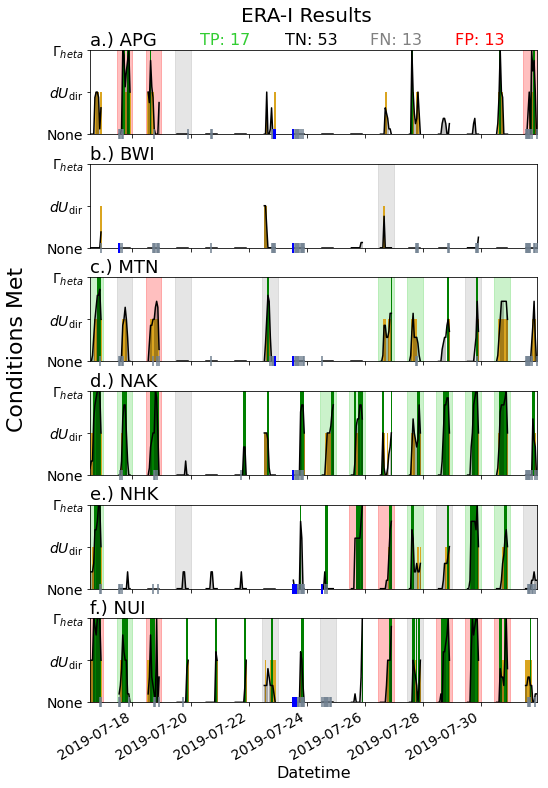

GFSR_YSU_CHRN_GFS_NOSK_3DOM


/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:94: UserWarning: FixedFormatter should only be used together with FixedLocato

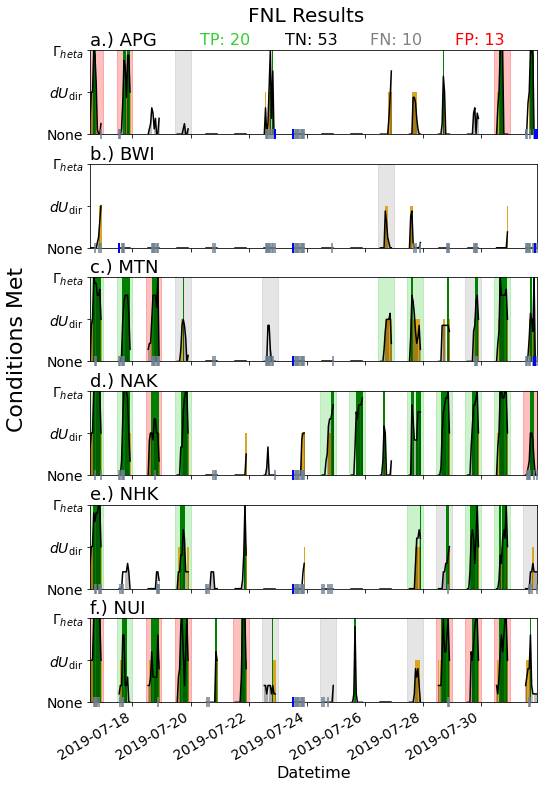

ERA5_YSU_CHRN_ER5_NOSK_3DOM


/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:94: UserWarning: FixedFormatter should only be used together with FixedLocato

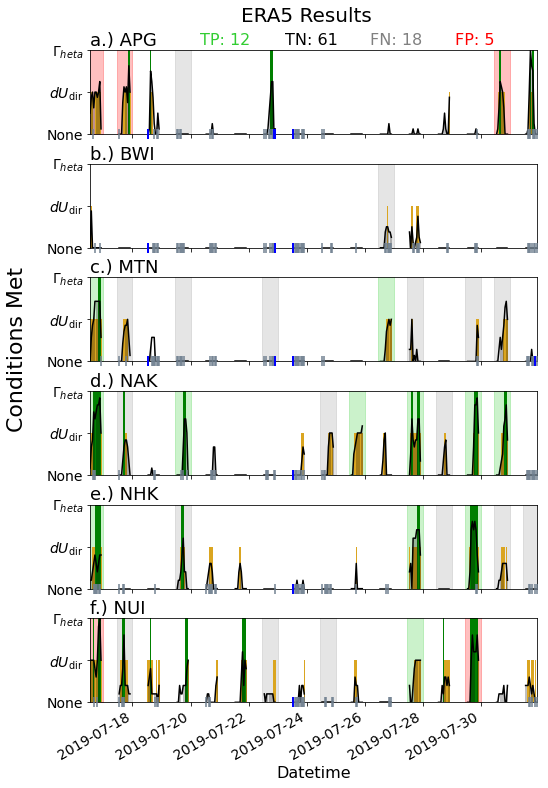

HRRRa


/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:94: UserWarning: FixedFormatter should only be used together with FixedLocato

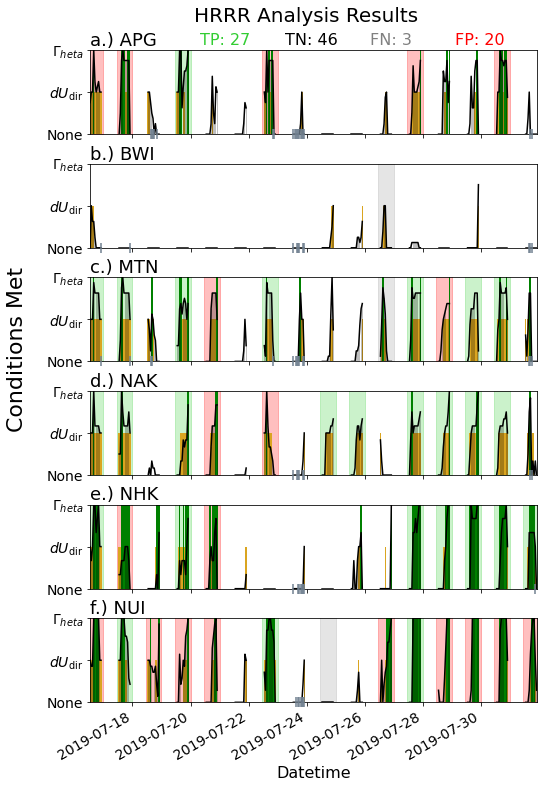

HRRRf


/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:94: UserWarning: FixedFormatter should only be used together with FixedLocato

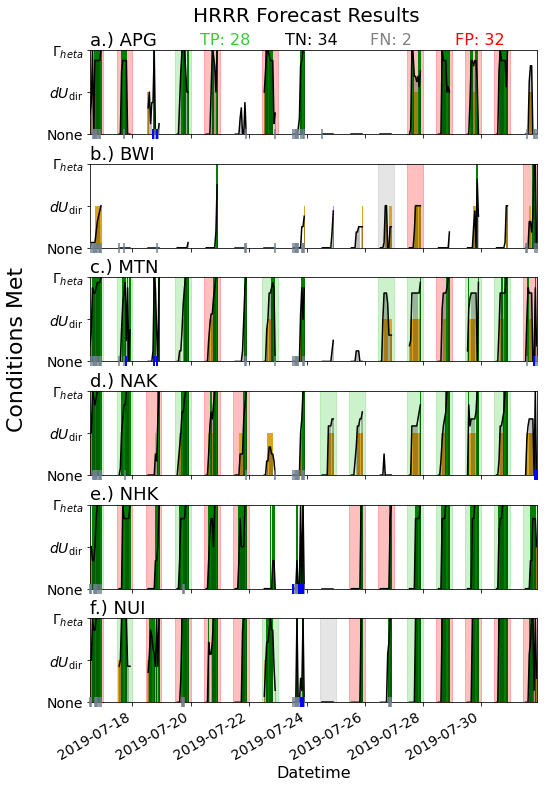

In [30]:
check_rain_and_clouds = True
use_neighbors = True

verbose = False

show_plot = True
use_all_days = True

show_close = False

period_start = pd.to_datetime('2019-07-16 00:00:00')
period_end   = breeze_ds_f.datetime.data[-1]

cMatrix_color_dict = {'TP':'limegreen',
                      'FP':'red',
                      'FN':'grey',
                   'close':'darkorange',
                      'TN':'k'}
confusion_matrix_dict = {}

bb_observed_dates_list = bb_observed_dates['NumericalMinMax']
all_observed_dates_f = all_observed_dates['NumericalMinMax']

for cc,case in enumerate(cases_for_numerical):
    breeze_ds_f = breeze_ds_dict[case]
    cMatrix_dict = {'TP':0,
                    'TN':0,
                    'FP':0,
                    'FN':0,
                 'close':0}
    print(case)
    fig,ax = plt.subplots(nrows=len(near_shore_stations),figsize=(8,12),sharex=True)
    fig.subplots_adjust(hspace=0.35)
    for ss,stn in enumerate(near_shore_stations):

        if 'HRRR' in case:
            if case == 'HRRRf': 
                hrrri,hrrrj = 'hrrrfi','hrrrfj'
            if case == 'HRRRa': 
                hrrri,hrrrj = 'hrrrai','hrrraj'                
            stn_bb_ds = breeze_ds_f.sel(ygrid_0=stn_dict[stn][hrrrj],xgrid_0=stn_dict[stn][hrrri],
                                        datetime=slice(period_start,period_end))
            stn_color = stn_bb_ds.breeze
            stn_cloud = stn_bb_ds.is_cloudy
            stn_rain  = stn_bb_ds.is_raining
            surrounding_points = breeze_ds_f.breeze.sel(ygrid_0=slice(stn_dict[stn][hrrrj]-1,stn_dict[stn][hrrrj]+2),
                                                        xgrid_0=slice(stn_dict[stn][hrrri]-1,stn_dict[stn][hrrri]+2)).copy()
            surrounding_points.sel(xgrid_0=1,ygrid_0=1).data[:] = surrounding_points.sel(
                                                                        xgrid_0=1,ygrid_0=1).data[:]*np.nan
            avg_neighbors = surrounding_points.mean(dim=['ygrid_0','xgrid_0'])
        else:
            stn_bb_ds = breeze_ds_f.sel(south_north=stn_dict[stn]['j'],west_east=stn_dict[stn]['i'],
                                        datetime=slice(period_start,period_end))
            
            stn_color = stn_bb_ds.breeze
            stn_cloud = stn_bb_ds.is_cloudy
            stn_rain  = stn_bb_ds.is_raining
            surrounding_points = breeze_ds_f.breeze.sel(south_north=slice(stn_dict[stn]['j']-1,stn_dict[stn]['j']+2),
                                                   west_east=slice(stn_dict[stn]['i']-1,stn_dict[stn]['i']+2)).copy()
            surrounding_points.sel(west_east=1,south_north=1).data[:] = surrounding_points.sel(
                                                                        west_east=1,south_north=1).data[:]*np.nan
            avg_neighbors = surrounding_points.mean(dim=['south_north','west_east'])
        if use_neighbors:
            #avg_neighbors.plot(marker='o',lw=1.0,c='k',label=stn,ax=ax[ss],alpha=0.5)
            ax[ss].bar(avg_neighbors.datetime.data,avg_neighbors.data,
                       width=pd.to_timedelta(45,'min'),color='k',alpha=0.25,zorder=10)            
        for pts in [1,2]:
            ax[ss].bar(stn_color.datetime.data[stn_color==pts],stn_color.data[stn_color==pts],
                       #width=pd.to_timedelta(30,'min'),color=breeze_cmap[pts])
                       width=0.05,color=breeze_cmap[pts])
        
#        stn_color.plot(lw=2.0,c='k',ax=ax[ss])
#        zro_pts = stn_color.where(stn_color==0.0)
#        one_pts = stn_color.where(stn_color==1.0)
#        two_pts = stn_color.where(stn_color==2.0)
#        zro_pts.plot(marker='o',lw=0.0,c=breeze_cmap[0],ax=ax[ss],markersize=10.0)
#        one_pts.plot(marker='o',lw=0.0,c=breeze_cmap[1],ax=ax[ss],markersize=10.0)
#        two_pts.plot(marker='o',lw=0.0,c=breeze_cmap[2],ax=ax[ss],markersize=10.0)
        #stn_color.plot(marker='o',lw=0.0,c=breeze_cmap[2],ax=ax[ss])
        if check_rain_and_clouds:
            cld_plot = stn_cloud.where(stn_cloud==1.0)
            pcp_plot = stn_rain.where(stn_rain==1.0)
            (cld_plot-1).plot(marker='|',markersize=10,lw=0.0,c='slategray',label=stn,ax=ax[ss],clip_on=False,zorder=15,mew=1.5)
            (pcp_plot-1).plot(marker='|',markersize=10,lw=0.0,c='blue',label=stn,ax=ax[ss],clip_on=False,zorder=16,mew=2.0)

        ax[ss].tick_params(labelsize=14)
        if ss == 3:
            ax[ss].set_ylabel('Conditions Met',size=22,y=1.5,labelpad=19.4)
        else:
            ax[ss].set_ylabel('',size=16)            
        ax[ss].set_title('')
        ax[ss].set_xlabel('',size=16)
        ax[ss].text(stn_color.datetime.data[0],2.01,'{}.) {}'.format(ascii_lowercase[ss],stn),va='bottom',size=18)#,color=stn_colors[ss])
        ax[ss].set_yticklabels(['None','$dU_{\mathrm{dir}}$','$\Gamma_{\theta}$'])
        ax[ss].set_ylim(0,2.0)
        plt.xticks(pd.date_range(start=period_start, end=period_end+pd.to_timedelta(2,'d'), 
                                 freq=pd.to_timedelta(2,'d')),
                   rotation=30,ha='right')
        for dd,day in enumerate(pd.date_range(start=period_start, end=period_end)):
            
            day_str = '{0:04d}-{1:02d}-{2:02d}'.format(day.year,day.month,day.day)
            fill_color = None
            if use_all_days:
                observed_days = all_observed_dates_f.copy()
                
                if day_str in list(observed_days.keys()): # If model detects a breeze, what fill color will it be?
                    if stn in observed_days[day_str]: # Station is observed AND simulated
                        fill_color = cMatrix_color_dict['TP']
                    else:
                        #print(day,stn,observed_days[day_str]) # Day had BB but station didn't observe it
                        if show_close:
                            fill_color = cMatrix_color_dict['close']
                        else:
                            fill_color = cMatrix_color_dict['FP']
                else:
                    fill_color = cMatrix_color_dict['FP'] # No observed BBs on this day
                
            else: # Only using ST currently... need to figure this out if going to use.
                observed_days = bb_observed_dates_list[method].copy()
            
                for mm,method in enumerate(list(bb_observed_dates_list.keys())[:1]):
                    if day_str in list(observed_days.keys()):
                        if stn in observed_days[day_str]:
                            fill_color = 'green'
                        else:
                            fill_color = 'yellow'
                    else:
                        fill_color = 'red'


            bb_day    = stn_color.sel(datetime=slice(day,day+pd.to_timedelta(23,'h'))).copy()
            cloud_day = stn_cloud.sel(datetime=slice(day,day+pd.to_timedelta(23,'h'))).copy()
            rain_day  = stn_rain.sel(datetime=slice(day,day+pd.to_timedelta(23,'h'))).copy()
            neighbor_day = avg_neighbors.sel(datetime=slice(day,day+pd.to_timedelta(23,'h'))).copy()
            
            if use_neighbors:
                #avg_neighbors.plot(marker='o',lw=1.0,c='k',label=stn,ax=ax[ss],alpha=0.5)
                neighbor_plt = neighbor_day.sel(datetime=slice(day+pd.to_timedelta(13,'h'),day+pd.to_timedelta(22,'h')))
                ax[ss].plot(neighbor_plt.datetime.data,neighbor_plt.data,
                            color='k',alpha=1.0,zorder=10)             
            
            bb_day_dict = {'bb_day':bb_day,
                     'neighbor_day':neighbor_day,
                        'cloud_day':cloud_day,
                         'rain_day':rain_day}
                
            bb_detected = validate_bay_breeze(bb_day_dict,
                                              use_neighbors=use_neighbors,
                                              check_rain_clouds=check_rain_and_clouds,
                                              detect_option=3,
                                              verbose=verbose)
            

            if bb_detected:
                ax[ss].fill_betweenx([0,4],bb_day.datetime.data[0]-pd.to_timedelta(2,'h'),
                                         bb_day.datetime.data[-1]+pd.to_timedelta(2,'h'),
                                     color=fill_color,alpha=0.25)
                if fill_color == cMatrix_color_dict['TP']:
                    cMatrix_dict['TP'] += 1
                elif fill_color == cMatrix_color_dict['FP']: # or fill_color == cMatrix_color_dict['close']:
                    cMatrix_dict['FP'] += 1
                elif fill_color == cMatrix_color_dict['close']:
                    cMatrix_dict['FP'] += 1
                    cMatrix_dict['close'] += 1

            else:
                if fill_color == cMatrix_color_dict['TP']:
                    fill_color = cMatrix_color_dict['FN']
                    cMatrix_dict['FN'] += 1
                    ax[ss].fill_betweenx([0,4],bb_day.datetime.data[0]-pd.to_timedelta(2,'h'),
                                         bb_day.datetime.data[-1]+pd.to_timedelta(2,'h'),
                                         color=fill_color,alpha=0.2)
                else:
                    cMatrix_dict['TN'] += 1
        
    ax[0].set_xlim(stn_color.datetime.data[0],stn_color.datetime.data[-1])
    ax[-1].set_xlabel('Datetime',size=16)
    
    cMatrix_list = ['TP','TN','FN','FP']
    for cm,cMatrix in enumerate(cMatrix_list):
        str_x = pd.to_datetime('2019-07-20 08:00:00') + pd.to_timedelta(cm*2.93,'d')
        cMatrix_str = '{}: {}'.format(cMatrix,cMatrix_dict[cMatrix])

        if cMatrix == 'FP':
            if show_close:
                a = [cMatrix_str,'({})'.format(cMatrix_dict['close'])]
                c = [cMatrix_color_dict[cMatrix],cMatrix_color_dict['close']]

                r = fig.canvas.get_renderer()
                space = pd.to_timedelta(2,'h')
                w = str_x
                counter = 0
                for i in a:
                    t = ax[0].text(w,2.05, a[counter],color=c[counter],fontsize=16,ha='left',va='bottom')
                    transf = ax[0].transData.inverted()
                    bb = t.get_window_extent(renderer=fig.canvas.renderer)
                    bb = bb.transformed(transf)
                    w += pd.to_timedelta(mpdates.num2date(bb.xmax)-mpdates.num2date(bb.xmin)) + space
                    counter = counter + 1
            else:
                cm_text = ax[0].text(str_x,2.05,cMatrix_str,ha='left',va='bottom',size=16,
                                     color=cMatrix_color_dict[cMatrix])                
        else:
            cm_text = ax[0].text(str_x,2.05,cMatrix_str,ha='left',va='bottom',size=16,
                                 color=cMatrix_color_dict[cMatrix])


            #cm_text.draw(fig.canvas.get_renderer())
            #txt_ex = cm_text.get_window_extent()
            #str_x = txt_ex.xmin + txt_ex.width
            #ax[0].text(str_x,2.05,'({})'.format(cMatrix_dict['close']),ha='right',va='bottom',size=16,
            #           color=cMatrix_color_dict['close'])
    if 'ERAI' in case: 
        case_str = 'ERA-I'
    elif 'GFS' in case:
        case_str = 'FNL'
    elif 'ERA5' in case:
        case_str = 'ERA5'
    elif 'HRRR' in case:
        if 'a' in case: case_str = 'HRRR Analysis'
        if 'f' in case: case_str = 'HRRR Forecast'
        #case_str = 'HRRR'
    plt.suptitle('{} Results'.format(case_str),y=0.93,size=20)
    fig_name = '{}{}Results2'.format(save_dir,case_str.replace('-','').replace(' ',''))
    if show_close: fig_name += '_close'
    plt.savefig('{}.pdf'.format(fig_name), bbox_inches = 'tight',pad_inches = 0.1)
    plt.show()
    
    confusion_matrix_dict[case] = {'MBDA':cMatrix_dict}
    
    

# Compute skill metrics for MBDA:

In [42]:
confusion_matrix_dict = compute_skill_metrics(confusion_matrix_dict)
confusion_matrix_dict_close = compute_skill_metrics(deepcopy(confusion_matrix_dict),rmv_close=True)

ERAI_YSU_CHRN_OST_NOSK_4DOM MBDA 0.45454545454545453
GFSR_YSU_CHRN_GFS_NOSK_3DOM MBDA 0.45454545454545453
ERA5_YSU_CHRN_ER5_NOSK_3DOM MBDA 0.45454545454545453
HRRRa MBDA 0.45454545454545453
HRRRf MBDA 0.45454545454545453
ERAI_YSU_CHRN_OST_NOSK_4DOM MBDA 0.45454545454545453
GFSR_YSU_CHRN_GFS_NOSK_3DOM MBDA 0.45454545454545453
ERA5_YSU_CHRN_ER5_NOSK_3DOM MBDA 0.45454545454545453
HRRRa MBDA 0.45454545454545453
HRRRf MBDA 0.45454545454545453


### Add HRRR to case dictionary:

In [32]:
case_dict['HRRRa'] = {'d03': {'color': 'slategrey', 'name': 'HRRR$_{\mathrm{A}}$', 'marker': 'P', 'fill': True}}
case_dict['HRRRf'] = {'d03': {'color': 'k', 'name': 'HRRR$_{\mathrm{F}}$', 'marker': 'X', 'fill': True}}

## Table 4:

In [33]:
metrics_for_table = ['TP','TN','FN','FP']
cases_plot_order = ['ERAI_YSU_CHRN_OST_NOSK_4DOM','ERA5_YSU_CHRN_ER5_NOSK_3DOM','GFSR_YSU_CHRN_GFS_NOSK_3DOM']

compare_minmax = True

print(r'\begin{table}')
print(r'\begin{center}')
print(r'\caption{\label{table:ConfusionMatrix}}')
print(r'\bgroup')
print(r'\def\arraystretch{1.5}')
format_line = r'\begin{tabular}{|c|c|'
label_line = r'\textbf{DA} & \textbf{Case}'
for mm,metric in enumerate(metrics_for_table):
    if compare_minmax:
        format_line += 'cc|'
        label_line += r' & \multicolumn{2}{c|}{\textbf{'+metric+r'}}'
    else:
        format_line += 'c|'
        label_line += r' & \textbf{'+metric+r'}'
format_line += r'}'
label_line += r'\\'
print(format_line)
print(r'\hline')
print(label_line)
print(r'\hline')
for mm,method in enumerate(detection_methods):
    for cc,case in enumerate(cases_plot_order):
        if cc == 0:
            line = '\multirow{3}{*}{'+ mth_str_dict[method] +'} &'
        else:
            line = ' & '
        #case = case.replace('_d03','')
        line += '{} '.format(case_dict[case.replace('_d03','')]['d03']['name'])
        for mm,metric in enumerate(metrics_for_table):
            line += '& {0:d} '.format(obs_confusion_matrix_dict[case+'_d03'][method][metric])
            if compare_minmax:
                line += ' & {0:d}'.format(obs_confusion_matrix_dict_with_numMinMax[case+'_d03'][method][metric])
        line += r'\\'
        print(line)
    print(r'\hline')

    
    
compare_close = False
cases_plot_order = ['ERAI_YSU_CHRN_OST_NOSK_4DOM','ERA5_YSU_CHRN_ER5_NOSK_3DOM','GFSR_YSU_CHRN_GFS_NOSK_3DOM','HRRRf','HRRRa']
method = 'MBDA'
for cc,case in enumerate(cases_plot_order):
    if cc == 0:
        line = '\multirow{5}{*}{'+ method +'} &'
    else:
        line = ' & '
    #case = case.replace('_d03','')
    line += '{} '.format(case_dict[case.replace('_d03','')]['d03']['name'])
    for mm,metric in enumerate(metrics_for_table):
        line += '& \multicolumn{2}{c|}{'+'{0:d}'.format(confusion_matrix_dict[case][method][metric]) + '} '
        if compare_close:
            line += ' & {0:d}'.format(confusion_matrix_dict_close[case][method][metric])
    line += r'\\'
    print(line)
print(r'\hline')


print(r'\end{tabular}')
print(r'\egroup')
print(r'\end{center}')
print(r'\end{table}')

\begin{table}
\begin{center}
\caption{\label{table:ConfusionMatrix}}
\bgroup
\def\arraystretch{1.5}
\begin{tabular}{|c|c|cc|cc|cc|cc|}
\hline
\textbf{DA} & \textbf{Case} & \multicolumn{2}{c|}{\textbf{TP}} & \multicolumn{2}{c|}{\textbf{TN}} & \multicolumn{2}{c|}{\textbf{FN}} & \multicolumn{2}{c|}{\textbf{FP}}\\
\hline
\multirow{3}{*}{ST15} &ERA-I & 8  & 15& 60  & 53& 20  & 15& 8  & 13\\
 & ERA5 & 6  & 10& 65  & 55& 22  & 20& 3  & 11\\
 & FNL & 7  & 14& 64  & 56& 21  & 16& 4  & 10\\
\hline
\multirow{3}{*}{S15} &ERA-I & 1  & 2& 69  & 66& 10  & 11& 0  & 1\\
 & ERA5 & 0  & 1& 69  & 66& 11  & 12& 0  & 1\\
 & FNL & 2  & 3& 69  & 65& 9  & 10& 0  & 2\\
\hline
\multirow{3}{*}{S10} &ERA-I & 2  & 4& 69  & 68& 5  & 3& 4  & 5\\
 & ERA5 & 1  & 2& 70  & 69& 6  & 5& 3  & 4\\
 & FNL & 1  & 2& 70  & 69& 6  & 5& 3  & 4\\
\hline
\multirow{5}{*}{MBDA} &ERA-I & \multicolumn{2}{c|}{17} & \multicolumn{2}{c|}{53} & \multicolumn{2}{c|}{13} & \multicolumn{2}{c|}{13} \\
 & ERA5 & \multicolumn{2}{c|}{12} & \multico

## Table 5:

In [44]:
#metrics_for_table = ['CSI','Accuracy','FAR','MCC','MK']
metrics_for_table = ['CSI','Accuracy','MCC','MK','IF']
cases_plot_order = ['ERAI_YSU_CHRN_OST_NOSK_4DOM','ERA5_YSU_CHRN_ER5_NOSK_3DOM','GFSR_YSU_CHRN_GFS_NOSK_3DOM']

compare_minmax = True

print(r'\begin{table}')
print(r'\begin{center}')
print(r'\caption{\label{table:SkillMetrics}}')
print(r'\bgroup')
print(r'\def\arraystretch{1.5}')
format_line = r'\begin{tabular}{|c|c|'
label_line = r'\textbf{DA} & \textbf{Case}'
for mm,metric in enumerate(metrics_for_table):
    if compare_minmax:
        format_line += 'cc|'
        label_line += r' & \multicolumn{2}{c|}{\textbf{'+metric+r'}}'
    else:
        format_line += 'c|'
        label_line += r' & \textbf{'+metric+r'}'
format_line += r'}'
label_line += r'\\'
print(format_line)
print(r'\hline')
print(label_line)
print(r'\hline')
for mm,method in enumerate(detection_methods):
    for cc,case in enumerate(cases_plot_order):
        if cc == 0:
            line = '\multirow{3}{*}{'+ mth_str_dict[method] +'} &'
        else:
            line = ' & '
        #case = case.replace('_d03','')
        line += '{} '.format(case_dict[case.replace('_d03','')]['d03']['name'])
        for mm,metric in enumerate(metrics_for_table):
            line += '& {0:3.2f} '.format(obs_confusion_matrix_dict[case+'_d03'][method][metric])
            if compare_minmax:
                line += ' & {0:3.2f}'.format(obs_confusion_matrix_dict_with_numMinMax[case+'_d03'][method][metric])
        line += r'\\'
        print(line)
    print(r'\hline')

    
    
compare_close = False
cases_plot_order = ['ERAI_YSU_CHRN_OST_NOSK_4DOM','ERA5_YSU_CHRN_ER5_NOSK_3DOM','GFSR_YSU_CHRN_GFS_NOSK_3DOM','HRRRf','HRRRa']
method = 'MBDA'
for cc,case in enumerate(cases_plot_order):
    if cc == 0:
        line = '\multirow{5}{*}{'+ method +'} &'
    else:
        line = ' & '
    #case = case.replace('_d03','')
    line += '{} '.format(case_dict[case.replace('_d03','')]['d03']['name'])
    for mm,metric in enumerate(metrics_for_table):
        line += '& \multicolumn{2}{c|}{'+'{0:3.2f}'.format(confusion_matrix_dict[case][method][metric]) + '} '
        if compare_close:
            line += ' & {0:3.2f}'.format(confusion_matrix_dict_close[case][method][metric])
    line += r'\\'
    print(line)
print(r'\hline')


print(r'\end{tabular}')
print(r'\egroup')
print(r'\end{center}')
print(r'\end{table}')

\begin{table}
\begin{center}
\caption{\label{table:SkillMetrics}}
\bgroup
\def\arraystretch{1.5}
\begin{tabular}{|c|c|cc|cc|cc|cc|cc|}
\hline
\textbf{DA} & \textbf{Case} & \multicolumn{2}{c|}{\textbf{CSI}} & \multicolumn{2}{c|}{\textbf{Accuracy}} & \multicolumn{2}{c|}{\textbf{MCC}} & \multicolumn{2}{c|}{\textbf{MK}} & \multicolumn{2}{c|}{\textbf{IF}}\\
\hline
\multirow{3}{*}{ST15} &ERA-I & 0.22  & 0.35& 0.71  & 0.71& 0.20  & 0.31& 0.25  & 0.32& 0.17  & 0.30\\
 & ERA5 & 0.19  & 0.24& 0.74  & 0.68& 0.27  & 0.19& 0.41  & 0.21& 0.17  & 0.17\\
 & FNL & 0.22  & 0.35& 0.74  & 0.73& 0.27  & 0.34& 0.39  & 0.36& 0.19  & 0.32\\
\hline
\multirow{3}{*}{S15} &ERA-I & 0.09  & 0.14& 0.88  & 0.85& 0.28  & 0.27& 0.87  & 0.52& 0.09  & 0.14\\
 & ERA5 & 0.00  & 0.07& 0.86  & 0.84& nan  & 0.15& -0.14  & 0.35& 0.00  & 0.06\\
 & FNL & 0.18  & 0.20& 0.89  & 0.85& 0.40  & 0.31& 0.88  & 0.47& 0.18  & 0.20\\
\hline
\multirow{3}{*}{S10} &ERA-I & 0.18  & 0.33& 0.89  & 0.90& 0.25  & 0.45& 0.27  & 0.40& 0.23  & 0.50\

## Figure 7:

/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:180: RuntimeWarning: divide by zero encountered in true_divide
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:180: RuntimeWarning: invalid value encountered in true_divide


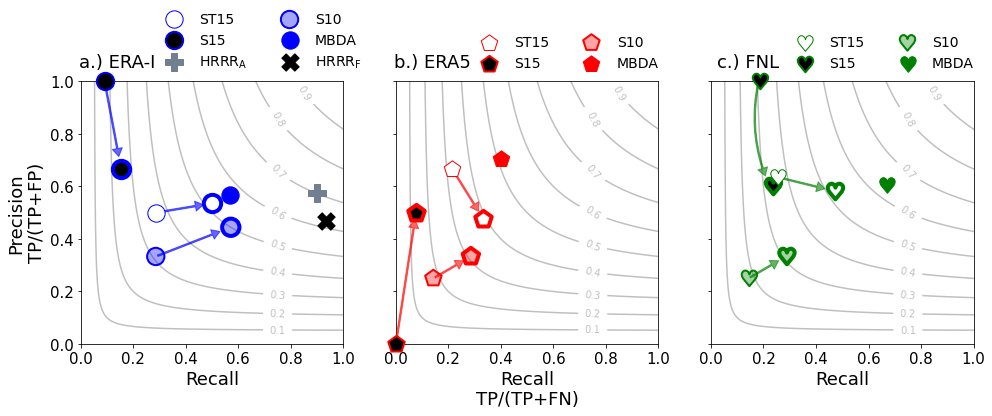

In [72]:
cases_plot_order = ['ERAI_YSU_CHRN_OST_NOSK_4DOM','ERA5_YSU_CHRN_ER5_NOSK_3DOM','GFSR_YSU_CHRN_GFS_NOSK_3DOM']

save_figs = True
show_close = False
rec_2d,prec_2d = np.meshgrid(np.arange(0,1.05,0.01),np.arange(0,1.05,0.01))
fig,ax = plt.subplots(ncols=3,figsize=(16,7),sharey=True)
    
for cc,case in enumerate(cases_plot_order):
    for mm,method in enumerate(detection_methods):
        case_plt_dict = case_dict[case]['d0{}'.format(3)]

        lbl = None
        lbl = case_plt_dict['name']
        lbl = mth_str_dict[method]
        lw = 1.0
        if mm == 0:
            fc = 'w'
            ec = case_plt_dict['color']
            a = 1.0
        elif mm == 1:
            ec = case_plt_dict['color']
            fc = 'k'
            a = 1.0
            lw = 2.0
        elif mm == 2:
            ec = 'none'
            fc = case_plt_dict['color']
            a = 0.35
            lw = 2.0

        cm_case = case + '_d03'
        marker_size = 300.0
            
        if cc == -1:
            ex_fc = 'none'
            ex_ec = 'none'
            if fc != 'none':
                ex_fc = 'k'
            if ec != 'none':
                ex_ec = 'k'

            ax[cc].scatter(-10,-10,
                   marker='*', 
                   c=ex_fc, edgecolor=ex_ec, # Colors
                   alpha=a,
                   label=method,
                   s=marker_size,zorder=5,clip_on=False)

        # OBDA - standard min/max
        ax[cc].scatter(obs_confusion_matrix_dict[cm_case][method]['recall'],obs_confusion_matrix_dict[cm_case][method]['precision'],
                   marker=case_plt_dict['marker'], 
                   c=fc, edgecolor=ec, # Colors
                   alpha=a,lw=lw,
                   label=lbl,
                   s=marker_size,zorder=500,clip_on=False)
        if mm == 2:
            ax[cc].scatter(obs_confusion_matrix_dict[cm_case][method]['recall'],obs_confusion_matrix_dict[cm_case][method]['precision'],
                       marker=case_plt_dict['marker'], 
                       c=ec, edgecolor=fc, # Colors
                       alpha=1.0,lw=lw,
                       label=lbl,
                       s=marker_size,zorder=500,clip_on=False)
        
        fcN,ecN = 'none','none'
        if fc != 'none': fcN = 'dark'+fc
        if (ec != 'none') & (ec != 'k'): ecN = 'dark'+ec
        if ec == 'k': ecN = 'k'
        # OBDA - numerical min/max
        ax[cc].scatter(obs_confusion_matrix_dict_with_numMinMax[cm_case][method]['recall'],
                   obs_confusion_matrix_dict_with_numMinMax[cm_case][method]['precision'],
                   marker=case_plt_dict['marker'], 
                   c=fc, edgecolor=ec, # Colors
                   alpha=a,lw=4.0,
                   label=None,
                   s=marker_size,zorder=5,clip_on=False)
        if mm == 2:
            ax[cc].scatter(obs_confusion_matrix_dict_with_numMinMax[cm_case][method]['recall'],
                       obs_confusion_matrix_dict_with_numMinMax[cm_case][method]['precision'],
                       marker=case_plt_dict['marker'], 
                       c=ec, edgecolor=fc, # Colors
                       alpha=1.0,lw=4.0,
                       label=None,
                       s=marker_size,zorder=5,clip_on=False)
        
        if show_close:
            ax[cc].scatter(obs_confusion_matrix_dict_close[cm_case][method]['recall'],
                           obs_confusion_matrix_dict_close[cm_case][method]['precision'],
                       marker=case_plt_dict['marker'], 
                       c=fc, edgecolor=ec, # Colors
                       alpha=a,
                       label=None,
                       s=marker_size,zorder=5,clip_on=False)

        
        arrow_xs = obs_confusion_matrix_dict[cm_case][method]['recall']
        arrow_ys = obs_confusion_matrix_dict[cm_case][method]['precision']
        arrow_xe = obs_confusion_matrix_dict_with_numMinMax[cm_case][method]['recall']
        arrow_ye = obs_confusion_matrix_dict_with_numMinMax[cm_case][method]['precision']
        arrow_alpha = 0.6
        
        arrow_lenx = arrow_xe - arrow_xs
        arrow_leny = arrow_ye - arrow_ys
        arrow_len = np.sqrt(arrow_lenx**2 + arrow_leny**2)

        if arrow_len > 0.5:
            arrow_scale = 0.96
        elif arrow_len < 0.2:
            arrow_scale = 0.85
        else:
            arrow_scale = 0.88

        arrow_xe = arrow_xs + arrow_scale*arrow_lenx
        arrow_ye = arrow_ys + arrow_scale*arrow_leny

        
        if ('GFS' in case) and (mm == 1):
            connection_style = 'arc3,rad=.15'
            arrow_xe -= 0.015
            arrow_ye -= 0.015
        elif ('ERA5' in case) and (mm == 0):
            connection_style = None
        else:
            connection_style = None
        
            
        arrow = patches.FancyArrowPatch((arrow_xs,arrow_ys),(arrow_xe,arrow_ye),connectionstyle=connection_style,
                                        color=case_plt_dict['color'],alpha=arrow_alpha,
                                        arrowstyle='Simple, tail_width=1.5, head_width=10, head_length=8',
                                        zorder=10)            
        ax[cc].add_patch(arrow)
        
        
        
        if show_close:
            arrow_xs = obs_confusion_matrix_dict[cm_case][method]['recall']
            arrow_ys = obs_confusion_matrix_dict[cm_case][method]['precision']
            arrow_xe = obs_confusion_matrix_dict_close[cm_case][method]['recall']
            arrow_ye = obs_confusion_matrix_dict_close[cm_case][method]['precision']       
            arrow_lenx = 0.9*(arrow_xe - arrow_xs)
            arrow_leny = 0.9*(arrow_ye - arrow_ys)

            arrow_xe = arrow_xs + arrow_lenx
            arrow_ye = arrow_ys + arrow_leny
            arrow = patches.FancyArrowPatch((arrow_xe,arrow_ye-0.001),(arrow_xe,arrow_ye),connectionstyle=connection_style,
                                            color=case_dict[case]['d0{}'.format(3)]['color'],alpha=0.5,
                                            arrowstyle='Simple, head_width=10, head_length=8',
                                            zorder=10,lw=None)
            ax[cc].add_patch(arrow)
            arrow_xe = arrow_xs + arrow_lenx*0.98
            arrow_ye = arrow_ys + arrow_leny*0.98
            ax.plot([arrow_xs,arrow_xe],[arrow_ys,arrow_ye-0.02],ls='--',lw=2.0,alpha=0.5,
                     color=case_dict[case]['d0{}'.format(3)]['color'])
        

    # MBDA
    meth = 'MBDA'
    ax[cc].scatter(confusion_matrix_dict[case][meth]['recall'],confusion_matrix_dict[case][meth]['precision'],
               marker=case_plt_dict['marker'], 
               c=case_plt_dict['color'], 
               #edgecolor='k', # Colors
               edgecolor=case_plt_dict['color'], # Colors
               #label=case_plt_dict['name'],
               label='MBDA',
               s=marker_size,zorder=5,clip_on=False)
    
    
    if cc == 0:
        for hrrr_case in ['HRRRa','HRRRf']:
            hrrr_case_dict = case_dict[hrrr_case]['d0{}'.format(3)]
            ax[cc].scatter(confusion_matrix_dict[hrrr_case][meth]['recall'],confusion_matrix_dict[hrrr_case][meth]['precision'],
                       marker=hrrr_case_dict['marker'], 
                       c=hrrr_case_dict['color'], 
                       #edgecolor='k', # Colors
                       edgecolor=hrrr_case_dict['color'], # Colors
                       label=hrrr_case_dict['name'],
                       #label=hrrr_case,
                       s=marker_size,zorder=5,clip_on=False)

        
    f1_lines = ax[cc].contour(rec_2d,prec_2d,2.0*((prec_2d*rec_2d)/(prec_2d+rec_2d)),
                             levels=np.arange(0.1,1,0.1),colors='k',alpha=0.25,zorder=0)
    lbl_locs = []
    for ll,f1l in enumerate(f1_lines.levels):
        if ll == 8:
            x_loc = 0.85
        else:
            x_loc = 0.75
        y_loc = ((f1l/2.0)*(x_loc))/(x_loc - f1l/2.0)
        lbl_locs.append((x_loc,y_loc))
    f1_lbls = plt.clabel(f1_lines,fmt='%1.1f',inline=0,zorder=1,manual=lbl_locs)
    [txt.set_bbox(dict(boxstyle='square,pad=0.6',fc='w',ec='w',zorder=1)) for txt in f1_lbls]
    ax[cc].set_xticks(np.arange(0,1.1,0.2))
    ax[cc].set_yticks(np.arange(0,1.1,0.2))
    ax[cc].set_ylim(0.0,1.0)
    ax[cc].set_xlim(0.0,1.0)
    ax[cc].set_aspect('equal')
    handles, labels = ax[cc].get_legend_handles_labels()

    merge2 = (handles[2],handles[3])
    handles.remove(handles[3])
    handles[2] = merge2

    #handles = [handles[0],handles[1],merge2,handles[4]]
    labels.remove(labels[3])

    if cc == 0:
        order = [0,1,4,2,3,5]
    else:
        order = [0,1,2,3]
    ax[cc].legend([handles[idx] for idx in order],[labels[idx] for idx in order],
                  loc=(0.28,1.02),frameon=False,fontsize=14,ncol=2)
    ax[cc].tick_params(labelsize=15)
    if cc == 1:
        ax[cc].set_xlabel('Recall\nTP/(TP+FN)',size=18)
    else:
        ax[cc].set_xlabel('Recall',size=18)
    if cc == 0:
        ax[cc].set_ylabel('Precision\nTP/(TP+FP)',size=18)
    ax[cc].set_title('{}.) {}'.format(ascii_lowercase[cc],case_plt_dict['name']),
                     x=0.14,y=1.03,size=18)

#    figname = '{}F1Score_{}'.format(save_dir,meth_oi)
#    plt.savefig('{}.png'.format(figname), bbox_inches = 'tight',pad_inches = 0.1)
#    plt.savefig('{}.pdf'.format(figname), bbox_inches = 'tight',pad_inches = 0.1)
if save_figs:
    plt_str = 'DASkillMetrics_combined'
    if show_close: plt_str += '_close'
    plt.savefig('{}{}.pdf'.format(save_dir,plt_str), bbox_inches = 'tight',pad_inches = 0.1)
plt.show()

# Done with plots in paper

In [248]:
# - - - - Dates with numerical onshore min/max - - - - #
bb_observed_dates_numMinMax = {
                     'StaufferThompson2015' : {
                                               '2019-07-01' : ['NAK'],
                                               '2019-07-02' : ['MTN', 'APG'],
                                               '2019-07-04' : ['NHK', 'NUI'],
                                               '2019-07-06' : ['MTN', 'NUI', 'APG'],
                                               '2019-07-09' : ['NAK', 'MTN'],
                                               '2019-07-10' : ['NUI', 'NHK'],
                                               '2019-07-15' : ['NAK'],
                                               '2019-07-16' : ['NAK', 'NHK', 'MTN'],
                                               '2019-07-17' : ['MTN', 'NAK', 'NUI', 'NUI'],
                                               '2019-07-19' : ['NAK', 'MTN', 'NHK', 'APG'],
                                               '2019-07-22' : ['MTN', 'NUI'],
                                               '2019-07-24' : ['NUI', 'NAK'],
                                               '2019-07-25' : ['NAK'],
                                               '2019-07-26' : ['MTN', 'BWI'],
                                               '2019-07-27' : ['NAK', 'MTN', 'NHK', 'NUI'],
                                               '2019-07-28' : ['NAK', 'NAK', 'NHK'],
                                               '2019-07-29' : ['MTN', 'NAK', 'NHK'],
                                               '2019-07-30' : ['MTN', 'NAK', 'NHK'],
                                               '2019-07-31' : ['NHK'],
                                              },
                     'Stauffer2015' : {
                                               '2019-07-01' : ['NAK'],
                                               '2019-07-04' : ['NHK'],
                                               '2019-07-06' : ['NUI'],
                                               '2019-07-10' : ['NHK'],
                                               '2019-07-15' : ['NAK'],
                                               '2019-07-16' : ['NAK', 'NHK'],
                                               '2019-07-17' : ['NAK'],
                                               '2019-07-19' : ['NHK'],
                                               '2019-07-22' : ['NUI'],
                                               '2019-07-27' : ['NAK', 'NAK', 'NHK'],
                                               '2019-07-28' : ['NAK'],
                                               '2019-07-29' : ['NAK', 'NHK', 'NHK'],
                                               '2019-07-30' : ['NAK', 'NHK', 'NHK'],
                                               '2019-07-31' : ['NHK'],
                                              },
                     'Sikora2010' : {
                                               '2019-07-01' : ['NAK'],
                                               '2019-07-06' : ['NUI'],
                                               '2019-07-11' : ['NHK'],
                                               '2019-07-16' : ['NAK', 'NHK'],
                                               '2019-07-24' : ['NAK'],
                                               '2019-07-25' : ['NAK'],
                                               '2019-07-27' : ['NHK'],
                                               '2019-07-28' : ['NAK', 'NHK'],
                                              },
                     }

In [45]:
metrics_for_table = ['TP','TN','FN','FP']
cases_plot_order = ['ERAI_YSU_CHRN_OST_NOSK_4DOM','ERA5_YSU_CHRN_ER5_NOSK_3DOM','GFSR_YSU_CHRN_GFS_NOSK_3DOM']

compare_minmax = True

print(r'\begin{table}')
print(r'\begin{center}')
print(r'\caption{\label{table:SkillMetrics}}')
print(r'\bgroup')
print(r'\def\arraystretch{1.5}')
format_line = r'\begin{tabular}{|c|c|'
label_line = r'\textbf{OBDA} & \textbf{Case}'
for mm,metric in enumerate(metrics_for_table):
    if compare_minmax:
        format_line += 'cc|'
        label_line += r' & \multicolumn{2}{c|}{\textbf{'+metric+r'}}'
    else:
        format_line += 'c|'
        label_line += r' & \textbf{'+metric+r'}'
format_line += r'}'
label_line += r'\\'
print(format_line)
print(r'\hline')
print(label_line)
print(r'\hline')
for mm,method in enumerate(detection_methods):
    for cc,case in enumerate(cases_plot_order):
        if cc == 0:
            line = '\multirow{3}{*}{'+ mth_str_dict[method] +'} &'
        else:
            line = ' & '
        #case = case.replace('_d03','')
        line += '{} '.format(case_dict[case.replace('_d03','')]['d03']['name'])
        for mm,metric in enumerate(metrics_for_table):
            line += '& {0:d} '.format(obs_confusion_matrix_dict[case+'_d03'][method][metric])
            if compare_minmax:
                line += ' & {0:d}'.format(obs_confusion_matrix_dict_with_numMinMax[case+'_d03'][method][metric])
        line += r'\\'
        print(line)
    print(r'\hline')
print(r'\end{tabular}')
print(r'\egroup')
print(r'\end{center}')
print(r'\end{table}')

\begin{table}
\begin{center}
\caption{\label{table:SkillMetrics}}
\bgroup
\def\arraystretch{1.5}
\begin{tabular}{|c|c|cc|cc|cc|cc|}
\hline
\textbf{OBDA} & \textbf{Case} & \multicolumn{2}{c|}{\textbf{TP}} & \multicolumn{2}{c|}{\textbf{TN}} & \multicolumn{2}{c|}{\textbf{FN}} & \multicolumn{2}{c|}{\textbf{FP}}\\
\hline
\multirow{3}{*}{ST15} &ERA-I & 8  & 15& 60  & 53& 20  & 15& 8  & 13\\
 & ERA5 & 6  & 10& 65  & 55& 22  & 20& 3  & 11\\
 & FNL & 7  & 14& 64  & 56& 21  & 16& 4  & 10\\
\hline
\multirow{3}{*}{S15} &ERA-I & 1  & 2& 69  & 66& 10  & 11& 0  & 1\\
 & ERA5 & 0  & 1& 69  & 66& 11  & 12& 0  & 1\\
 & FNL & 2  & 3& 69  & 65& 9  & 10& 0  & 2\\
\hline
\multirow{3}{*}{S10} &ERA-I & 2  & 4& 69  & 68& 5  & 3& 4  & 5\\
 & ERA5 & 1  & 2& 70  & 69& 6  & 5& 3  & 4\\
 & FNL & 1  & 2& 70  & 69& 6  & 5& 3  & 4\\
\hline
\end{tabular}
\egroup
\end{center}
\end{table}


In [249]:
# - - - - - - Dates with original onshore min/max - - - - - - #
bb_observed_dates_orig = {
                     'StaufferThompson2015' : {
                                               '2019-07-01' : ['NAK'],
                                               '2019-07-02' : ['MTN', 'APG'],
                                               '2019-07-04' : ['NHK', 'NUI'],
                                               '2019-07-06' : ['MTN', 'APG'],
                                               '2019-07-09' : ['NAK', 'MTN'],
                                               '2019-07-10' : ['NHK', 'NUI'],
                                               '2019-07-15' : ['NAK'],
                                               '2019-07-16' : ['NAK', 'NHK', 'MTN'],
                                               '2019-07-17' : ['MTN', 'NAK'],
                                               '2019-07-19' : ['NAK', 'MTN', 'NHK', 'APG'],
                                               '2019-07-22' : ['MTN'],
                                               '2019-07-24' : ['NUI', 'NUI', 'NAK'],
                                               '2019-07-25' : ['NAK'],
                                               '2019-07-26' : ['MTN', 'BWI'],
                                               '2019-07-27' : ['NAK', 'MTN', 'NHK'],
                                               '2019-07-28' : ['MTN', 'NAK', 'NAK', 'NHK'],
                                               '2019-07-29' : ['MTN', 'NAK', 'NHK'],
                                               '2019-07-30' : ['MTN', 'NAK', 'NHK'],
                                               '2019-07-31' : ['NHK'],
                                              },
                     'Stauffer2015' : {
                                               '2019-07-01' : ['NAK'],
                                               '2019-07-04' : ['NHK'],
                                               '2019-07-10' : ['NHK'],
                                               '2019-07-15' : ['NAK'],
                                               '2019-07-16' : ['NAK'],
                                               '2019-07-17' : ['NAK'],
                                               '2019-07-19' : ['NHK'],
                                               '2019-07-27' : ['NAK', 'NAK', 'NHK'],
                                               '2019-07-28' : ['NAK'],
                                               '2019-07-29' : ['NAK', 'NHK'],
                                               '2019-07-30' : ['NAK', 'NHK'],
                                               '2019-07-31' : ['NHK'],
                                              },
                     'Sikora2010' : {
                                               '2019-07-01' : ['NAK'],
                                               '2019-07-05' : ['BWI'],
                                               '2019-07-10' : ['NUI'],
                                               '2019-07-16' : ['NAK'],
                                               '2019-07-24' : ['NUI', 'NAK'],
                                               '2019-07-25' : ['NAK'],
                                               '2019-07-27' : ['NHK'],
                                               '2019-07-28' : ['NAK', 'NHK'],
                                              },
                     }

## Table for OBDAs:

In [286]:
metrics_for_table = ['CSI','Accuracy','FAR','MCC','MK']
cases_plot_order = ['ERAI_YSU_CHRN_OST_NOSK_4DOM','ERA5_YSU_CHRN_ER5_NOSK_3DOM','GFSR_YSU_CHRN_GFS_NOSK_3DOM']

compare_minmax = True

print(r'\begin{table}')
print(r'\begin{center}')
print(r'\caption{\label{table:SkillMetrics}}')
print(r'\bgroup')
print(r'\def\arraystretch{1.5}')
format_line = r'\begin{tabular}{|c|c|'
label_line = r'\textbf{OBDA} & \textbf{Case}'
for mm,metric in enumerate(metrics_for_table):
    format_line += 'c|'
    label_line += r' & \textbf{'+metric+r'}'
format_line += r'}'
label_line += r'\\'
print(format_line)
print(r'\hline')
print(label_line)
print(r'\hline')
for mm,method in enumerate(detection_methods):
    for cc,case in enumerate(cases_plot_order):
        if cc == 0:
            line = '\multirow{3}{*}{'+ mth_str_dict[method] +'} &'
        else:
            line = ' & '
        #case = case.replace('_d03','')
        line += '{} '.format(case_dict[case.replace('_d03','')]['d03']['name'])
        for mm,metric in enumerate(metrics_for_table):
            line += '& {0:3.2f} '.format(obs_confusion_matrix_dict[case+'_d03'][method][metric])
            if compare_minmax:
                line += '({0:3.2f})'.format(obs_confusion_matrix_dict_with_numMinMax[case+'_d03'][method][metric])
        line += r'\\'
        print(line)
    print(r'\hline')
print(r'\end{tabular}')
print(r'\egroup')
print(r'\end{center}')
print(r'\end{table}')

\begin{table}
\begin{center}
\caption{\label{table:SkillMetrics}}
\bgroup
\def\arraystretch{1.5}
\begin{tabular}{|c|c|c|c|c|c|c|}
\hline
\textbf{OBDA} & \textbf{Case} & \textbf{CSI} & \textbf{Accuracy} & \textbf{FAR} & \textbf{MCC} & \textbf{MK}\\
\hline
\multirow{3}{*}{ST15} &ERA-I & 0.21 (0.35)& 0.69 (0.71)& 0.50 (0.46)& 0.18 (0.31)& 0.23 (0.32)\\
 & ERA5 & 0.18 (0.24)& 0.72 (0.68)& 0.33 (0.52)& 0.25 (0.19)& 0.39 (0.21)\\
 & FNL & 0.21 (0.35)& 0.72 (0.73)& 0.36 (0.42)& 0.25 (0.34)& 0.37 (0.36)\\
\hline
\multirow{3}{*}{S15} &ERA-I & 0.08 (0.14)& 0.85 (0.85)& 0.00 (0.33)& 0.26 (0.27)& 0.85 (0.52)\\
 & ERA5 & 0.00 (0.07)& 0.84 (0.84)& 0.00 (0.50)& nan (0.15)& -0.16 (0.35)\\
 & FNL & 0.15 (0.20)& 0.86 (0.85)& 0.00 (0.40)& 0.36 (0.31)& 0.86 (0.47)\\
\hline
\multirow{3}{*}{S10} &ERA-I & 0.08 (0.33)& 0.86 (0.90)& 0.83 (0.56)& 0.08 (0.45)& 0.09 (0.40)\\
 & ERA5 & 0.10 (0.18)& 0.89 (0.89)& 0.75 (0.67)& 0.13 (0.25)& 0.17 (0.27)\\
 & FNL & 0.10 (0.18)& 0.89 (0.89)& 0.75 (0.67)& 0.13 (0.25)& 0.1

In [287]:
metrics_for_table = ['CSI','Accuracy','FAR','MCC','MK']
cases_plot_order = ['ERAI_YSU_CHRN_OST_NOSK_4DOM','ERA5_YSU_CHRN_ER5_NOSK_3DOM','GFSR_YSU_CHRN_GFS_NOSK_3DOM']

compare_minmax = False

print(r'\begin{table}')
print(r'\begin{center}')
print(r'\caption{\label{table:SkillMetrics}}')
print(r'\bgroup')
print(r'\def\arraystretch{1.5}')
format_line = r'\begin{tabular}{|c|c|'
label_line = r'\textbf{OBDA} & \textbf{Case}'
for mm,metric in enumerate(metrics_for_table):
    if compare_minmax:
        format_line += 'cc|'
        metric_str = metric
        label_line += r' & \multicolumn{2}{c|}{\textbf{'+metric_str+r'}}'
    else:
        format_line += 'c|'
        metric_str = metric
        if metric == 'Accuracy': metric_str = 'Acc.'
        label_line += r' & \textbf{'+metric_str+r'}'
format_line += r'}'
label_line += r'\\'
print(format_line)
print(r'\hline')
print(label_line)
print(r'\hline')
for mm,method in enumerate(detection_methods):
    for cc,case in enumerate(cases_plot_order):
        if cc == 0:
            line = '\multirow{3}{*}{'+ mth_str_dict[method] +'} &'
        else:
            line = ' & '
        #case = case.replace('_d03','')
        line += '{} '.format(case_dict[case.replace('_d03','')]['d03']['name'])
        for mm,metric in enumerate(metrics_for_table):
            line += '& {0:3.2f} '.format(obs_confusion_matrix_dict[case+'_d03'][method][metric])
            if compare_minmax:
                line += ' & {0:3.2f} '.format(obs_confusion_matrix_dict_with_numMinMax[case+'_d03'][method][metric])
        line += r'\\'
        print(line)
    print(r'\hline')
print(r'\end{tabular}')
print(r'\egroup')
print(r'\end{center}')
print(r'\end{table}')

\begin{table}
\begin{center}
\caption{\label{table:SkillMetrics}}
\bgroup
\def\arraystretch{1.5}
\begin{tabular}{|c|c|c|c|c|c|c|}
\hline
\textbf{OBDA} & \textbf{Case} & \textbf{CSI} & \textbf{Acc.} & \textbf{FAR} & \textbf{MCC} & \textbf{MK}\\
\hline
\multirow{3}{*}{ST15} &ERA-I & 0.21 & 0.69 & 0.50 & 0.18 & 0.23 \\
 & ERA5 & 0.18 & 0.72 & 0.33 & 0.25 & 0.39 \\
 & FNL & 0.21 & 0.72 & 0.36 & 0.25 & 0.37 \\
\hline
\multirow{3}{*}{S15} &ERA-I & 0.08 & 0.85 & 0.00 & 0.26 & 0.85 \\
 & ERA5 & 0.00 & 0.84 & 0.00 & nan & -0.16 \\
 & FNL & 0.15 & 0.86 & 0.00 & 0.36 & 0.86 \\
\hline
\multirow{3}{*}{S10} &ERA-I & 0.08 & 0.86 & 0.83 & 0.08 & 0.09 \\
 & ERA5 & 0.10 & 0.89 & 0.75 & 0.13 & 0.17 \\
 & FNL & 0.10 & 0.89 & 0.75 & 0.13 & 0.17 \\
\hline
\end{tabular}
\egroup
\end{center}
\end{table}


/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:159: RuntimeWarning: divide by zero encountered in true_divide
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:159: RuntimeWarning: invalid value encountered in true_divide


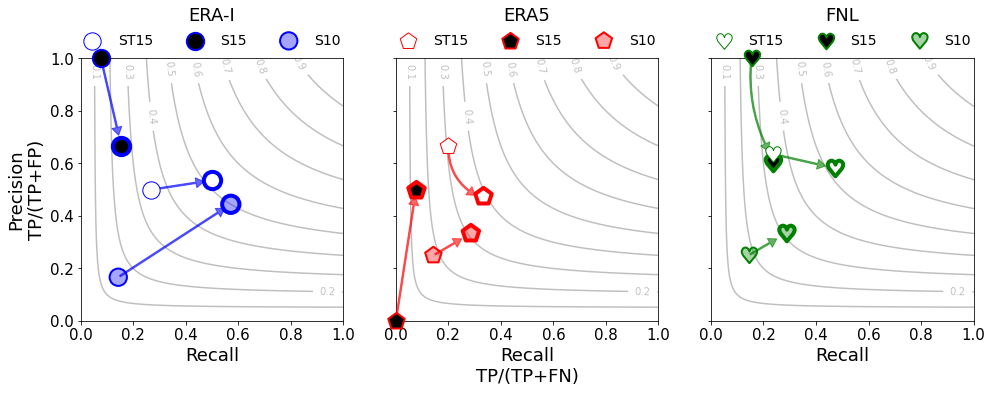

In [288]:
cases_plot_order = ['ERAI_YSU_CHRN_OST_NOSK_4DOM','ERA5_YSU_CHRN_ER5_NOSK_3DOM','GFSR_YSU_CHRN_GFS_NOSK_3DOM']

save_figs = True
show_close = False
rec_2d,prec_2d = np.meshgrid(np.arange(0,1.05,0.01),np.arange(0,1.05,0.01))
fig,ax = plt.subplots(ncols=3,figsize=(16,7),sharey=True)
    
for cc,case in enumerate(cases_plot_order):
    for mm,method in enumerate(detection_methods):
        case_plt_dict = case_dict[case]['d0{}'.format(3)]

        lbl = None
        lbl = case_plt_dict['name']
        lbl = mth_str_dict[method]
        lw = 1.0
        if mm == 0:
            fc = 'w'
            ec = case_plt_dict['color']
            a = 1.0
        elif mm == 1:
            ec = case_plt_dict['color']
            fc = 'k'
            a = 1.0
            lw = 2.0
        elif mm == 2:
            ec = 'none'
            fc = case_plt_dict['color']
            a = 0.35
            lw = 2.0

        cm_case = case + '_d03'
        marker_size = 300.0
            
        if cc == -1:
            ex_fc = 'none'
            ex_ec = 'none'
            if fc != 'none':
                ex_fc = 'k'
            if ec != 'none':
                ex_ec = 'k'

            ax[cc].scatter(-10,-10,
                   marker='*', 
                   c=ex_fc, edgecolor=ex_ec, # Colors
                   alpha=a,
                   label=method,
                   s=marker_size,zorder=5,clip_on=False)


        ax[cc].scatter(obs_confusion_matrix_dict[cm_case][method]['recall'],obs_confusion_matrix_dict[cm_case][method]['precision'],
                   marker=case_plt_dict['marker'], 
                   c=fc, edgecolor=ec, # Colors
                   alpha=a,lw=lw,
                   label=lbl,
                   s=marker_size,zorder=500,clip_on=False)
        if mm == 2:
            ax[cc].scatter(obs_confusion_matrix_dict[cm_case][method]['recall'],obs_confusion_matrix_dict[cm_case][method]['precision'],
                       marker=case_plt_dict['marker'], 
                       c=ec, edgecolor=fc, # Colors
                       alpha=1.0,lw=lw,
                       label=lbl,
                       s=marker_size,zorder=500,clip_on=False)
        
        fcN,ecN = 'none','none'
        if fc != 'none': fcN = 'dark'+fc
        if (ec != 'none') & (ec != 'k'): ecN = 'dark'+ec
        if ec == 'k': ecN = 'k'
        ax[cc].scatter(obs_confusion_matrix_dict_with_numMinMax[cm_case][method]['recall'],
                   obs_confusion_matrix_dict_with_numMinMax[cm_case][method]['precision'],
                   marker=case_plt_dict['marker'], 
                   c=fc, edgecolor=ec, # Colors
                   alpha=a,lw=4.0,
                   label=None,
                   s=marker_size,zorder=5,clip_on=False)
        if mm == 2:
            ax[cc].scatter(obs_confusion_matrix_dict_with_numMinMax[cm_case][method]['recall'],
                       obs_confusion_matrix_dict_with_numMinMax[cm_case][method]['precision'],
                       marker=case_plt_dict['marker'], 
                       c=ec, edgecolor=fc, # Colors
                       alpha=1.0,lw=4.0,
                       label=None,
                       s=marker_size,zorder=5,clip_on=False)
        
        if show_close:
            ax[cc].scatter(obs_confusion_matrix_dict_close[cm_case][method]['recall'],
                           obs_confusion_matrix_dict_close[cm_case][method]['precision'],
                       marker=case_plt_dict['marker'], 
                       c=fc, edgecolor=ec, # Colors
                       alpha=a,
                       label=None,
                       s=marker_size,zorder=5,clip_on=False)

        
        arrow_xs = obs_confusion_matrix_dict[cm_case][method]['recall']
        arrow_ys = obs_confusion_matrix_dict[cm_case][method]['precision']
        arrow_xe = obs_confusion_matrix_dict_with_numMinMax[cm_case][method]['recall']
        arrow_ye = obs_confusion_matrix_dict_with_numMinMax[cm_case][method]['precision']
        arrow_alpha = 0.6
        
        arrow_lenx = arrow_xe - arrow_xs
        arrow_leny = arrow_ye - arrow_ys
        arrow_len = np.sqrt(arrow_lenx**2 + arrow_leny**2)

        if arrow_len > 0.5:
            arrow_scale = 0.96
        elif arrow_len < 0.2:
            arrow_scale = 0.8
        else:
            arrow_scale = 0.9

        arrow_xe = arrow_xs + arrow_scale*arrow_lenx
        arrow_ye = arrow_ys + arrow_scale*arrow_leny

        
        if ('GFS' in case) and (mm == 1):
            connection_style = 'arc3,rad=.15'
            #arrow_ye += 0.015
        elif ('ERAI' in case) and (mm == 2):
            connection_style = None
            #arrow_ye += 0.015
        elif ('ERA5' in case) and (mm == 0):
            connection_style = 'arc3,rad=.3'
            arrow_ye -= 0.02
            arrow_xe -= 0.01
        else:
            connection_style = None
        
            
        arrow = patches.FancyArrowPatch((arrow_xs,arrow_ys),(arrow_xe,arrow_ye),connectionstyle=connection_style,
                                        color=case_plt_dict['color'],alpha=arrow_alpha,
                                        arrowstyle='Simple, tail_width=1.5, head_width=10, head_length=8',
                                        zorder=10)            
        ax[cc].add_patch(arrow)
        
        
        
        if show_close:
            arrow_xs = obs_confusion_matrix_dict[cm_case][method]['recall']
            arrow_ys = obs_confusion_matrix_dict[cm_case][method]['precision']
            arrow_xe = obs_confusion_matrix_dict_close[cm_case][method]['recall']
            arrow_ye = obs_confusion_matrix_dict_close[cm_case][method]['precision']       
            arrow_lenx = 0.9*(arrow_xe - arrow_xs)
            arrow_leny = 0.9*(arrow_ye - arrow_ys)

            arrow_xe = arrow_xs + arrow_lenx
            arrow_ye = arrow_ys + arrow_leny
            arrow = patches.FancyArrowPatch((arrow_xe,arrow_ye-0.001),(arrow_xe,arrow_ye),connectionstyle=connection_style,
                                            color=case_dict[case]['d0{}'.format(3)]['color'],alpha=0.5,
                                            arrowstyle='Simple, head_width=10, head_length=8',
                                            zorder=10,lw=None)
            ax[cc].add_patch(arrow)
            arrow_xe = arrow_xs + arrow_lenx*0.98
            arrow_ye = arrow_ys + arrow_leny*0.98
            ax.plot([arrow_xs,arrow_xe],[arrow_ys,arrow_ye-0.02],ls='--',lw=2.0,alpha=0.5,
                     color=case_dict[case]['d0{}'.format(3)]['color'])
        


    f1_lines = ax[cc].contour(rec_2d,prec_2d,2.0*((prec_2d*rec_2d)/(prec_2d+rec_2d)),
                             levels=np.arange(0.1,1,0.1),colors='k',alpha=0.25,zorder=0)
    f1_lbls = plt.clabel(f1_lines,fmt='%1.1f',inline=0,zorder=1)
    [txt.set_bbox(dict(boxstyle='square,pad=0.6',fc='w',ec='w',zorder=1)) for txt in f1_lbls]
    ax[cc].set_xticks(np.arange(0,1.1,0.2))
    ax[cc].set_yticks(np.arange(0,1.1,0.2))
    ax[cc].set_ylim(0.0,1.0)
    ax[cc].set_xlim(0.0,1.0)
    ax[cc].set_aspect('equal')
    handles, labels = ax[cc].get_legend_handles_labels()
    merge2 = (handles[2],handles[3])
    handles = [handles[0],handles[1],merge2]
    labels = labels[:3]
    order = [0,1,2]
    ax[cc].legend([handles[idx] for idx in order],[labels[idx] for idx in order],
                  loc=(-0.03,1.02),frameon=False,fontsize=14,ncol=3)
    ax[cc].tick_params(labelsize=15)
    if cc == 1:
        ax[cc].set_xlabel('Recall\nTP/(TP+FN)',size=18)
    else:
        ax[cc].set_xlabel('Recall',size=18)
    ax[cc].set_title(case_plt_dict['name'],y=1.12,size=18)
    if cc == 0:
        ax[cc].set_ylabel('Precision\nTP/(TP+FP)',size=18)

#    figname = '{}F1Score_{}'.format(save_dir,meth_oi)
#    plt.savefig('{}.png'.format(figname), bbox_inches = 'tight',pad_inches = 0.1)
#    plt.savefig('{}.pdf'.format(figname), bbox_inches = 'tight',pad_inches = 0.1)
if save_figs:
    plt_str = 'OBDASkillMetrics'
    if show_close: plt_str += '_close'
    plt.savefig('{}{}.pdf'.format(save_dir,plt_str), bbox_inches = 'tight',pad_inches = 0.1)
plt.show()

/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:123: RuntimeWarning: divide by zero encountered in true_divide
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:123: RuntimeWarning: invalid value encountered in true_divide


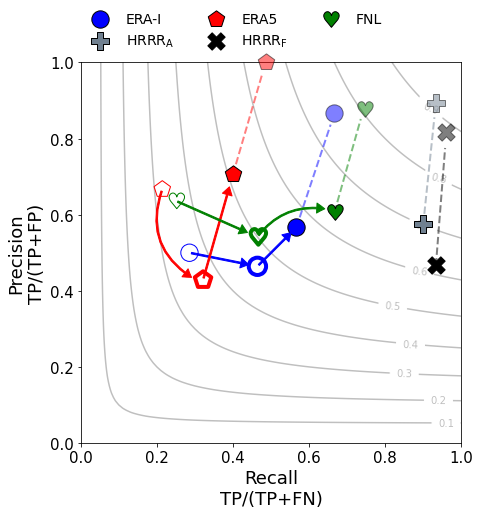

In [173]:
cases_plot_order = ['ERAI_YSU_CHRN_OST_NOSK_4DOM','HRRRa','ERA5_YSU_CHRN_ER5_NOSK_3DOM','HRRRf','GFSR_YSU_CHRN_GFS_NOSK_3DOM']

save_figs = False
meth = 'MBDA'
rec_2d,prec_2d = np.meshgrid(np.arange(0,1.05,0.01),np.arange(0,1.05,0.01))
show_close = True
meth_oi ='StaufferThompson2015'
fig,ax = plt.subplots(figsize=(16,7))
for cc,case in enumerate(cases_plot_order):
    case_plt_dict = case_dict[case]['d0{}'.format(3)]

    cm_case = case + '_d03'
    marker_size = 300.0
    if marker_size == 0.0:
        marker_style = 'x'
        marker_size = 20
    else:
        marker_style = 'o'
        
    ax.scatter(confusion_matrix_dict[case][meth]['recall'],confusion_matrix_dict[case][meth]['precision'],
               marker=case_plt_dict['marker'], 
               c=case_plt_dict['color'], edgecolor='k', # Colors
               label=case_plt_dict['name'],
               s=marker_size,zorder=5,clip_on=False)
    if show_close:
        ax.scatter(confusion_matrix_dict_close[case][meth]['recall'],confusion_matrix_dict_close[case][meth]['precision'],
                   marker=case_plt_dict['marker'], alpha=0.5,
                   c=case_plt_dict['color'], edgecolor='k', # Colors
                   s=marker_size,zorder=5,
                   clip_on=False)
    if 'HRRR' not in case:
        ax.scatter(obs_confusion_matrix_dict_with_numMinMax[cm_case][meth_oi]['recall'],
                   obs_confusion_matrix_dict_with_numMinMax[cm_case][meth_oi]['precision'],
                   marker=case_plt_dict['marker'], 
                   c='none', edgecolor=case_plt_dict['color'], # Colors
                   #label=case_plt_dict['name'],
                   s=marker_size,zorder=5,alpha=1.0,lw=4.0,clip_on=False)

        ax.scatter(obs_confusion_matrix_dict[cm_case][meth_oi]['recall'],
                   obs_confusion_matrix_dict[cm_case][meth_oi]['precision'],
                   marker=case_plt_dict['marker'], 
                   c='none', edgecolor=case_plt_dict['color'], # Colors
                   #label=case_plt_dict['name'],
                   s=marker_size,zorder=5,alpha=1.0,clip_on=False)
    
        for narrow in range(0,3):
            if narrow == 0:
                arrow_xs = obs_confusion_matrix_dict_with_numMinMax[cm_case][meth_oi]['recall']
                arrow_ys = obs_confusion_matrix_dict_with_numMinMax[cm_case][meth_oi]['precision']
                arrow_xe = confusion_matrix_dict[case][meth]['recall']
                arrow_ye = confusion_matrix_dict[case][meth]['precision']
                arrow_alpha = 1.0
            if narrow == 1:
                arrow_xs = confusion_matrix_dict[case][meth]['recall']
                arrow_ys = confusion_matrix_dict[case][meth]['precision']
                arrow_xe = confusion_matrix_dict_close[case][meth]['recall']
                arrow_ye = confusion_matrix_dict_close[case][meth]['precision']
                arrow_alpha = 1.0
            if narrow == 2:
                arrow_xs = obs_confusion_matrix_dict[cm_case][meth_oi]['recall']
                arrow_ys = obs_confusion_matrix_dict[cm_case][meth_oi]['precision']
                arrow_xe = obs_confusion_matrix_dict_with_numMinMax[cm_case][meth_oi]['recall']
                arrow_ye = obs_confusion_matrix_dict_with_numMinMax[cm_case][meth_oi]['precision']
                arrow_alpha = 1.0

            arrow_lenx = 0.9*(arrow_xe - arrow_xs)
            arrow_leny = 0.9*(arrow_ye - arrow_ys)

            arrow_xe = arrow_xs + arrow_lenx
            arrow_ye = arrow_ys + arrow_leny

            if ('GFS' in case) and (narrow == 0):
                connection_style = 'arc3,rad=-.3'
                arrow_ye += 0.015
            elif ('ERA5' in case) and (narrow == 2):
                connection_style = 'arc3,rad=.4'
                arrow_xe += -0.015
                arrow_ye += -0.02
            else:
                connection_style = None
            if narrow == 1: 
                if show_close:

                    arrow = patches.FancyArrowPatch((arrow_xe,arrow_ye-0.001),(arrow_xe,arrow_ye),connectionstyle=connection_style,
                                                    color=case_dict[case]['d0{}'.format(3)]['color'],alpha=0.5,
                                                    arrowstyle='Simple, head_width=10, head_length=8',
                                                    zorder=100,lw=None)
                    #ax.add_patch(arrow)
                    arrow_xe = arrow_xs + arrow_lenx#*0.99
                    arrow_ye = arrow_ys + arrow_leny#*0.99
                    ax.plot([arrow_xs,arrow_xe],[arrow_ys,arrow_ye],ls='--',lw=2.0,alpha=0.5,
                             color=case_dict[case]['d0{}'.format(3)]['color'])
            else:

                arrow = patches.FancyArrowPatch((arrow_xs,arrow_ys),(arrow_xe,arrow_ye),connectionstyle=connection_style,
                                                color=case_dict[case]['d0{}'.format(3)]['color'],alpha=arrow_alpha,
                                                arrowstyle='Simple, tail_width=1.5, head_width=10, head_length=8',
                                                zorder=100)            

                ax.add_patch(arrow)
    else:
        if show_close:
            arrow_xs = confusion_matrix_dict[case][meth]['recall']
            arrow_ys = confusion_matrix_dict[case][meth]['precision']  
            arrow_xe = confusion_matrix_dict_close[case][meth]['recall']
            arrow_ye = confusion_matrix_dict_close[case][meth]['precision']      
            arrow_lenx = 0.9*(arrow_xe - arrow_xs)
            arrow_leny = 0.9*(arrow_ye - arrow_ys)

            arrow_xe = arrow_xs + arrow_lenx
            arrow_ye = arrow_ys + arrow_leny
            arrow = patches.FancyArrowPatch((arrow_xe,arrow_ye),(arrow_xe,arrow_ye),connectionstyle=connection_style,
                                            color=case_dict[case]['d0{}'.format(3)]['color'],alpha=0.5,
                                            arrowstyle='Simple, head_width=10, head_length=8',
                                            zorder=100,lw=0.0)
            #ax.add_patch(arrow)
            arrow_xe = arrow_xs + arrow_lenx*0.98
            arrow_ye = arrow_ys + arrow_leny*0.98
            ax.plot([arrow_xs,arrow_xe],[arrow_ys,arrow_ye],ls='--',lw=2.0,
                     color=case_dict[case]['d0{}'.format(3)]['color'],alpha=0.5)

    
f1_lines = ax.contour(rec_2d,prec_2d,2.0*((prec_2d*rec_2d)/(prec_2d+rec_2d)),
                             levels=np.arange(0.1,1,0.1),colors='k',alpha=0.25,zorder=0)
f1_lbls = plt.clabel(f1_lines,fmt='%1.1f',inline=0,zorder=1)
[txt.set_bbox(dict(boxstyle='square,pad=0.6',fc='w',ec='w',zorder=1)) for txt in f1_lbls]
ax.set_xticks(np.arange(0,1.1,0.2))
ax.set_yticks(np.arange(0,1.1,0.2))
ax.set_ylim(0.0,1.0)
ax.set_xlim(0.0,1.0)
ax.set_aspect('equal')
ax.legend(loc=(0.0,1.02),frameon=False,fontsize=14,ncol=3)
ax.tick_params(labelsize=15)
ax.set_xlabel('Recall\nTP/(TP+FN)',size=18)

#ax.text(0.12,0.79,'{}.)'.format(ascii_lowercase[pltax]),ha='left',va='top',size=16)
ax.set_ylabel('Precision\nTP/(TP+FP)',size=18)

#    figname = '{}F1Score_{}'.format(save_dir,meth_oi)
#    plt.savefig('{}.png'.format(figname), bbox_inches = 'tight',pad_inches = 0.1)
#    plt.savefig('{}.pdf'.format(figname), bbox_inches = 'tight',pad_inches = 0.1)
if save_figs:
    plt_str = 'AllSkillMetricsFandA'
    if show_close: plt_str += '_close'
    plt.savefig('{}{}.pdf'.format(save_dir,plt_str), bbox_inches = 'tight',pad_inches = 0.1)
plt.show()

/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:167: RuntimeWarning: divide by zero encountered in true_divide
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:167: RuntimeWarning: invalid value encountered in true_divide


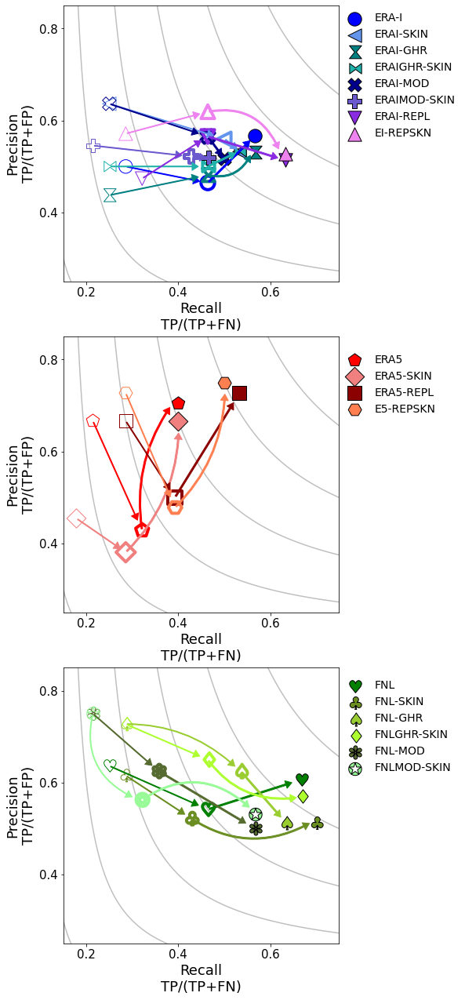

In [132]:
save_figs = False

rec_2d,prec_2d = np.meshgrid(np.arange(0,1.05,0.01),np.arange(0,1.05,0.01))
show_close = False
meth_oi ='StaufferThompson2015'
fig,ax = plt.subplots(nrows=3,figsize=(9,22))
for cc,case in enumerate(cases):
    case_plt_dict = case_dict[case]['d0{}'.format(3)]
    if 'ERAI' in case:
        pax = ax[0]
    elif 'ERA5' in case:
        pax = ax[1]
    elif 'GFSR' in case:
        pax = ax[2]
    cm_case = case
    marker_size = 300.0
    if marker_size == 0.0:
        marker_style = 'x'
        marker_size = 20
    else:
        marker_style = 'o'
        
    pax.scatter(confusion_matrix_dict_close[cm_case]['recall'],confusion_matrix_dict_close[cm_case]['precision'],
               marker=case_plt_dict['marker'], 
               c=case_plt_dict['color'], edgecolor='k', # Colors
               label=case_plt_dict['name'],
               s=marker_size,zorder=50)
    
    if show_close:
        pax.scatter(confusion_matrix_dict[cm_case]['recall'],confusion_matrix_dict[cm_case]['precision'],
                   marker=case_plt_dict['marker'], alpha=0.5,
                   c=case_plt_dict['color'], edgecolor='k', # Colors
                   s=marker_size,zorder=50,
                   clip_on=False)
    if 'HRRR' not in case:
        pax.scatter(obs_confusion_matrix_dict_with_numMinMax[case][meth_oi]['recall'],
                   obs_confusion_matrix_dict_with_numMinMax[case][meth_oi]['precision'],
                   marker=case_plt_dict['marker'], 
                   c='none', edgecolor=case_plt_dict['color'], # Colors
                   #label=case_plt_dict['name'],
                   s=marker_size,zorder=40,alpha=1.0,lw=4.0)
        

        pax.scatter(obs_confusion_matrix_dict_with_numMinMax[case][meth_oi]['recall'],
                   obs_confusion_matrix_dict_with_numMinMax[case][meth_oi]['precision'],
                   marker=case_plt_dict['marker'], 
                   c='none', edgecolor=case_plt_dict['color'], # Colors
                   #label=case_plt_dict['name'],
                   s=marker_size,zorder=40,alpha=1.0)
        
        pax.scatter(obs_confusion_matrix_dict[case][meth_oi]['recall'],
                   obs_confusion_matrix_dict[case][meth_oi]['precision'],
                   marker=case_plt_dict['marker'], 
                   c='none', edgecolor=case_plt_dict['color'], # Colors
                   #label=case_plt_dict['name'],
                   s=marker_size,zorder=30,alpha=1.0)
    
        for narrow in range(0,3):
            if narrow == 0:
                arrow_xs = obs_confusion_matrix_dict_with_numMinMax[case][meth_oi]['recall']
                arrow_ys = obs_confusion_matrix_dict_with_numMinMax[case][meth_oi]['precision']
                arrow_xe = confusion_matrix_dict_close[case]['recall']
                arrow_ye = confusion_matrix_dict_close[case]['precision']
                arrow_alpha = 1.0
            if narrow == 1:
                arrow_xs = confusion_matrix_dict_close[case]['recall']
                arrow_ys = confusion_matrix_dict_close[case]['precision']
                arrow_xe = confusion_matrix_dict[case]['recall']
                arrow_ye = confusion_matrix_dict[case]['precision']
                arrow_alpha = 1.0
            if narrow == 2:
                arrow_xs = obs_confusion_matrix_dict[case][meth_oi]['recall']
                arrow_ys = obs_confusion_matrix_dict[case][meth_oi]['precision']
                arrow_xe = obs_confusion_matrix_dict_with_numMinMax[case][meth_oi]['recall']
                arrow_ye = obs_confusion_matrix_dict_with_numMinMax[case][meth_oi]['precision']
                arrow_alpha = 1.0

            arrow_lenx = 0.92*(arrow_xe - arrow_xs)
            arrow_leny = 0.92*(arrow_ye - arrow_ys)

            arrow_xe = arrow_xs + arrow_lenx
            arrow_ye = arrow_ys + arrow_leny

            if ('GFS' in case) and ('GFS_SKNT' in case) and (narrow == 0):
                connection_style = 'arc3,rad=.3'
                arrow_xe += 0.01
            elif ('GFS' in case) and ('GHR_NOSK' in case) and (narrow == 2):
                connection_style = 'arc3,rad=-.2'
                arrow_xe += 0.01
            elif ('GFS' in case) and ('GHR_SKNT' in case) and (narrow == 0):
                connection_style = 'arc3,rad=.3'
                arrow_xe += 0.01
                arrow_ye += -0.01
            elif ('GFS' in case) and ('MOD_SKNT' in case) and (narrow == 2):
                connection_style = 'arc3,rad=.4'
                arrow_xe += -0.01
                arrow_ye += -0.01
            elif ('GFS' in case) and ('MOD_SKNT' in case) and (narrow == 0):
                connection_style = 'arc3,rad=-.4'
                arrow_xe += 0.01
                arrow_ye += 0.01
            elif ('ERAI' in case) and ('OVSK' in case) and (narrow == 0):
                connection_style = 'arc3,rad=-.4'
            elif ('ERAI' in case) and ('GHR_NO' in case) and (narrow == 0):
                connection_style = 'arc3,rad=.4'
            elif ('ERA5' in case) and ('OVSK' in case) and (narrow == 0):
                connection_style = 'arc3,rad=.2'
                arrow_xe += 0.01
            elif ('ERA5' in case) and ('NOSK' in case) and (narrow == 0):
                connection_style = 'arc3,rad=-.2'
                arrow_ye += 0.015
                arrow_xe += -0.01
            elif ('ERA5' in case) and ('SKNT' in case) and (narrow == 0):
                connection_style = 'arc3,rad=.2'
                arrow_xe += 0.01
                #arrow_ye += 0.02
            else:
                connection_style = None
            if narrow == 1: 
                if show_close:

                    arrow = patches.FancyArrowPatch((arrow_xe,arrow_ye-0.001),(arrow_xe,arrow_ye),connectionstyle=connection_style,
                                                    color=case_dict[case]['d0{}'.format(3)]['color'],alpha=0.5,
                                                    arrowstyle='Simple, head_width=10, head_length=8',
                                                    zorder=40,lw=None)
                    pax.add_patch(arrow)
                    arrow_xe = arrow_xs + arrow_lenx*0.98
                    arrow_ye = arrow_ys + arrow_leny*0.98
                    pax.plot([arrow_xs,arrow_xe],[arrow_ys,arrow_ye-0.02],ls='--',lw=2.0,alpha=0.5,
                             color=case_dict[case]['d0{}'.format(3)]['color'])
            else:
                if narrow == 2: 
                    tw = '1.0'
                else:
                    tw = '2.0'
                arrow = patches.FancyArrowPatch((arrow_xs,arrow_ys),(arrow_xe,arrow_ye),connectionstyle=connection_style,
                                                color=case_dict[case]['d0{}'.format(3)]['color'],alpha=arrow_alpha,
                                                arrowstyle='Simple, tail_width={}, head_width=10, head_length=8'.format(tw),
                                                zorder=50)            

                pax.add_patch(arrow)
    else:
        if show_close:
            arrow_xs = confusion_matrix_dict_close[case]['recall']
            arrow_ys = confusion_matrix_dict_close[case]['precision']
            arrow_xe = confusion_matrix_dict[case]['recall']
            arrow_ye = confusion_matrix_dict[case]['precision']        
            arrow_lenx = 0.9*(arrow_xe - arrow_xs)
            arrow_leny = 0.9*(arrow_ye - arrow_ys)
            #arrow_lenx = (arrow_xe - arrow_xs)-0.01
            #arrow_leny = (arrow_ye - arrow_ys)-0.01

            arrow_xe = arrow_xs + arrow_lenx
            arrow_ye = arrow_ys + arrow_leny
            arrow = patches.FancyArrowPatch((arrow_xe,arrow_ye-0.001),(arrow_xe,arrow_ye),connectionstyle=connection_style,
                                            color=case_dict[case]['d0{}'.format(3)]['color'],alpha=0.5,
                                            arrowstyle='Simple, head_width=10, head_length=8',
                                            zorder=100,lw=0.0)
            pax.add_patch(arrow)
            arrow_xe = arrow_xs + arrow_lenx*0.98
            arrow_ye = arrow_ys + arrow_leny*0.98
            pax.plot([arrow_xs,arrow_xe],[arrow_ys,arrow_ye-0.02],ls='--',lw=2.0,
                     color=case_dict[case]['d0{}'.format(3)]['color'],alpha=0.5)

    
for pax in range(0,3):
    f1_lines = ax[pax].contour(rec_2d,prec_2d,2.0*((prec_2d*rec_2d)/(prec_2d+rec_2d)),
                                 levels=np.arange(0.1,1,0.1),colors='k',alpha=0.25,zorder=0)
    f1_lbls = plt.clabel(f1_lines,fmt='%1.1f',inline=0,zorder=1)
    [txt.set_bbox(dict(boxstyle='square,pad=0.6',fc='w',ec='w',zorder=1)) for txt in f1_lbls]
    ax[pax].set_xticks(np.arange(0,1.1,0.2))
    ax[pax].set_yticks(np.arange(0,1.1,0.2))
    ax[pax].set_ylim(0.25,0.85)
    ax[pax].set_xlim(0.15,0.75)
    ax[pax].set_aspect('equal')
    if pax == 0:
        leg_y = 0.5
    elif pax == 1:
        leg_y = 0.7
    elif pax == 2:
        leg_y = 0.6
    ax[pax].legend(loc=(1.0,leg_y),frameon=False,fontsize=14,ncol=1)
    ax[pax].tick_params(labelsize=15)
    ax[pax].set_xlabel('Recall\nTP/(TP+FN)',size=18)

    #pax.text(0.12,0.79,'{}.)'.format(ascii_lowercase[pltax]),ha='left',va='top',size=16)
    ax[pax].set_ylabel('Precision\nTP/(TP+FP)',size=18)

#    figname = '{}F1Score_{}'.format(save_dir,meth_oi)
#    plt.savefig('{}.png'.format(figname), bbox_inches = 'tight',pad_inches = 0.1)
#    plt.savefig('{}.pdf'.format(figname), bbox_inches = 'tight',pad_inches = 0.1)
if save_figs:
    plt_str = 'AllSkillMetricsFandA'
    if show_close: plt_str += '_close'
    plt.savefig('{}{}.pdf'.format(save_dir,plt_str), bbox_inches = 'tight',pad_inches = 0.1)
plt.show()

In [62]:
cases_plot_order = ['ERAI_YSU_CHRN_OST_NOSK_4DOM','ERA5_YSU_CHRN_ER5_NOSK_3DOM','GFSR_YSU_CHRN_GFS_NOSK_3DOM','HRRRa','HRRRf']

# Skill Table 1
metrics_for_table = ['CSI','Accuracy','FAR','MCC','MK']

print(r'\begin{table}')
print(r'\begin{center}')
print(r'\caption{\label{table:SkillMetrics}}')
print(r'\bgroup')
print(r'\def\arraystretch{1.5}')
format_line = r'\begin{tabular}{|c|'
label_line = r'\textbf{Case}'
for mm,metric in enumerate(metrics_for_table):
    format_line += 'c|'
    label_line += r' & \textbf{'+metric+r'}'
format_line += r'}'
label_line += r'\\'
print(format_line)
print(r'\hline')
print(label_line)
print(r'\hline')
for cc,case in enumerate(cases_plot_order):
    line = '{} '.format(case_dict[case]['d03']['name'])
    for mm,metric in enumerate(metrics_for_table):
        if 'HRRR' not in case:
            compare_to = '{0:4.3f}'.format(obs_confusion_matrix_dict_with_numMinMax[case][meth_oi][metric]) # Obs w/ numerical min/max
        else:
            compare_to = '-'
        line += '& {0:4.3f} ({1}) '.format(confusion_matrix_dict_close[case][metric], # inlcude "close"
                                                compare_to)
    line += r'\\'
    print(line)
print(r'\hline')
print(r'\end{tabular}')
print(r'\egroup')
print(r'\end{center}')
print(r'\end{table}')

In [54]:
cases_plot_order = cases.copy()

# Skill Table 1
metrics_for_table = ['CSI','Accuracy','FAR','MCC','MK']

print(r'\begin{table}')
print(r'\begin{center}')
print(r'\caption{\label{table:SkillMetrics}}')
print(r'\bgroup')
print(r'\def\arraystretch{1.5}')
format_line = r'\begin{tabular}{|c|'
label_line = r'\textbf{Case}'
for mm,metric in enumerate(metrics_for_table):
    format_line += 'c|'
    label_line += r' & \textbf{'+metric+r'}'
format_line += r'}'
label_line += r'\\'
print(format_line)
print(r'\hline')
print(label_line)
print(r'\hline')
for cc,case in enumerate(cases_plot_order):
    line = '{} '.format(case_dict[case]['d03']['name'])
    for mm,metric in enumerate(metrics_for_table):
        if 'HRRR' not in case:
            compare_to = '{0:4.3f}'.format(obs_confusion_matrix_dict_with_numMinMax[case][meth_oi][metric]) # Obs w/ numerical min/max
        else:
            compare_to = '-'
        line += '& {0:4.3f} ({1}) '.format(confusion_matrix_dict_close[case][metric], # inlcude "close"
                                                compare_to)
    line += r'\\'
    print(line)
print(r'\hline')
print(r'\end{tabular}')
print(r'\egroup')
print(r'\end{center}')
print(r'\end{table}')

\begin{table}
\begin{center}
\caption{\label{table:SkillMetrics}}
\bgroup
\def\arraystretch{1.5}
\begin{tabular}{|c|c|c|c|c|c|}
\hline
\textbf{Case} & \textbf{CSI} & \textbf{Accuracy} & \textbf{FAR} & \textbf{MCC} & \textbf{MK}\\
\hline
FNL & 0.465 (0.333) & 0.760 (0.729) & 0.394 (0.458) & 0.458 (0.318) & 0.447 (0.333) \\
FNL-SKIN & 0.420 (0.308) & 0.698 (0.719) & 0.488 (0.478) & 0.372 (0.284) & 0.349 (0.303) \\
FNL-GHR & 0.396 (0.405) & 0.698 (0.771) & 0.486 (0.375) & 0.343 (0.423) & 0.327 (0.444) \\
FNLGHR-SKIN & 0.444 (0.371) & 0.740 (0.771) & 0.429 (0.350) & 0.423 (0.404) & 0.407 (0.453) \\
FNL-MOD & 0.362 (0.294) & 0.688 (0.750) & 0.500 (0.375) & 0.300 (0.328) & 0.290 (0.400) \\
FNLMOD-SKIN & 0.378 (0.257) & 0.708 (0.729) & 0.469 (0.438) & 0.334 (0.266) & 0.328 (0.325) \\
ERA-I & 0.395 (0.302) & 0.729 (0.688) & 0.433 (0.536) & 0.370 (0.244) & 0.370 (0.244) \\
ERAI-SKIN & 0.364 (0.359) & 0.708 (0.740) & 0.467 (0.440) & 0.321 (0.350) & 0.321 (0.363) \\
ERAI-GHR & 0.378 (0.310) & 0.7

In [425]:
# Skill Table 2
metrics_for_table = ['F1','FAR','CSI','Accuracy','MCC']

print(r'\begin{table}')
print(r'\begin{center}')
print(r'\caption{\label{table:SkillMetrics}}')
print(r'\bgroup')
print(r'\def\arraystretch{1.5}')
format_line = r'\begin{tabular}{|c|'
label_line = r'\textbf{Case}'
for mm,metric in enumerate(metrics_for_table):
    format_line += 'c|'
    label_line += r' & \textbf{'+metric+r'}'
format_line += r'}'
label_line += r'\\'
print(format_line)
print(r'\hline')
print(label_line)
print(r'\hline')
for cc,case in enumerate(confusion_matrix_dict_close):
    line = '{} '.format(case_dict[case]['d03']['name'])
    for mm,metric in enumerate(metrics_for_table):
        if case != 'HRRR':
            compare_to = '{0:4.3f}'.format(obs_confusion_matrix_dict[case][meth_oi][metric]) # Obs w/ original min/max
        else:
            compare_to = '-'
        line += '& {0:4.3f} ({1}) '.format(confusion_matrix_dict_close[case][metric], # inlcude "close"
                                                compare_to)
    line += r'\\'
    print(line)
print(r'\hline')
print(r'\end{tabular}')
print(r'\egroup')
print(r'\end{center}')
print(r'\end{table}')

\begin{table}
\begin{center}
\caption{\label{table:SkillMetrics}}
\bgroup
\def\arraystretch{1.5}
\begin{tabular}{|c|c|c|c|c|c|}
\hline
\textbf{Case} & \textbf{F1} & \textbf{FAR} & \textbf{CSI} & \textbf{Accuracy} & \textbf{MCC}\\
\hline
ERA-I & 0.567 (0.364) & 0.433 (0.500) & 0.395 (0.222) & 0.729 (0.708) & 0.370 (0.205) \\
FNL & 0.635 (0.359) & 0.394 (0.364) & 0.465 (0.219) & 0.760 (0.740) & 0.458 (0.273) \\
ERA5 & 0.511 (0.324) & 0.294 (0.333) & 0.343 (0.194) & 0.760 (0.740) & 0.394 (0.265) \\
HRRR & 0.701 (-) & 0.426 (-) & 0.540 (-) & 0.760 (-) & 0.554 (-) \\
\hline
\end{tabular}
\egroup
\end{center}
\end{table}


In [426]:
# Skill Table 3
print(r'\begin{table}')
print(r'\begin{center}')
print(r'\caption{\label{table:SkillMetrics}}')
print(r'\bgroup')
print(r'\def\arraystretch{1.5}')
format_line = r'\begin{tabular}{|c|'
label_line = r'\textbf{Case}'
for mm,metric in enumerate(metrics_for_table):
    format_line += 'c|'
    label_line += r' & \textbf{'+metric+r'}'
format_line += r'}'
label_line += r'\\'
print(format_line)
print(r'\hline')
print(label_line)
print(r'\hline')
for cc,case in enumerate(confusion_matrix_dict):
    line = '{} '.format(case_dict[case]['d03']['name'])
    for mm,metric in enumerate(metrics_for_table):
        if case != 'HRRR':
            compare_to = '{0:4.3f}'.format(obs_confusion_matrix_dict_with_numMinMax[case][meth_oi][metric]) # Obs w/ numerical min/max
        else:
            compare_to = '-'
        line += '& {0:4.3f} ({1}) '.format(confusion_matrix_dict[case][metric], # don't include "close"
                                                compare_to)
    line += r'\\'
    print(line)
print(r'\hline')
print(r'\end{tabular}')
print(r'\egroup')
print(r'\end{center}')
print(r'\end{table}')

\begin{table}
\begin{center}
\caption{\label{table:SkillMetrics}}
\bgroup
\def\arraystretch{1.5}
\begin{tabular}{|c|c|c|c|c|c|}
\hline
\textbf{Case} & \textbf{F1} & \textbf{FAR} & \textbf{CSI} & \textbf{Accuracy} & \textbf{MCC}\\
\hline
ERA-I & 0.667 (0.464) & 0.190 (0.536) & 0.500 (0.302) & 0.805 (0.688) & 0.551 (0.244) \\
FNL & 0.741 (0.500) & 0.167 (0.458) & 0.588 (0.333) & 0.839 (0.729) & 0.634 (0.318) \\
ERA5 & 0.571 (0.367) & 0.000 (0.571) & 0.400 (0.225) & 0.802 (0.677) & 0.556 (0.159) \\
HRRR & 0.871 (-) & 0.156 (-) & 0.771 (-) & 0.901 (-) & 0.792 (-) \\
\hline
\end{tabular}
\egroup
\end{center}
\end{table}


# EXTRAS

/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:20: UserWarning: The following kwargs were not used by contour: 'label'


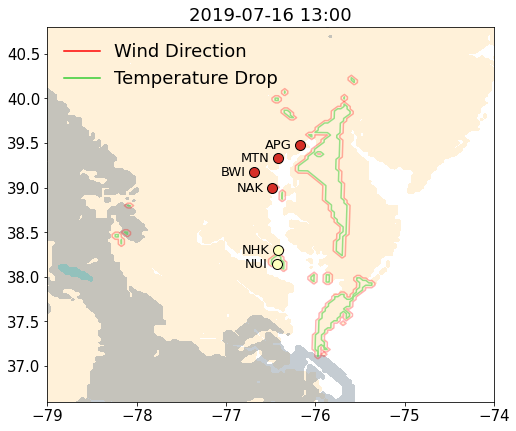

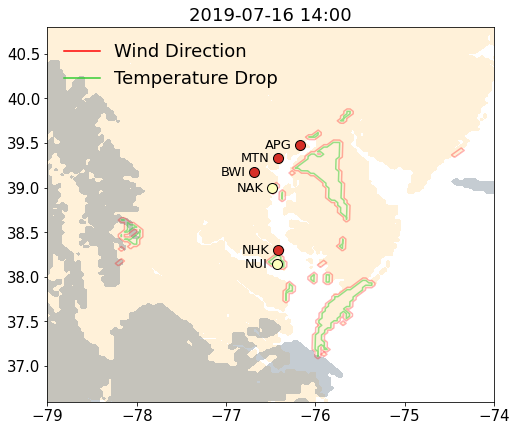

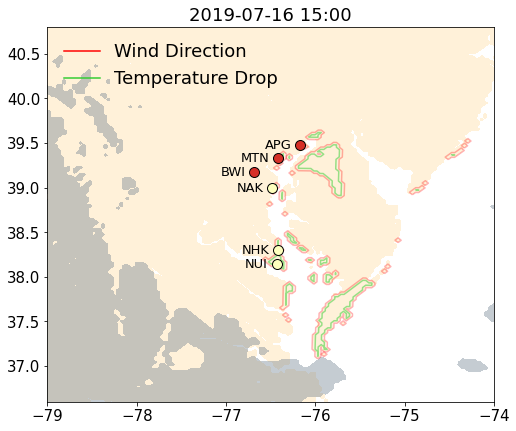

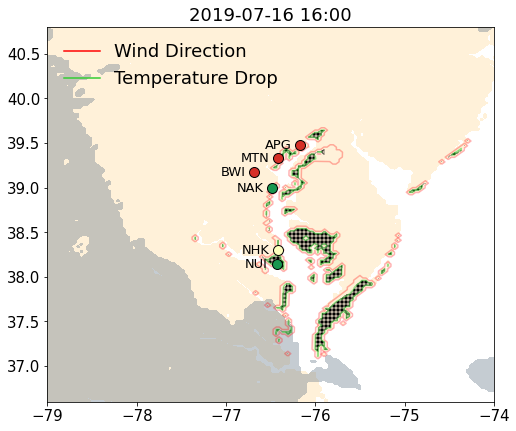

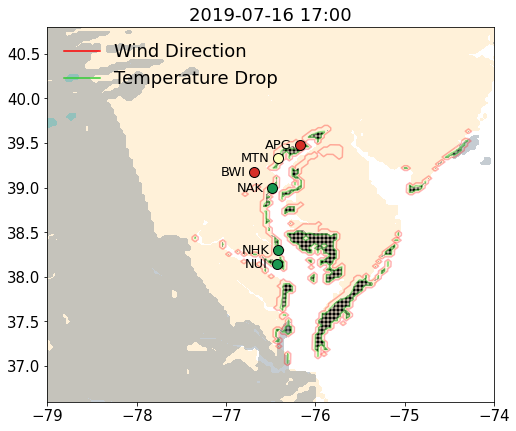

...

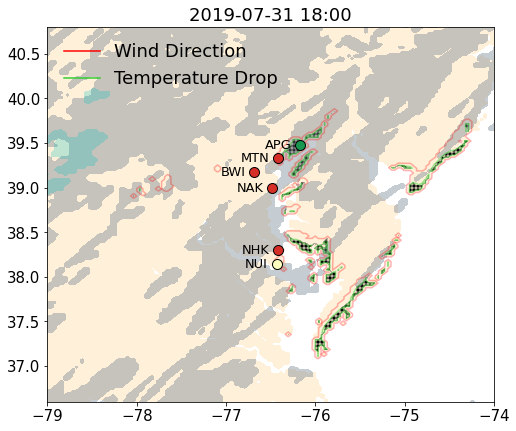

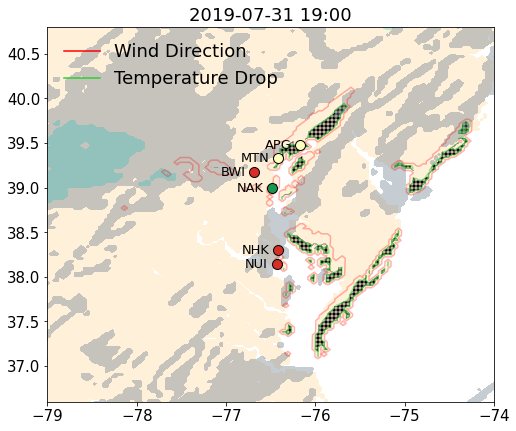

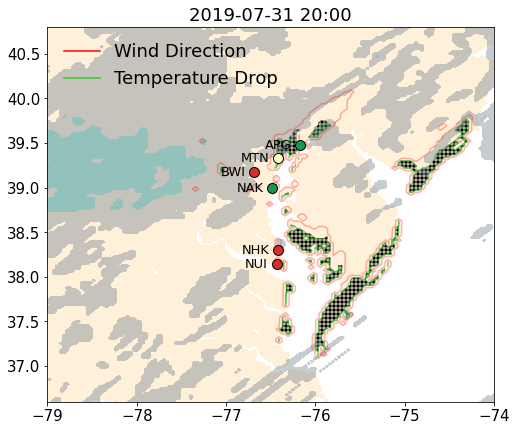

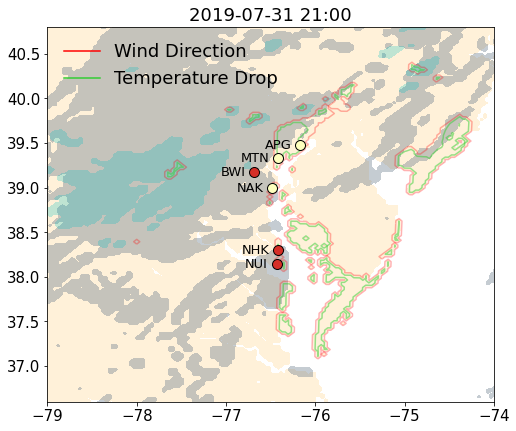

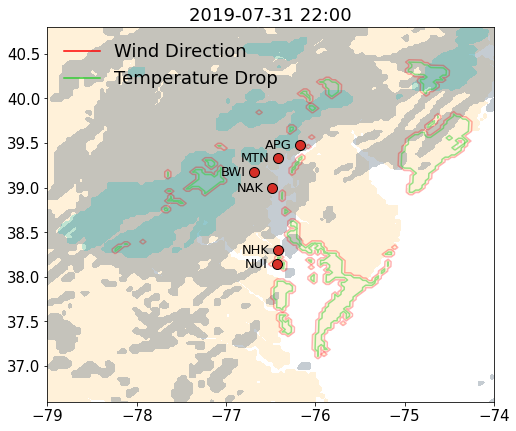

NameError: name 'wefwef' is not defined

In [435]:
for cc,case in enumerate(list(breeze_ds_dict.keys())):
    breeze_ds_f = breeze_ds_dict[case]
    for time in breeze_ds_f.datetime:
        lon = breeze_ds_f.XLONG
        lat = breeze_ds_f.XLAT
        plt.figure(figsize=(8,8))
        plt.subplot2grid((1,1),(0,0),aspect='equal')
        plt.contourf(lon,lat,breeze_ds_f.land_mask,colors='moccasin',levels=[0.5,1.0],alpha=0.5)
        plt.contour(lon,lat,breeze_ds_f.good_wdir.sel(datetime=time),levels=[1.0],colors='r',alpha=0.3)
        plt.contour(lon,lat,breeze_ds_f.dT.sel(datetime=time),levels=[0.0001],colors='limegreen',alpha=0.5)
        #plt.contour(lon,lat,breeze_ds_f.dU.sel(datetime=time),levels=[0.5],colors='b',alpha=0.3)
        plt.plot(0.0,0.0,c='r',label='Wind Direction')
        plt.plot(0.0,0.0,c='limegreen',label='Temperature Drop')
        #plt.plot(0.0,0.0,c='b',label='Wind Ramp')
        #plt.xlim(np.nanmin(lon),np.nanmax(lon))
        #plt.ylim(np.nanmin(lat),np.nanmax(lat))
        plt.ylim(36.6,40.8)
        plt.xlim(-79.0,-74.0)
        good_areas = plt.contourf(lon,lat,breeze_ds_f.breeze.sel(datetime=time),levels=[1.9,4.1],colors='k',
                                      alpha=0.25,hatches=['+++', '/'],label='Test')
        artists, labels = good_areas.legend_elements()
        #crt_plt.legend(artists, ['Good Points'], handleheight=2)
        plt.legend(frameon=False,fontsize=18,loc=2)
        plt.tick_params(labelsize=15)
        plt.title(date.strftime(pd.to_datetime(time.data),'%Y-%m-%d %H:%M'),size=18)
        for ss,stn in enumerate(near_shore_stations):
            stn_color = int(breeze_ds_f.breeze.sel(datetime=time,
                                               south_north=stn_dict[stn]['j'],
                                               west_east=stn_dict[stn]['i']).data)
            plt.scatter(stn_dict[stn]['lon'],stn_dict[stn]['lat'],
                        facecolor=breeze_cmap[stn_color],s=100,
                        edgecolor='k',zorder=4)
            plt.text(stn_dict[stn]['lon']-0.1,stn_dict[stn]['lat'],stn,size=13,ha='right',va='center')

        if check_clouds: plt.contourf(lon,lat,breeze_ds_f.is_cloudy.sel(datetime=time),levels=[0.5,1.0],colors='slategray',alpha=0.4)

        if check_rain: plt.contourf(lon,lat,breeze_ds_f.is_raining.sel(datetime=time),levels=[0.5,1.0],colors='c',alpha=0.25)


        plt.show()
    wefwef

ERAI_YSU_CHRN_OST_NOSK_4DOM


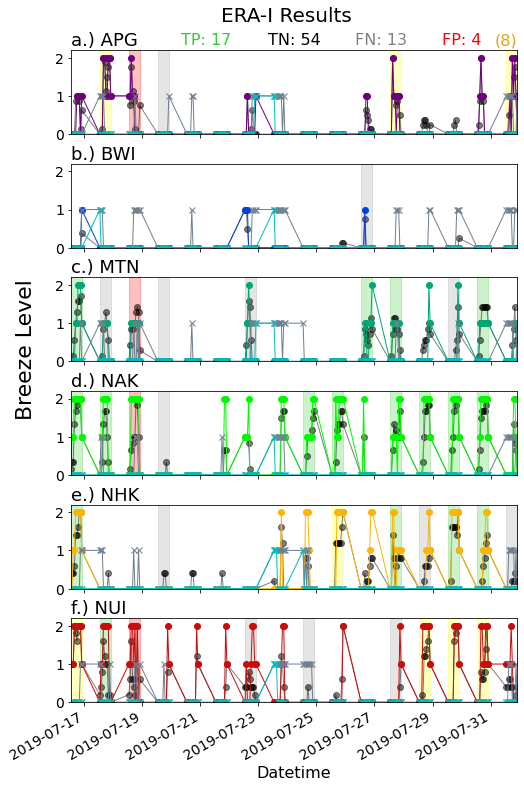

GFSR_YSU_CHRN_GFS_NOSK_3DOM


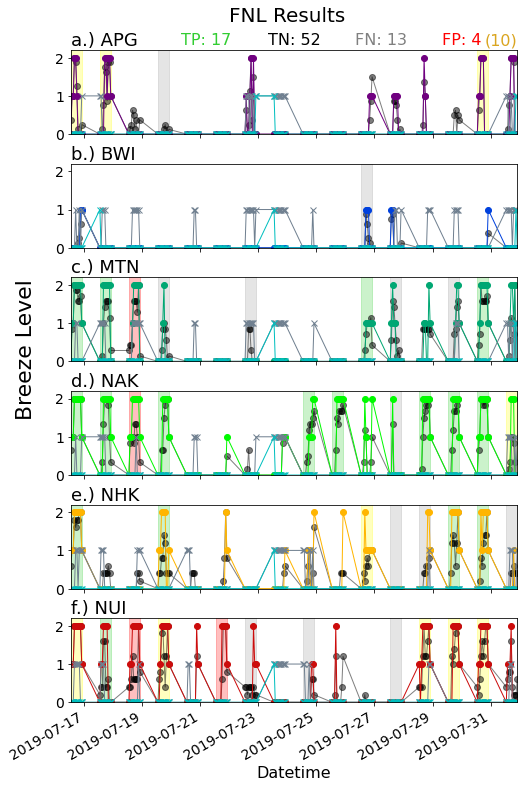

ERA5_YSU_CHRN_ER5_NOSK_3DOM


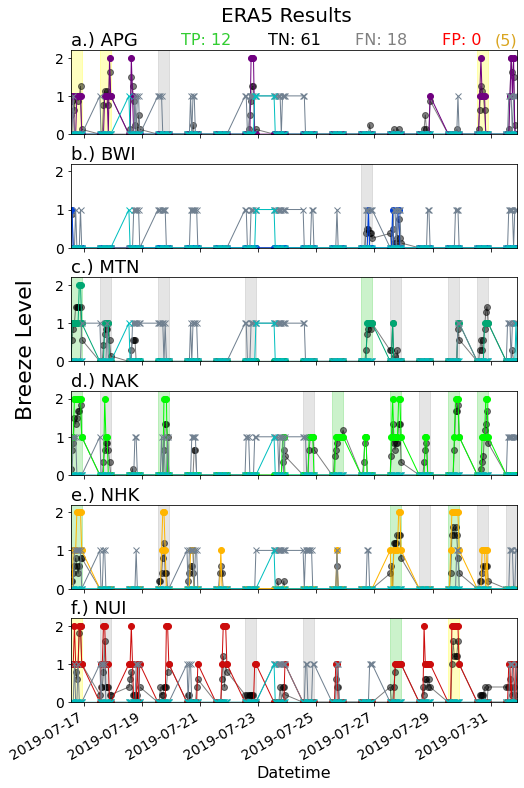

In [304]:
check_rain_and_clouds = True
use_neighbors = True

verbose = False

show_plot = True
use_all_days = True
period_start = pd.to_datetime('2019-07-16 00:00:00')
period_end   = breeze_ds_f.datetime.data[-1]

cMatrix_color_dict = {'TP':'limegreen',
                      'FP':'red',
                      'FN':'grey',
                   'close':'yellow',
                      'TN':'k'}
confusion_matrix_dict = {}
for cc,case in enumerate(list(breeze_ds_dict.keys())):
    breeze_ds_f = breeze_ds_dict[case]
    cMatrix_dict = {'TP':0,
                    'TN':0,
                    'FP':0,
                    'FN':0,
                 'close':0}
    print(case)
    fig,ax = plt.subplots(nrows=len(near_shore_stations),figsize=(8,12),sharex=True)
    fig.subplots_adjust(hspace=0.35)
    for ss,stn in enumerate(near_shore_stations):

        if case == 'HRRR':
            stn_bb_ds = breeze_ds_f.sel(ygrid_0=stn_dict[stn]['hrrrj'],xgrid_0=stn_dict[stn]['hrrri'],
                                        datetime=slice(period_start,period_end))
            stn_color = stn_bb_ds.breeze
            stn_cloud = stn_bb_ds.is_cloudy
            stn_rain  = stn_bb_ds.is_raining
            surrounding_points = breeze_ds_f.breeze.sel(ygrid_0=slice(stn_dict[stn]['hrrrj']-1,stn_dict[stn]['hrrrj']+2),
                                                        xgrid_0=slice(stn_dict[stn]['hrrri']-1,stn_dict[stn]['hrrri']+2)).copy()
            surrounding_points.sel(xgrid_0=1,ygrid_0=1).data[:] = surrounding_points.sel(
                                                                        xgrid_0=1,ygrid_0=1).data[:]*np.nan
            avg_neighbors = surrounding_points.mean(dim=['ygrid_0','xgrid_0'])
        else:
            stn_bb_ds = breeze_ds_f.sel(south_north=stn_dict[stn]['j'],west_east=stn_dict[stn]['i'],
                                        datetime=slice(period_start,period_end))
            
            stn_color = stn_bb_ds.breeze
            stn_cloud = stn_bb_ds.is_cloudy
            stn_rain  = stn_bb_ds.is_raining
            surrounding_points = breeze_ds_f.breeze.sel(south_north=slice(stn_dict[stn]['j']-1,stn_dict[stn]['j']+2),
                                                   west_east=slice(stn_dict[stn]['i']-1,stn_dict[stn]['i']+2)).copy()
            surrounding_points.sel(west_east=1,south_north=1).data[:] = surrounding_points.sel(
                                                                        west_east=1,south_north=1).data[:]*np.nan
            avg_neighbors = surrounding_points.mean(dim=['south_north','west_east'])
        if use_neighbors:
            avg_neighbors.plot(marker='o',lw=1.0,c='k',label=stn,ax=ax[ss],alpha=0.5)
        stn_color.plot(marker='o',lw=1.0,c=stn_colors[ss],label=stn,ax=ax[ss])
        if check_rain_and_clouds:
            stn_cloud.plot(marker='x',lw=1.0,c='slategray',label=stn,ax=ax[ss])
            stn_rain.plot(marker='x',lw=1.0,c='c',label=stn,ax=ax[ss])

        ax[ss].tick_params(labelsize=14)
        if ss == 3:
            ax[ss].set_ylabel('Breeze Level',size=22,y=1.5,labelpad=19.4)
        else:
            ax[ss].set_ylabel('',size=16)            
        ax[ss].set_title('')
        ax[ss].set_xlabel('',size=16)
        ax[ss].text(stn_color.datetime.data[0],2.21,'{}.) {}'.format(ascii_lowercase[ss],stn),va='bottom',size=18)#,color=stn_colors[ss])
        ax[ss].set_ylim(0,2.2)
        for dd,day in enumerate(pd.date_range(start=period_start, end=period_end)):
            
            day_str = '{0:04d}-{1:02d}-{2:02d}'.format(day.year,day.month,day.day)
            fill_color = None
            if use_all_days:
                observed_days = all_observed_dates.copy()
                
                if day_str in list(observed_days.keys()): # If model detects a breeze, what fill color will it be?
                    if stn in observed_days[day_str]: # Station is observed AND simulated
                        fill_color = cMatrix_color_dict['TP']
                    else:
                        #print(day,stn,observed_days[day_str]) # Day had BB but station didn't observe it
                        fill_color = cMatrix_color_dict['close']
                else:
                    fill_color = cMatrix_color_dict['FP'] # No observed BBs on this day
                
            else: # Only using ST currently... need to figure this out if going to use.
                observed_days = bb_observed_dates[method].copy()
            
                for mm,method in enumerate(list(bb_observed_dates.keys())[:1]):
                    if day_str in list(observed_days.keys()):
                        if stn in observed_days[day_str]:
                            fill_color = 'green'
                        else:
                            fill_color = 'yellow'
                    else:
                        fill_color = 'red'


            bb_day    = stn_color.sel(datetime=slice(day,day+pd.to_timedelta(23,'h'))).copy()
            cloud_day = stn_cloud.sel(datetime=slice(day,day+pd.to_timedelta(23,'h'))).copy()
            rain_day  = stn_rain.sel(datetime=slice(day,day+pd.to_timedelta(23,'h'))).copy()
            neighbor_day = avg_neighbors.sel(datetime=slice(day,day+pd.to_timedelta(23,'h'))).copy()
            
            bb_day_dict = {'bb_day':bb_day,
                     'neighbor_day':neighbor_day,
                        'cloud_day':cloud_day,
                         'rain_day':rain_day}
            #if (stn == 'MTN') and (dd == 10):
            #    verbose = True
            #    test_day = bb_day_dict.copy()
            #else:
            #    verbose = False
                
            bb_detected = validate_bay_breeze(bb_day_dict,
                                              use_neighbors=use_neighbors,
                                              check_rain_clouds=check_rain_and_clouds,
                                              detect_option=3,
                                              verbose=verbose)
            
            #if (stn == 'MTN') and (dd == 11): wefwef
            if bb_detected:
                ax[ss].fill_betweenx([0,4],bb_day.datetime.data[0],bb_day.datetime.data[-1],
                                     color=fill_color,alpha=0.25)
                if fill_color == cMatrix_color_dict['TP']:
                    cMatrix_dict['TP'] += 1
                elif fill_color == cMatrix_color_dict['FP']: # or fill_color == cMatrix_color_dict['close']:
                    cMatrix_dict['FP'] += 1
                elif fill_color == cMatrix_color_dict['close']:
                    cMatrix_dict['close'] += 1

            else:
                if fill_color == cMatrix_color_dict['TP']:
                    fill_color = cMatrix_color_dict['FN']
                    cMatrix_dict['FN'] += 1
                    ax[ss].fill_betweenx([0,4],bb_day.datetime.data[0],bb_day.datetime.data[-1],
                                         color=fill_color,alpha=0.2)
                else:
                    cMatrix_dict['TN'] += 1
            #print(day,stn,max_count,max_neighbor_count)
    
    ax[0].set_xlim(stn_color.datetime.data[0],stn_color.datetime.data[-1])
    #ax[0].set_xlim('2019-07-19 00:00:00','2019-07-21 00:00:00')
    ax[-1].set_xlabel('Datetime',size=16)
    
    cMatrix_list = ['TP','TN','FN','FP']
    for cm,cMatrix in enumerate(cMatrix_list):
        str_x = pd.to_datetime('2019-07-20 08:00:00') + pd.to_timedelta(cm*3,'d')
        cMatrix_str = '{}: {}'.format(cMatrix,cMatrix_dict[cMatrix])
        ax[0].text(str_x,2.25,cMatrix_str,ha='left',va='bottom',size=16,
                   color=cMatrix_color_dict[cMatrix])
        if cMatrix == 'FP':
            str_x = stn_color.datetime.data[-1]
            ax[0].text(str_x,2.25,'({})'.format(cMatrix_dict['close']),ha='right',va='bottom',size=16,
                       color='goldenrod')#color=cMatrix_color_dict['close'])
    if 'ERAI' in case: 
        case_str = 'ERA-I'
    elif 'GFS' in case:
        case_str = 'FNL'
    elif 'ERA5' in case:
        case_str = 'ERA5'
    elif 'HRRR' in case:
        case_str = 'HRRR'
    plt.suptitle('{} Results'.format(case_str),y=0.93,size=20)
    #plt.savefig('{}{}Results.pdf'.format(save_dir,case_str.replace('-','')), bbox_inches = 'tight',pad_inches = 0.1)
    plt.show()
    confusion_matrix_dict[case] = cMatrix_dict
    

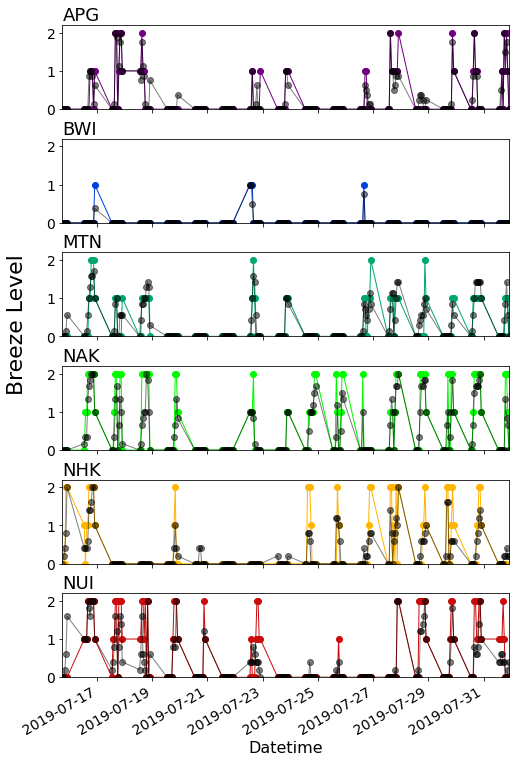

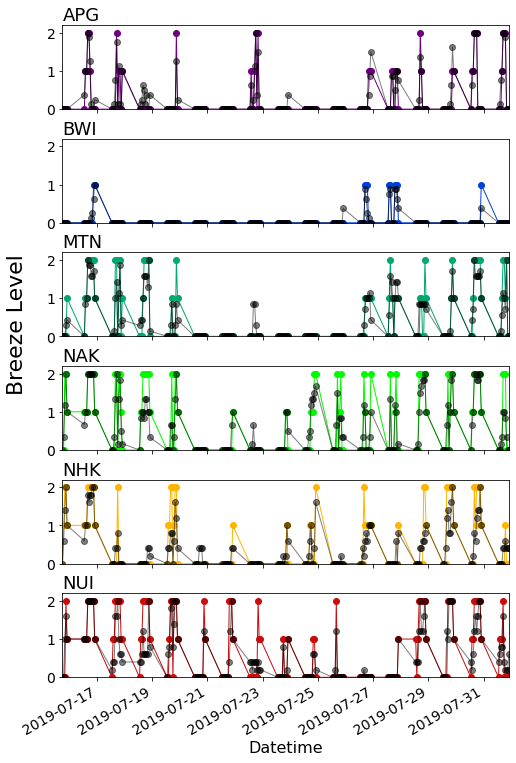

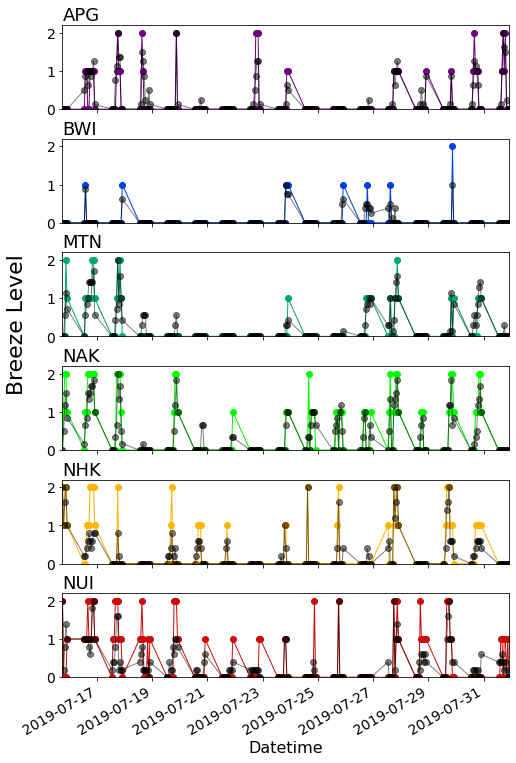

In [18]:
for cc,case in enumerate(list(breeze_ds_dict.keys())):
    breeze_ds_f = breeze_ds_dict[case]
    fig,ax = plt.subplots(nrows=len(near_shore_stations),figsize=(8,12),sharex=True)
    fig.subplots_adjust(hspace=0.35)
    for ss,stn in enumerate(near_shore_stations):
        stn_color = breeze_ds_f.breeze.sel(south_north=stn_dict[stn]['j'],
                                           west_east=stn_dict[stn]['i'])
        surrounding_points = breeze_ds_f.breeze.sel(south_north=slice(stn_dict[stn]['j']-1,stn_dict[stn]['j']+2),
                                               west_east=slice(stn_dict[stn]['i']-1,stn_dict[stn]['i']+2)).copy()
        surrounding_points.sel(west_east=1,south_north=1).data[:] = surrounding_points.sel(
                                                                    west_east=1,south_north=1).data[:]*np.nan
        avg_surrounding_points = surrounding_points.mean(dim=['south_north','west_east'])
        
        stn_color.plot(marker='o',lw=1.0,c=stn_colors[ss],label=stn,ax=ax[ss])
        avg_surrounding_points.plot(marker='o',lw=1.0,c='k',label=stn,ax=ax[ss],alpha=0.5)
        ax[ss].tick_params(labelsize=14)
        if ss == 3:
            ax[ss].set_ylabel('Breeze Level',size=22,y=1.5,labelpad=19.4)
        else:
            ax[ss].set_ylabel('',size=16)            
        ax[ss].set_title('')
        ax[ss].set_xlabel('',size=16)
        ax[ss].text(stn_color.datetime.data[0],2.21,stn,va='bottom',size=18)#,color=stn_colors[ss])
        ax[ss].set_ylim(0,2.2)
    ax[0].set_xlim(stn_color.datetime.data[0],stn_color.datetime.data[-1])
    #ax[0].set_xlim('2019-07-19 00:00:00','2019-07-21 00:00:00')
    ax[-1].set_xlabel('Datetime',size=16)
    plt.show()
    

# Radar

In [1]:
import pyart
import warnings
warnings.filterwarnings('ignore')

import cartopy.crs as ccrs

from matplotlib.axes import Axes
from cartopy.mpl.geoaxes import GeoAxes
GeoAxes._pcolormesh_patched = Axes.pcolormesh


## You are using the Python ARM Radar Toolkit (Py-ART), an open source
## library for working with weather radar data. Py-ART is partly
## supported by the U.S. Department of Energy as part of the Atmospheric
## Radiation Measurement (ARM) Climate Research Facility, an Office of
## Science user facility.
##
## If you use this software to prepare a publication, please cite:
##
##     JJ Helmus and SM Collis, JORS 2016, doi: 10.5334/jors.119



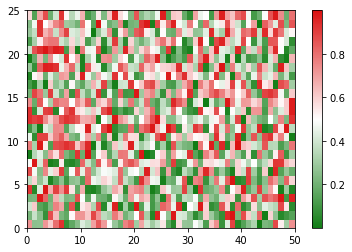

In [29]:
def make_cmap(colors, position=None, bit=False):
    '''
    make_cmap takes a list of tuples which contain RGB values. The RGB
    values may either be in 8-bit [0 to 255] (in which bit must be set to
    True when called) or arithmetic [0 to 1] (default). make_cmap returns
    a cmap with equally spaced colors.
    Arrange your tuples so that the first color is the lowest value for the
    colorbar and the last is the highest.
    position contains values from 0 to 1 to dictate the location of each color.
    '''
    import matplotlib as mpl
    import numpy as np
    bit_rgb = np.linspace(0,1,256)
    if position == None:
        position = np.linspace(0,1,len(colors))
    else:
        if len(position) != len(colors):
            sys.exit("position length must be the same as colors")
        elif position[0] != 0 or position[-1] != 1:
            sys.exit("position must start with 0 and end with 1")
    if bit:
        for i in range(len(colors)):
            colors[i] = (bit_rgb[colors[i][0]],
                         bit_rgb[colors[i][1]],
                         bit_rgb[colors[i][2]])
    cdict = {'red':[], 'green':[], 'blue':[]}
    for pos, color in zip(position, colors):
        cdict['red'].append((pos, color[0], color[0]))
        cdict['green'].append((pos, color[1], color[1]))
        cdict['blue'].append((pos, color[2], color[2]))

    cmap = mpl.colors.LinearSegmentedColormap('my_colormap',cdict,256)
    return cmap

### Create a list of RGB tuples
colors = [(17, 125, 21), (255,255,255), (219, 18, 18)] # This example uses the 8-bit RGB
### Call the function make_cmap which returns your colormap
red_green_cmap = make_cmap(colors, bit=True)

plt.pcolor(np.random.rand(25,50), cmap=red_green_cmap)
plt.colorbar()

In [38]:
rad_dir = '/Users/hawbecke/Research/Chesapeake/Data/Obs/Radar/'
stn_id = 'KLWX' # BWI
stn_id = 'KAKQ' # Delaware
rad_files = sorted(glob.glob('{}{}_SDUS51*'.format(rad_dir,stn_id))) 

In [39]:
var_names = []
var_dict = {}
for rr,rad_file in enumerate(rad_files):
    var_name = rad_file.split('_')[2]
    if (var_name not in var_names) and var_name != 'NCRDOX':
        print(var_name)
        var_names.append(var_name)
        radar = pyart.io.read_nexrad_level3(rad_file)
        var_dict[var_name] = {}
        var_dict[var_name]['variable'] = list(radar.fields.keys())[0]
        var_dict[var_name]['angle'] = np.round(float(radar.fixed_angle['data']),decimals=1)
        var_dict[var_name]['range'] = max(radar.range['data'])


N0QDOX
N0RDOX
N0UDOX
N0VDOX
NAQDOX
NAUDOX


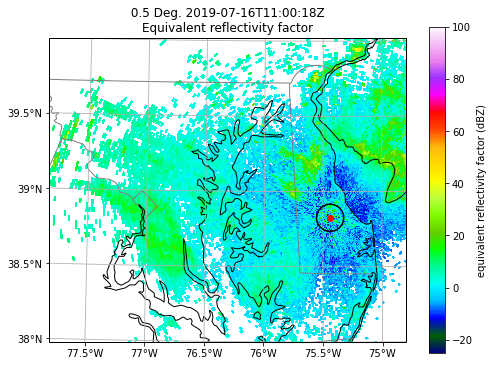

<Figure size 432x288 with 0 Axes>

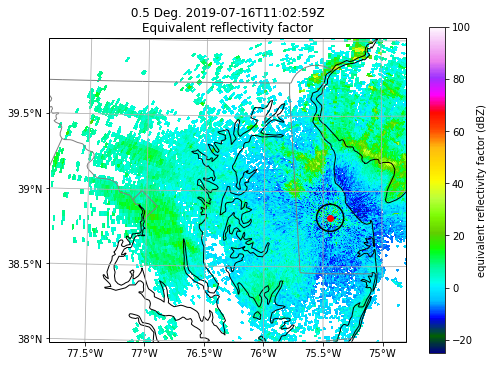

<Figure size 432x288 with 0 Axes>

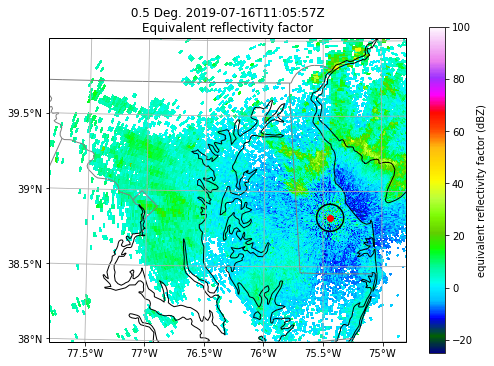

<Figure size 432x288 with 0 Axes>

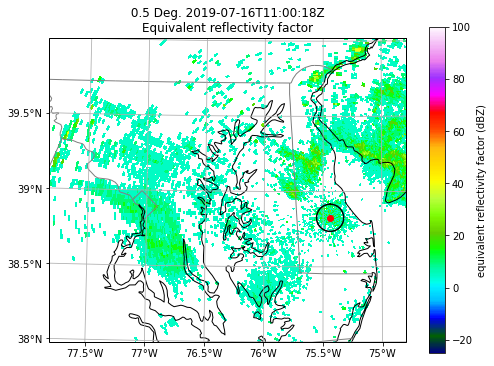

<Figure size 432x288 with 0 Axes>

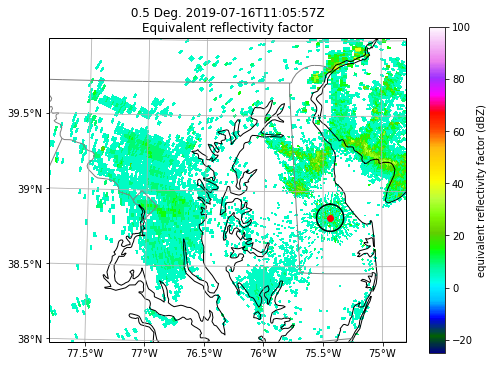

<Figure size 432x288 with 0 Axes>

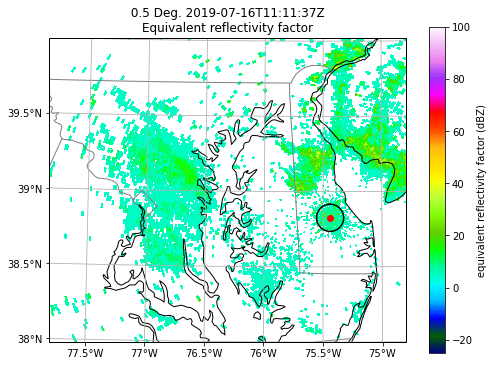

<Figure size 432x288 with 0 Axes>

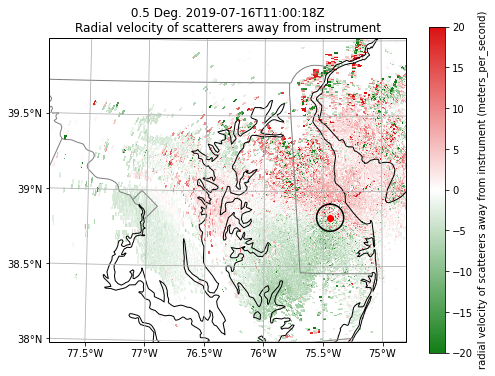

<Figure size 432x288 with 0 Axes>

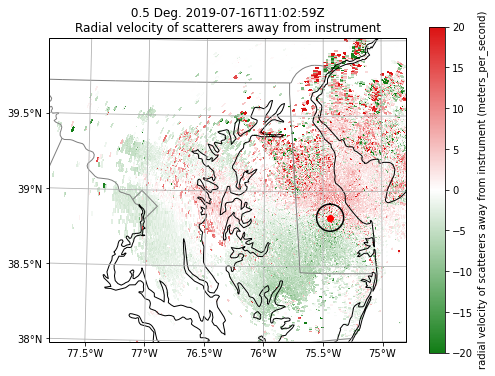

<Figure size 432x288 with 0 Axes>

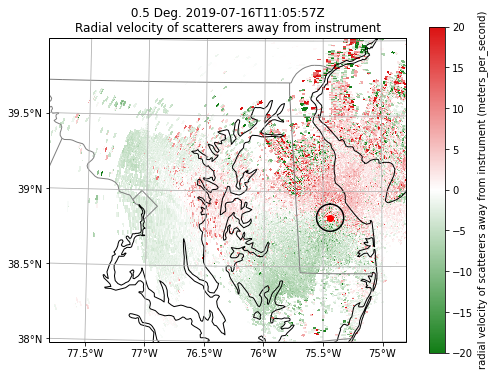

<Figure size 432x288 with 0 Axes>

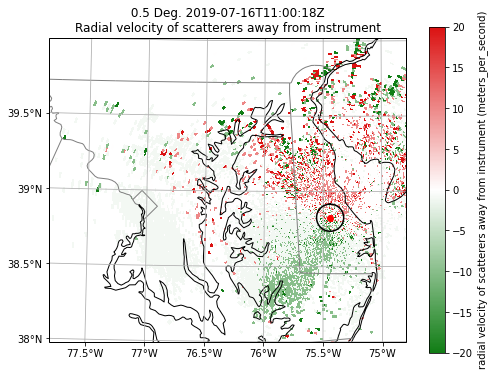

<Figure size 432x288 with 0 Axes>

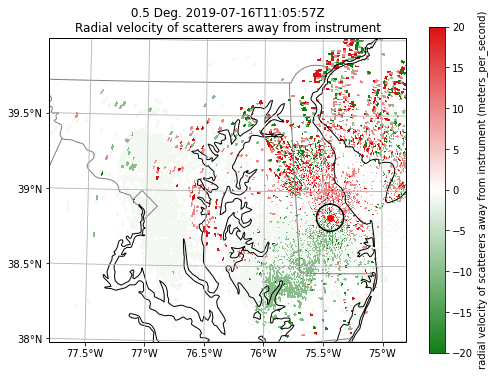

<Figure size 432x288 with 0 Axes>

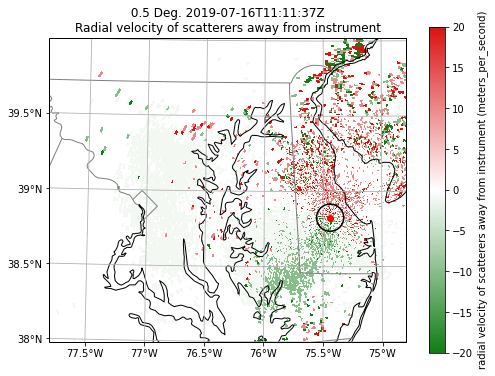

<Figure size 432x288 with 0 Axes>

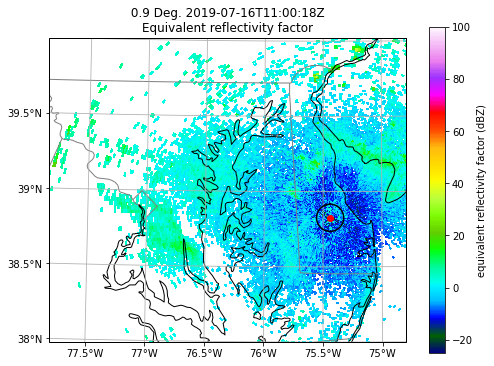

<Figure size 432x288 with 0 Axes>

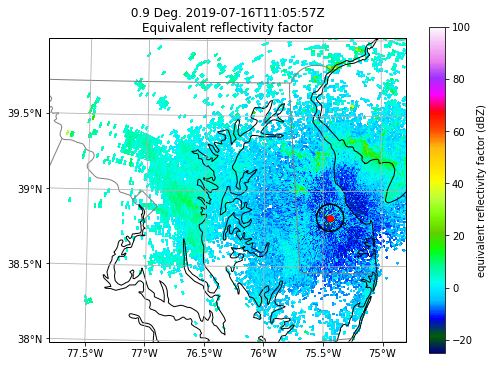

<Figure size 432x288 with 0 Axes>

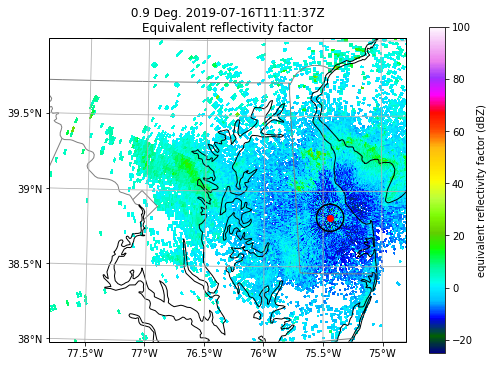

<Figure size 432x288 with 0 Axes>

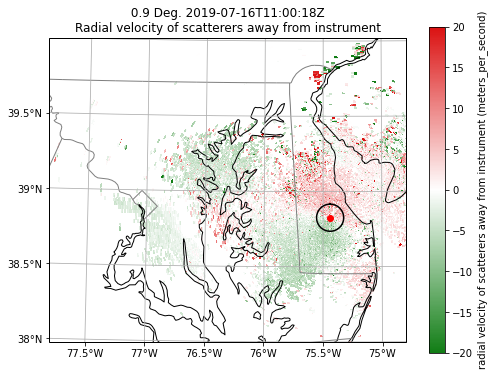

<Figure size 432x288 with 0 Axes>

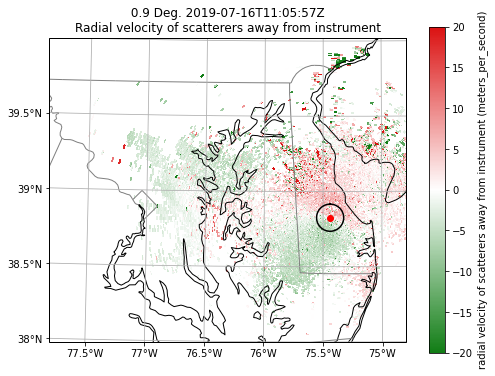

<Figure size 432x288 with 0 Axes>

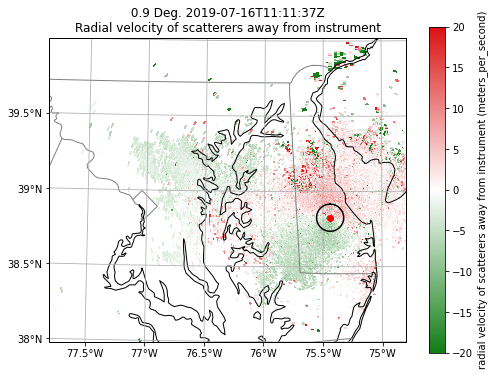

<Figure size 432x288 with 0 Axes>

In [45]:
save_fig = False
for vv,varn in enumerate(list(var_dict.keys())):
    var_files = sorted(glob.glob('{}{}_SDUS51_{}*'.format(rad_dir,stn_id,varn))) 
    new_ncdf = '{}{}_ang{}_rng{}.nc'.format(rad_dir,
                                      var_dict[varn]['variable'],
                                      str(var_dict[varn]['angle']).replace('.','p'),
                                      str(var_dict[varn]['range']).replace('.','p'))
    
    
    for rr,var_file in enumerate(var_files[:3]):
        day = pd.to_datetime(var_file.split('/')[-1].split('_')[-1])

        if day.day == 16:
            # Read in the file, create a RadarMapDisplay object
            radar = pyart.io.read_nexrad_level3(var_file)
            display = pyart.graph.RadarMapDisplay(radar)

            # Setting projection and ploting the second tilt
            projection = ccrs.LambertConformal(central_latitude=radar.latitude['data'][0],
                                               central_longitude=radar.longitude['data'][0])

            fig = plt.figure(figsize=(8,6))
            if var_dict[varn]['variable'] == 'reflectivity':
                plt_cmap = plt.cm.gist_ncar
                plt_min,plt_max = -25,100
            else:
                plt_cmap = red_green_cmap
                plt_min,plt_max = -20,20

            display.plot_ppi_map(var_dict[varn]['variable'], sweep=0, vmin=plt_min, vmax=plt_max,
                                 min_lon=-77.8, max_lon=-74.8, min_lat=38.0, max_lat=40.0,
                                 lon_lines=np.arange(-79, -66, .5), 
                                 resolution='10m',
                                 lat_lines=np.arange(33, 44, .5), 
                                 projection=projection,
                                 fig=fig, lat_0=radar.latitude['data'][0],
                                 lon_0=radar.longitude['data'][0],cmap=plt_cmap)

            # Plot range rings at 10, 20, 30, 40km
            display.plot_range_ring(10., line_style='k-')
            #display.plot_range_ring(20., line_style='k--')
            #display.plot_range_ring(30., line_style='k-')
            #display.plot_range_ring(40., line_style='k--')

            # Plot cross hairs
            #display.plot_line_xy(np.array([-40000.0, 40000.0]), np.array([0.0, 0.0]),
            #                     line_style='k-')
            #display.plot_line_xy(np.array([0.0, 0.0]), np.array([-20000.0, 200000.0]),
            #                     line_style='k-')

            # Indicate the radar location with a point
            display.plot_point(radar.longitude['data'][0], radar.latitude['data'][0])
            fig_str = '{0}img/{5}{1}_ang{2}_rng{3}_{4:04d}.png'.format(rad_dir,
                                                  var_dict[varn]['variable'],
                                                  str(var_dict[varn]['angle']).replace('.','p'),
                                                  str(var_dict[varn]['range']).replace('.','p'),
                                                  rr,
                                                  stn_id)
            if save_fig:
                plt.savefig(fig_str)
            else:
                plt.show()
            plt.clf()




In [204]:
for vv,varn in enumerate(list(var_dict.keys())):
    var_files = sorted(glob.glob('{}{}_SDUS51_{}*'.format(rad_dir,stn_id,varn))) 
                
    new_ncdf = '{}{}_ang{}_rng{}.nc'.format(rad_dir,
                                      var_dict[varn]['variable'],
                                      str(var_dict[varn]['angle']).replace('.','p'),
                                      str(var_dict[varn]['range']).replace('.','p'))
    
    
    for rr,var_file in enumerate(var_files[:3]):
        radar = pyart.io.read_nexrad_level3(var_file)
        dat = radar.fields[var_dict[varn]['variable']]['data'][:,:,np.newaxis]
        dat.fill_value = -999.
        dat = np.asarray(dat.filled())
        time = pd.to_datetime(radar.time['units'].split(' ')[-1].replace('Z',''))
        azi = radar.azimuth['data']
        rng = radar.range['data']
        
        ds = xr.Dataset(
                        {var_dict[varn]['variable']: (['azimuth','range','datetime'], dat)},
                        coords={
                            'azimuth': (['azimuth'], azi),
                            'range': (['range'], rng),
                            'datetime': (['datetime'], [time])
                        })
        
        if rr == 0:
            ds_f = ds.copy()
        else:
            ds_f = ds_f.combine_first(ds)
    ds_f.attrs['angle'] = var_dict[varn]['angle'] 
    ds_f.attrs['range'] = var_dict[varn]['range']
    ds_f.to_netcdf(new_ncdf)



ERAI_YSU_CHRN_OST_NOSK_4DOM


/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:82: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:82: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:82: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:82: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:82: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:82: UserWarning: FixedFormatter should only be used together with FixedLocato

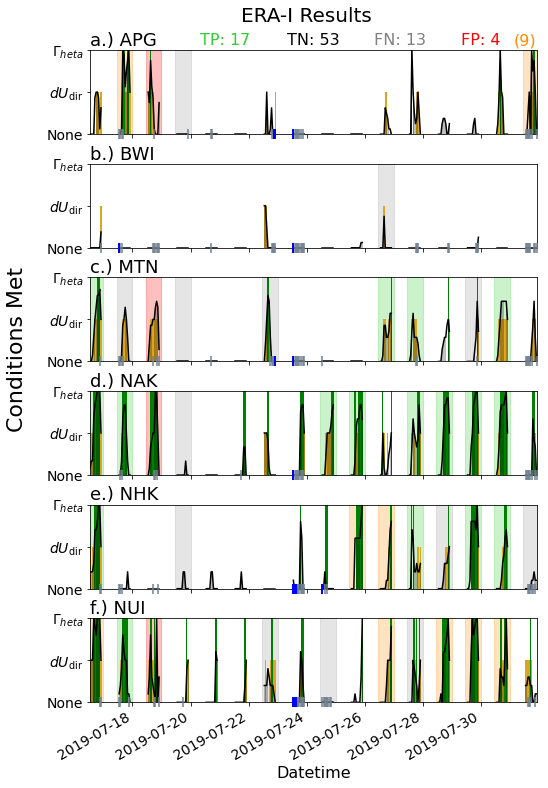

GFSR_YSU_CHRN_GFS_NOSK_3DOM


/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:82: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:82: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:82: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:82: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:82: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:82: UserWarning: FixedFormatter should only be used together with FixedLocato

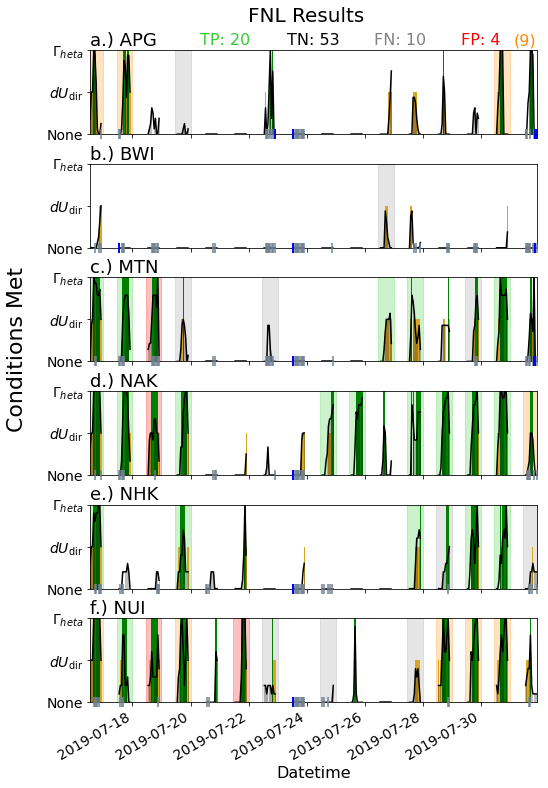

ERA5_YSU_CHRN_ER5_NOSK_3DOM


/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:82: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:82: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:82: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:82: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:82: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:82: UserWarning: FixedFormatter should only be used together with FixedLocato

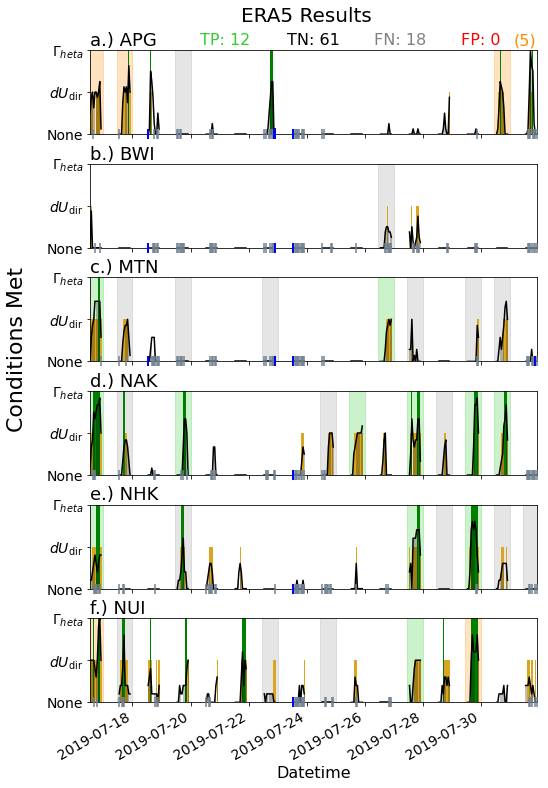

HRRR


/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:82: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:82: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:82: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:82: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:82: UserWarning: FixedFormatter should only be used together with FixedLocator
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:82: UserWarning: FixedFormatter should only be used together with FixedLocato

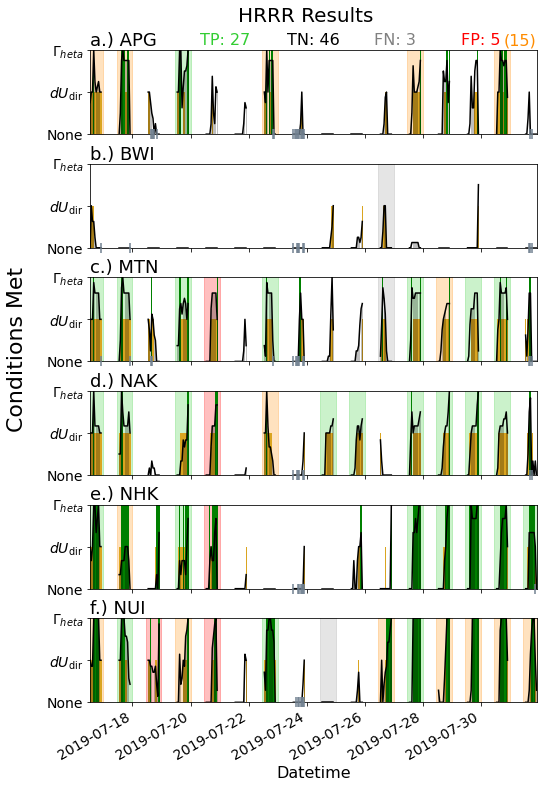

In [526]:
check_rain_and_clouds = True
use_neighbors = True

verbose = False

show_plot = True
use_all_days = True
period_start = pd.to_datetime('2019-07-16 00:00:00')
period_end   = breeze_ds_f.datetime.data[-1]

cMatrix_color_dict = {'TP':'limegreen',
                      'FP':'red',
                      'FN':'grey',
                   'close':'darkorange',
                      'TN':'k'}
confusion_matrix_dict = {}
for cc,case in enumerate(list(breeze_ds_dict.keys())):
    breeze_ds_f = breeze_ds_dict[case]
    cMatrix_dict = {'TP':0,
                    'TN':0,
                    'FP':0,
                    'FN':0,
                 'close':0}
    print(case)
    fig,ax = plt.subplots(nrows=len(near_shore_stations),figsize=(8,12),sharex=True)
    fig.subplots_adjust(hspace=0.35)
    for ss,stn in enumerate(near_shore_stations):

        if case == 'HRRR':
            stn_bb_ds = breeze_ds_f.sel(ygrid_0=stn_dict[stn]['hrrrj'],xgrid_0=stn_dict[stn]['hrrri'],
                                        datetime=slice(period_start,period_end))
            stn_color = stn_bb_ds.breeze
            stn_cloud = stn_bb_ds.is_cloudy
            stn_rain  = stn_bb_ds.is_raining
            surrounding_points = breeze_ds_f.breeze.sel(ygrid_0=slice(stn_dict[stn]['hrrrj']-1,stn_dict[stn]['hrrrj']+2),
                                                        xgrid_0=slice(stn_dict[stn]['hrrri']-1,stn_dict[stn]['hrrri']+2)).copy()
            surrounding_points.sel(xgrid_0=1,ygrid_0=1).data[:] = surrounding_points.sel(
                                                                        xgrid_0=1,ygrid_0=1).data[:]*np.nan
            avg_neighbors = surrounding_points.mean(dim=['ygrid_0','xgrid_0'])
        else:
            stn_bb_ds = breeze_ds_f.sel(south_north=stn_dict[stn]['j'],west_east=stn_dict[stn]['i'],
                                        datetime=slice(period_start,period_end))
            
            stn_color = stn_bb_ds.breeze
            stn_cloud = stn_bb_ds.is_cloudy
            stn_rain  = stn_bb_ds.is_raining
            surrounding_points = breeze_ds_f.breeze.sel(south_north=slice(stn_dict[stn]['j']-1,stn_dict[stn]['j']+2),
                                                   west_east=slice(stn_dict[stn]['i']-1,stn_dict[stn]['i']+2)).copy()
            surrounding_points.sel(west_east=1,south_north=1).data[:] = surrounding_points.sel(
                                                                        west_east=1,south_north=1).data[:]*np.nan
            avg_neighbors = surrounding_points.mean(dim=['south_north','west_east'])
        if use_neighbors:
            #avg_neighbors.plot(marker='o',lw=1.0,c='k',label=stn,ax=ax[ss],alpha=0.5)
            ax[ss].bar(avg_neighbors.datetime.data,avg_neighbors.data,
                       width=pd.to_timedelta(45,'min'),color='k',alpha=0.25,zorder=10)            
        for pts in [1,2]:
            ax[ss].bar(stn_color.datetime.data[stn_color==pts],stn_color.data[stn_color==pts],
                       width=pd.to_timedelta(60,'min'),color=breeze_cmap[pts])
        
#        stn_color.plot(lw=2.0,c='k',ax=ax[ss])
#        zro_pts = stn_color.where(stn_color==0.0)
#        one_pts = stn_color.where(stn_color==1.0)
#        two_pts = stn_color.where(stn_color==2.0)
#        zro_pts.plot(marker='o',lw=0.0,c=breeze_cmap[0],ax=ax[ss],markersize=10.0)
#        one_pts.plot(marker='o',lw=0.0,c=breeze_cmap[1],ax=ax[ss],markersize=10.0)
#        two_pts.plot(marker='o',lw=0.0,c=breeze_cmap[2],ax=ax[ss],markersize=10.0)
        #stn_color.plot(marker='o',lw=0.0,c=breeze_cmap[2],ax=ax[ss])
        if check_rain_and_clouds:
            cld_plot = stn_cloud.where(stn_cloud==1.0)
            pcp_plot = stn_rain.where(stn_rain==1.0)
            (cld_plot-1).plot(marker='|',markersize=10,lw=0.0,c='slategray',label=stn,ax=ax[ss],clip_on=False,zorder=15,mew=1.5)
            (pcp_plot-1).plot(marker='|',markersize=10,lw=0.0,c='blue',label=stn,ax=ax[ss],clip_on=False,zorder=16,mew=2.0)

        ax[ss].tick_params(labelsize=14)
        if ss == 3:
            ax[ss].set_ylabel('Conditions Met',size=22,y=1.5,labelpad=19.4)
        else:
            ax[ss].set_ylabel('',size=16)            
        ax[ss].set_title('')
        ax[ss].set_xlabel('',size=16)
        ax[ss].text(stn_color.datetime.data[0],2.01,'{}.) {}'.format(ascii_lowercase[ss],stn),va='bottom',size=18)#,color=stn_colors[ss])
        ax[ss].set_yticklabels(['None','$dU_{\mathrm{dir}}$','$\Gamma_{\theta}$'])
        ax[ss].set_ylim(0,2.0)
        plt.xticks(pd.date_range(start=period_start, end=period_end+pd.to_timedelta(2,'d'), 
                                 freq=pd.to_timedelta(2,'d')),
                   rotation=30,ha='right')
        for dd,day in enumerate(pd.date_range(start=period_start, end=period_end)):
            
            day_str = '{0:04d}-{1:02d}-{2:02d}'.format(day.year,day.month,day.day)
            fill_color = None
            if use_all_days:
                observed_days = all_observed_dates.copy()
                
                if day_str in list(observed_days.keys()): # If model detects a breeze, what fill color will it be?
                    if stn in observed_days[day_str]: # Station is observed AND simulated
                        fill_color = cMatrix_color_dict['TP']
                    else:
                        #print(day,stn,observed_days[day_str]) # Day had BB but station didn't observe it
                        fill_color = cMatrix_color_dict['close']
                else:
                    fill_color = cMatrix_color_dict['FP'] # No observed BBs on this day
                
            else: # Only using ST currently... need to figure this out if going to use.
                observed_days = bb_observed_dates[method].copy()
            
                for mm,method in enumerate(list(bb_observed_dates.keys())[:1]):
                    if day_str in list(observed_days.keys()):
                        if stn in observed_days[day_str]:
                            fill_color = 'green'
                        else:
                            fill_color = 'yellow'
                    else:
                        fill_color = 'red'


            bb_day    = stn_color.sel(datetime=slice(day,day+pd.to_timedelta(23,'h'))).copy()
            cloud_day = stn_cloud.sel(datetime=slice(day,day+pd.to_timedelta(23,'h'))).copy()
            rain_day  = stn_rain.sel(datetime=slice(day,day+pd.to_timedelta(23,'h'))).copy()
            neighbor_day = avg_neighbors.sel(datetime=slice(day,day+pd.to_timedelta(23,'h'))).copy()
            
            if use_neighbors:
                #avg_neighbors.plot(marker='o',lw=1.0,c='k',label=stn,ax=ax[ss],alpha=0.5)
                neighbor_plt = neighbor_day.sel(datetime=slice(day+pd.to_timedelta(13,'h'),day+pd.to_timedelta(22,'h')))
                ax[ss].plot(neighbor_plt.datetime.data,neighbor_plt.data,
                            color='k',alpha=1.0,zorder=10)             
            
            bb_day_dict = {'bb_day':bb_day,
                     'neighbor_day':neighbor_day,
                        'cloud_day':cloud_day,
                         'rain_day':rain_day}
                
            bb_detected = validate_bay_breeze(bb_day_dict,
                                              use_neighbors=use_neighbors,
                                              check_rain_clouds=check_rain_and_clouds,
                                              detect_option=3,
                                              verbose=verbose)
            

            if bb_detected:
                ax[ss].fill_betweenx([0,4],bb_day.datetime.data[0]-pd.to_timedelta(2,'h'),
                                         bb_day.datetime.data[-1]+pd.to_timedelta(2,'h'),
                                     color=fill_color,alpha=0.25)
                if fill_color == cMatrix_color_dict['TP']:
                    cMatrix_dict['TP'] += 1
                elif fill_color == cMatrix_color_dict['FP']: # or fill_color == cMatrix_color_dict['close']:
                    cMatrix_dict['FP'] += 1
                elif fill_color == cMatrix_color_dict['close']:
                    cMatrix_dict['close'] += 1

            else:
                if fill_color == cMatrix_color_dict['TP']:
                    fill_color = cMatrix_color_dict['FN']
                    cMatrix_dict['FN'] += 1
                    ax[ss].fill_betweenx([0,4],bb_day.datetime.data[0]-pd.to_timedelta(2,'h'),
                                         bb_day.datetime.data[-1]+pd.to_timedelta(2,'h'),
                                         color=fill_color,alpha=0.2)
                else:
                    cMatrix_dict['TN'] += 1
        
    ax[0].set_xlim(stn_color.datetime.data[0],stn_color.datetime.data[-1])
    ax[-1].set_xlabel('Datetime',size=16)
    
    cMatrix_list = ['TP','TN','FN','FP']
    for cm,cMatrix in enumerate(cMatrix_list):
        str_x = pd.to_datetime('2019-07-20 08:00:00') + pd.to_timedelta(cm*3,'d')
        cMatrix_str = '{}: {}'.format(cMatrix,cMatrix_dict[cMatrix])
        ax[0].text(str_x,2.05,cMatrix_str,ha='left',va='bottom',size=16,
                   color=cMatrix_color_dict[cMatrix])
        if cMatrix == 'FP':
            str_x = stn_color.datetime.data[-1]
            ax[0].text(str_x,2.05,'({})'.format(cMatrix_dict['close']),ha='right',va='bottom',size=16,
                       color=cMatrix_color_dict['close'])
    if 'ERAI' in case: 
        case_str = 'ERA-I'
    elif 'GFS' in case:
        case_str = 'FNL'
    elif 'ERA5' in case:d
        case_str = 'ERA5'
    elif 'HRRR' in case:
        case_str = 'HRRR'
    plt.suptitle('{} Results'.format(case_str),y=0.93,size=20)
    
    plt.savefig('{}{}Results2.pdf'.format(save_dir,case_str.replace('-','')), bbox_inches = 'tight',pad_inches = 0.1)
    plt.show()
    confusion_matrix_dict[case] = cMatrix_dict
    
    

ERAI_YSU_CHRN_OST_NOSK_4DOM
GFSR_YSU_CHRN_GFS_NOSK_3DOM
ERA5_YSU_CHRN_ER5_NOSK_3DOM


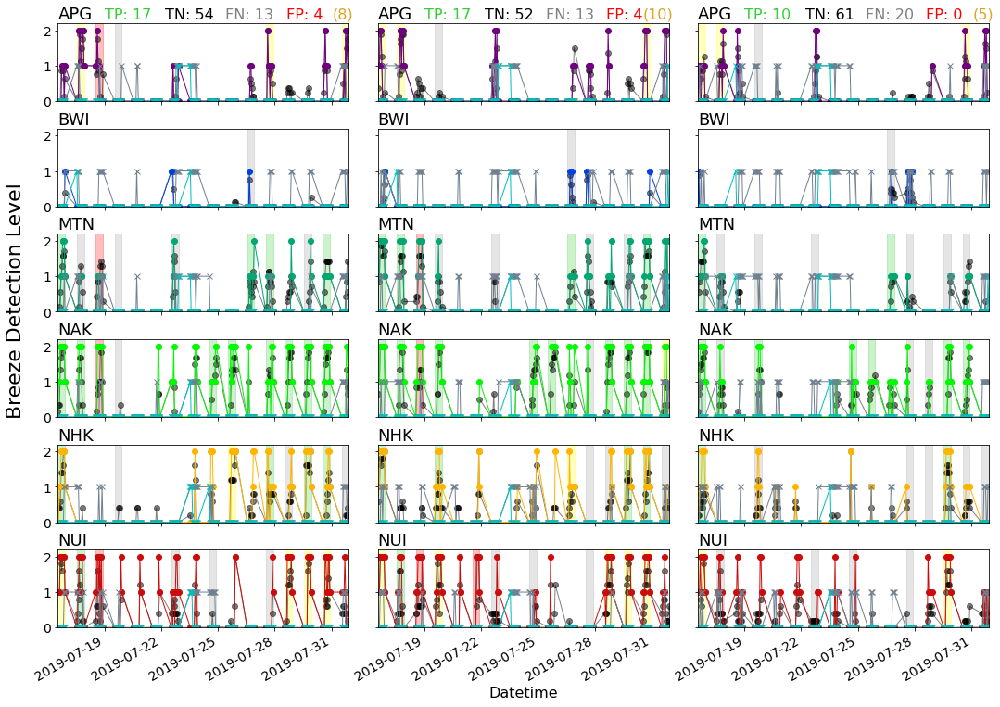

In [63]:
fig,ax = plt.subplots(nrows=len(near_shore_stations),ncols=3,figsize=(18,12),sharex=True,sharey=True)
fig.subplots_adjust(hspace=0.35,wspace=0.1)
check_rain_and_clouds = True
use_neighbors = True

show_plot = True
use_all_days = True
period_start = pd.to_datetime('2019-07-16 00:00:00')
period_end   = breeze_ds_f.datetime.data[-1]

cMatrix_color_dict = {'TP':'limegreen',
                      'FP':'red',
                      'FN':'grey',
                   'close':'yellow',
                      'TN':'k'}

for cc,case in enumerate(list(breeze_ds_dict.keys())[:3]):
    breeze_ds_f = breeze_ds_dict[case]
    cMatrix_dict = {'TP':0,
                    'TN':0,
                    'FP':0,
                    'FN':0,
                 'close':0}
    print(case)

    for ss,stn in enumerate(near_shore_stations):

        if case == 'HRRR':
            stn_bb_ds = breeze_ds_f.sel(ygrid_0=stn_dict[stn]['hrrrj'],xgrid_0=stn_dict[stn]['hrrri'],
                                        datetime=slice(period_start,period_end))
            stn_color = stn_bb_ds.breeze
            stn_cloud = stn_bb_ds.is_cloudy
            stn_rain  = stn_bb_ds.is_raining
            surrounding_points = breeze_ds_f.breeze.sel(ygrid_0=slice(stn_dict[stn]['hrrrj']-1,stn_dict[stn]['hrrrj']+2),
                                                        xgrid_0=slice(stn_dict[stn]['hrrri']-1,stn_dict[stn]['hrrri']+2)).copy()
            surrounding_points.sel(xgrid_0=1,ygrid_0=1).data[:] = surrounding_points.sel(
                                                                        xgrid_0=1,ygrid_0=1).data[:]*np.nan
            avg_neighbors = surrounding_points.mean(dim=['ygrid_0','xgrid_0'])
        else:
            stn_bb_ds = breeze_ds_f.sel(south_north=stn_dict[stn]['j'],west_east=stn_dict[stn]['i'],
                                        datetime=slice(period_start,period_end))
            
            stn_color = stn_bb_ds.breeze
            stn_cloud = stn_bb_ds.is_cloudy
            stn_rain  = stn_bb_ds.is_raining
            surrounding_points = breeze_ds_f.breeze.sel(south_north=slice(stn_dict[stn]['j']-1,stn_dict[stn]['j']+2),
                                                   west_east=slice(stn_dict[stn]['i']-1,stn_dict[stn]['i']+2)).copy()
            surrounding_points.sel(west_east=1,south_north=1).data[:] = surrounding_points.sel(
                                                                        west_east=1,south_north=1).data[:]*np.nan
            avg_neighbors = surrounding_points.mean(dim=['south_north','west_east'])
        if use_neighbors:
            avg_neighbors.plot(marker='o',lw=1.0,c='k',label=stn,ax=ax[ss,cc],alpha=0.5)
        stn_color.plot(marker='o',lw=1.0,c=stn_colors[ss],label=stn,ax=ax[ss,cc])
        if check_rain_and_clouds:
            stn_cloud.plot(marker='x',lw=1.0,c='slategray',label=stn,ax=ax[ss,cc])
            stn_rain.plot(marker='x',lw=1.0,c='c',label=stn,ax=ax[ss,cc])

        ax[ss,cc].tick_params(labelsize=14)
        if (ss == 3) and (cc == 0):
            ax[ss,cc].set_ylabel('Breeze Detection Level',size=22,y=1.5,labelpad=19.4)
        else:
            ax[ss,cc].set_ylabel('',size=16)            
        ax[ss,cc].set_title('')
        ax[ss,cc].set_xlabel('',size=16)
        ax[ss,cc].text(stn_color.datetime.data[0],2.21,stn,va='bottom',size=18)#,color=stn_colors[ss])
        ax[ss,cc].set_ylim(0,2.2)
        for dd,day in enumerate(pd.date_range(start=period_start, end=period_end)):
            
            day_str = '{0:04d}-{1:02d}-{2:02d}'.format(day.year,day.month,day.day)
            fill_color = None
            if use_all_days:
                observed_days = all_observed_dates.copy()
                
                if day_str in list(observed_days.keys()): # If model detects a breeze, what fill color will it be?
                    if stn in observed_days[day_str]: # Station is observed AND simulated
                        fill_color = cMatrix_color_dict['TP']
                    else:
                        #print(day,stn,observed_days[day_str]) # Day had BB but station didn't observe it
                        fill_color = cMatrix_color_dict['close']
                else:
                    fill_color = cMatrix_color_dict['FP'] # No observed BBs on this day
                
            else: # Only using ST currently... need to figure this out if going to use.
                observed_days = bb_observed_dates[method].copy()
            
                for mm,method in enumerate(list(bb_observed_dates.keys())[:1]):
                    if day_str in list(observed_days.keys()):
                        if stn in observed_days[day_str]:
                            fill_color = 'green'
                        else:
                            fill_color = 'yellow'
                    else:
                        fill_color = 'red'


            bb_day    = stn_color.sel(datetime=slice(day,day+pd.to_timedelta(23,'h'))).copy()
            cloud_day = stn_cloud.sel(datetime=slice(day,day+pd.to_timedelta(23,'h'))).copy()
            rain_day  = stn_rain.sel(datetime=slice(day,day+pd.to_timedelta(23,'h'))).copy()
            neighbor_day = avg_neighbors.sel(datetime=slice(day,day+pd.to_timedelta(23,'h'))).copy()
            
            bb_day_dict = {'bb_day':bb_day,
                     'neighbor_day':neighbor_day,
                        'cloud_day':cloud_day,
                         'rain_day':rain_day}
            #if (stn == 'MTN') and (dd == 10):
            #    verbose = True
            #    test_day = bb_day_dict.copy()
            #else:
            #    verbose = False
                
            bb_detected = validate_bay_breeze(bb_day_dict,
                                              use_neighbors=use_neighbors,
                                              check_rain_clouds=check_rain_and_clouds,
                                              detect_option=3,
                                              verbose=verbose)
            
            #if (stn == 'MTN') and (dd == 11): wefwef
            if bb_detected:
                ax[ss,cc].fill_betweenx([0,4],bb_day.datetime.data[0],bb_day.datetime.data[-1],
                                     color=fill_color,alpha=0.25)
                if fill_color == cMatrix_color_dict['TP']:
                    cMatrix_dict['TP'] += 1
                elif fill_color == cMatrix_color_dict['FP']: # or fill_color == cMatrix_color_dict['close']:
                    cMatrix_dict['FP'] += 1
                elif fill_color == cMatrix_color_dict['close']:
                    cMatrix_dict['close'] += 1

            else:
                if fill_color == cMatrix_color_dict['TP']:
                    fill_color = cMatrix_color_dict['FN']
                    cMatrix_dict['FN'] += 1
                    ax[ss,cc].fill_betweenx([0,4],bb_day.datetime.data[0],bb_day.datetime.data[-1],
                                         color=fill_color,alpha=0.2)
                else:
                    cMatrix_dict['TN'] += 1
            #print(day,stn,max_count,max_neighbor_count)
    ax[0,cc].set_xticks(pd.date_range(start='2019-07-16 00:00:00',
                                      end='2019-08-01 00:00:00',freq='3d'))
    ax[0,cc].set_xlim(stn_color.datetime.data[0],stn_color.datetime.data[-1])
    #ax[0].set_xlim('2019-07-19 00:00:00','2019-07-21 00:00:00')
    
    cMatrix_list = ['TP','TN','FN','FP']
    for cm,cMatrix in enumerate(cMatrix_list):
        str_x = pd.to_datetime('2019-07-19 00:00:00') + pd.to_timedelta(cm*3.2,'d')
        cMatrix_str = '{}: {}'.format(cMatrix,cMatrix_dict[cMatrix])
        ax[0,cc].text(str_x,2.25,cMatrix_str,ha='left',va='bottom',size=16,
                   color=cMatrix_color_dict[cMatrix])
        if cMatrix == 'FP':
            str_x = stn_color.datetime.data[-1] + pd.to_timedelta(0.25,'d')
            ax[0,cc].text(str_x,2.25,'({})'.format(cMatrix_dict['close']),ha='right',va='bottom',size=16,
                       color='goldenrod')#color=cMatrix_color_dict['close'])
ax[-1,1].set_xlabel('Datetime',size=16)
plt.savefig('{}CombinedResults.pdf'.format(save_dir), bbox_inches = 'tight',pad_inches = 0.1)
plt.show()

    

/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:85: RuntimeWarning: divide by zero encountered in true_divide
/Users/hawbecke/.conda/envs/pyhawbeck/lib/python3.7/site-packages/ipykernel_launcher.py:85: RuntimeWarning: invalid value encountered in true_divide


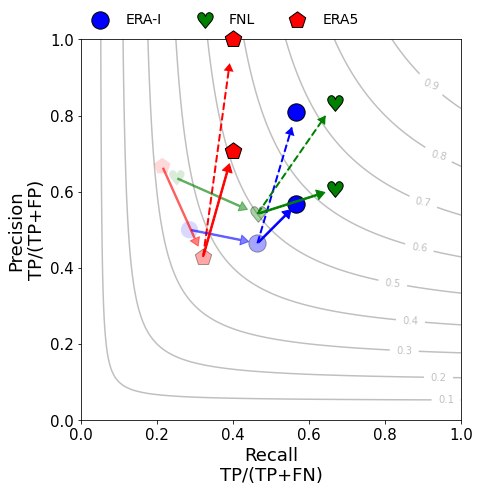

In [43]:
rec_2d,prec_2d = np.meshgrid(np.arange(0,1.05,0.01),np.arange(0,1.05,0.01))
meth_oi ='StaufferThompson2015'
fig,ax = plt.subplots(figsize=(16,7))
for cc,case in enumerate(cases):
    case_plt_dict = case_dict[case]['d0{}'.format(3)]

    cm_case = case
    marker_size = 300.0
    if marker_size == 0.0:
        marker_style = 'x'
        marker_size = 20
    else:
        marker_style = 'o'
    ax.scatter(confusion_matrix_dict_close[cm_case]['recall'],confusion_matrix_dict_close[cm_case]['precision'],
               marker=case_plt_dict['marker'], 
               c=case_plt_dict['color'], edgecolor='k', # Colors
               label=case_plt_dict['name'],
               s=marker_size,zorder=5)
    ax.scatter(confusion_matrix_dict[cm_case]['recall'],confusion_matrix_dict[cm_case]['precision'],
               marker=case_plt_dict['marker'], 
               c=case_plt_dict['color'], edgecolor='k', # Colors
               s=marker_size,zorder=5,
               clip_on=False)
    ax.scatter(obs_confusion_matrix_dict_with_numMinMax[case][meth_oi]['recall'],
               obs_confusion_matrix_dict_with_numMinMax[case][meth_oi]['precision'],
               marker=case_plt_dict['marker'], 
               c=case_plt_dict['color'], edgecolor='k', # Colors
               #label=case_plt_dict['name'],
               s=marker_size,zorder=5,alpha=0.35)
    ax.scatter(obs_confusion_matrix_dict[case][meth_oi]['recall'],
               obs_confusion_matrix_dict[case][meth_oi]['precision'],
               marker=case_plt_dict['marker'], 
               c=case_plt_dict['color'], edgecolor='none', # Colors
               #label=case_plt_dict['name'],
               s=marker_size,zorder=5,alpha=0.15)
    
    for narrow in range(0,3):
        if narrow == 0:
            arrow_xs = obs_confusion_matrix_dict_with_numMinMax[case][meth_oi]['recall']
            arrow_ys = obs_confusion_matrix_dict_with_numMinMax[case][meth_oi]['precision']
            arrow_xe = confusion_matrix_dict_close[case]['recall']
            arrow_ye = confusion_matrix_dict_close[case]['precision']
            arrow_alpha = 1.0
        if narrow == 1:
            arrow_xs = obs_confusion_matrix_dict_with_numMinMax[case][meth_oi]['recall']
            arrow_ys = obs_confusion_matrix_dict_with_numMinMax[case][meth_oi]['precision']
            arrow_xe = confusion_matrix_dict[case]['recall']
            arrow_ye = confusion_matrix_dict[case]['precision']
            arrow_alpha = 1.0
        if narrow == 2:
            arrow_xs = obs_confusion_matrix_dict[case][meth_oi]['recall']
            arrow_ys = obs_confusion_matrix_dict[case][meth_oi]['precision']
            arrow_xe = obs_confusion_matrix_dict_with_numMinMax[case][meth_oi]['recall']
            arrow_ye = obs_confusion_matrix_dict_with_numMinMax[case][meth_oi]['precision']
            arrow_alpha = 0.5

        arrow_lenx = 0.9*(arrow_xe - arrow_xs)
        arrow_leny = 0.9*(arrow_ye - arrow_ys)

        arrow_xe = arrow_xs + arrow_lenx
        arrow_ye = arrow_ys + arrow_leny


        connection_style = None
        if narrow == 1: 
            arrow = patches.FancyArrowPatch((arrow_xs,arrow_ys),(arrow_xe,arrow_ye),connectionstyle=connection_style,
                                            color=case_dict[case]['d0{}'.format(3)]['color'],alpha=arrow_alpha,
                                            arrowstyle='Simple, head_width=10, head_length=8',
                                            zorder=100,lw=0.0)
            ax.add_patch(arrow)
            arrow_xe = arrow_xs + arrow_lenx*0.98
            arrow_ye = arrow_ys + arrow_leny*0.98
            ax.plot([arrow_xs,arrow_xe],[arrow_ys,arrow_ye],ls='--',lw=2.0,
                     color=case_dict[case]['d0{}'.format(3)]['color'])
        else:
            arrow = patches.FancyArrowPatch((arrow_xs,arrow_ys),(arrow_xe,arrow_ye),connectionstyle=connection_style,
                                            color=case_dict[case]['d0{}'.format(3)]['color'],alpha=arrow_alpha,
                                            arrowstyle='Simple, tail_width=1.5, head_width=10, head_length=8',
                                            zorder=100)            

            ax.add_patch(arrow)    

    
    
f1_lines = ax.contour(rec_2d,prec_2d,2.0*((prec_2d*rec_2d)/(prec_2d+rec_2d)),
                             levels=np.arange(0.1,1,0.1),colors='k',alpha=0.25,zorder=0)
f1_lbls = plt.clabel(f1_lines,fmt='%1.1f',inline=0)#,zorder=1)
[txt.set_bbox(dict(boxstyle='square,pad=0.6',fc='w',ec='w',zorder=1)) for txt in f1_lbls]
ax.set_xticks(np.arange(0,1.1,0.2))
ax.set_yticks(np.arange(0,1.1,0.2))
ax.set_ylim(0.0,1.0)
ax.set_xlim(0.0,1.0)
ax.set_aspect('equal')
ax.legend(loc=(0.0,1.02),frameon=False,fontsize=14,ncol=3)
ax.tick_params(labelsize=15)
ax.set_xlabel('Recall\nTP/(TP+FN)',size=18)

#ax.text(0.12,0.79,'{}.)'.format(ascii_lowercase[pltax]),ha='left',va='top',size=16)
ax.set_ylabel('Precision\nTP/(TP+FP)',size=18)

#if save_figs:
#    figname = '{}F1Score_{}'.format(save_dir,meth_oi)
#    plt.savefig('{}.png'.format(figname), bbox_inches = 'tight',pad_inches = 0.1)
#    plt.savefig('{}.pdf'.format(figname), bbox_inches = 'tight',pad_inches = 0.1)
#plt.savefig('{}WRFSkillMetrics.pdf'.format(save_dir), bbox_inches = 'tight',pad_inches = 0.1)
plt.show()